In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
import matplotlib as mpl

In [2]:
sys.path.append("/home/surajrai1900/Particle_Gun")

In [3]:
import create_file
import watchmal_dependencies.binning as bins
import Classification_model 
import cuts
from utils import classification_metrics, plot

In [4]:
font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : 28}
mpl.rc('font', **font)
mpl.rcParams['figure.figsize'] = (12, 9)
mpl.rcParams["figure.autolayout"] = True

In [5]:
# Creating relevant features dataframe for e/mu analysis , one has no preselection applied and other has preselection applied

df = create_file.relevant_df(apply_presel=False, select_labels=[1, 2], discriminator=True)
df_base = create_file.relevant_df(apply_presel=True, select_labels=[1, 2], discriminator=True)

In [6]:
df

,pe,pmu,h5_labels,h5_momentum,h5_towall,h5_dwall,cos_zenith,azimuth,event_index,h5_vetos,...,reco_electron_mom,reco_electron_dwall,reco_electron_towall,pi0_mass,flag_e,flag_mu,flag_pi0,true_sig,fq_discriminator,softmax_discriminator
1182377,1.000000e+00,1.021306e-10,1,245.001085,190.761574,64.608521,-0.723887,-115.434723,0,False,...,206.956848,78.522018,180.486992,7.229472,0,0,1,1,13.992118,0.354346
1182378,9.999999e-01,9.966448e-08,1,855.768398,337.385819,67.418274,0.391861,146.188995,1,False,...,842.675598,75.189301,348.900632,79.580574,0,0,0,1,600.142578,0.354346
1182379,9.999872e-01,1.277478e-05,1,597.023336,138.040446,60.461700,-0.892171,-123.714195,2,False,...,233.178909,77.010956,151.587330,1.507910,1,1,0,1,41.082775,0.354333
1182380,9.999959e-01,4.041329e-06,1,402.785832,251.795181,176.367126,0.700439,-35.238598,3,False,...,382.876282,176.663071,251.733536,6.669949,0,0,0,1,192.432541,0.354342
1182381,9.999942e-01,5.822238e-06,1,830.345780,267.159357,187.088364,0.467167,162.244781,4,False,...,906.258545,188.501816,259.277523,10.406991,0,0,0,1,1209.833496,0.354340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3524477,5.142843e-19,1.000000e+00,2,579.695268,491.248047,31.538849,-0.064201,119.118027,7064962,False,...,328.118530,47.647659,286.661499,24.705700,0,0,0,0,-308.275787,-0.645654
3524478,4.464603e-27,1.000000e+00,2,1001.043398,178.580150,129.652344,-0.635664,-128.650803,7064963,True,...,400.317322,138.309235,175.155650,13.315305,1,0,2,0,-231.610352,-0.645654
3524479,6.590432e-01,3.409568e-01,2,945.693831,33.418060,31.273712,0.305655,81.230019,7064964,True,...,18.327209,9.576324,597.651026,41.853645,0,0,1,0,120.456078,0.013389
3524480,2.498987e-09,1.000000e+00,2,889.349346,372.878450,298.996674,0.294807,-82.344650,7064965,False,...,771.922607,280.669922,326.482257,8.297816,0,0,2,0,-318.540100,-0.645654


In [7]:
df_base

,pe,pmu,h5_labels,h5_momentum,h5_towall,h5_dwall,cos_zenith,azimuth,event_index,h5_vetos,...,reco_electron_mom,reco_electron_dwall,reco_electron_towall,pi0_mass,flag_e,flag_mu,flag_pi0,true_sig,fq_discriminator,softmax_discriminator
1182377,1.000000e+00,1.021306e-10,1,245.001085,190.761574,64.608521,-0.723887,-115.434723,0,False,...,206.956848,78.522018,180.486992,7.229472,0,0,1,1,22.948589,0.369043
1182378,9.999999e-01,9.966448e-08,1,855.768398,337.385819,67.418274,0.391861,146.188995,1,False,...,842.675598,75.189301,348.900632,79.580574,0,0,0,1,513.741211,0.369043
1182379,9.999872e-01,1.277478e-05,1,597.023336,138.040446,60.461700,-0.892171,-123.714195,2,False,...,233.178909,77.010956,151.587330,1.507910,1,1,0,1,46.105938,0.369030
1182380,9.999959e-01,4.041329e-06,1,402.785832,251.795181,176.367126,0.700439,-35.238598,3,False,...,382.876282,176.663071,251.733536,6.669949,0,0,0,1,175.001099,0.369039
1182381,9.999942e-01,5.822238e-06,1,830.345780,267.159357,187.088364,0.467167,162.244781,4,False,...,906.258545,188.501816,259.277523,10.406991,0,0,0,1,1113.894775,0.369037
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3524471,9.076331e-16,1.000000e+00,2,709.561183,265.558551,95.014374,0.342564,6.189363,7064956,True,...,558.464844,105.628418,235.168786,43.944153,0,0,0,0,-291.022583,-0.630957
3524474,3.064815e-11,1.000000e+00,2,350.665030,543.774475,77.192368,0.961442,88.804344,7064959,False,...,140.788834,131.853897,481.732300,0.376510,0,0,0,0,-127.121681,-0.630957
3524475,3.261246e-06,9.999967e-01,2,527.210268,135.545402,101.175323,0.447474,-145.831833,7064960,True,...,333.796509,96.432709,120.223535,44.882015,1,0,1,0,-1.294128,-0.630954
3524478,4.464603e-27,1.000000e+00,2,1001.043398,178.580150,129.652344,-0.635664,-128.650803,7064963,True,...,400.317322,138.309235,175.155650,13.315305,1,0,2,0,-251.657959,-0.630957


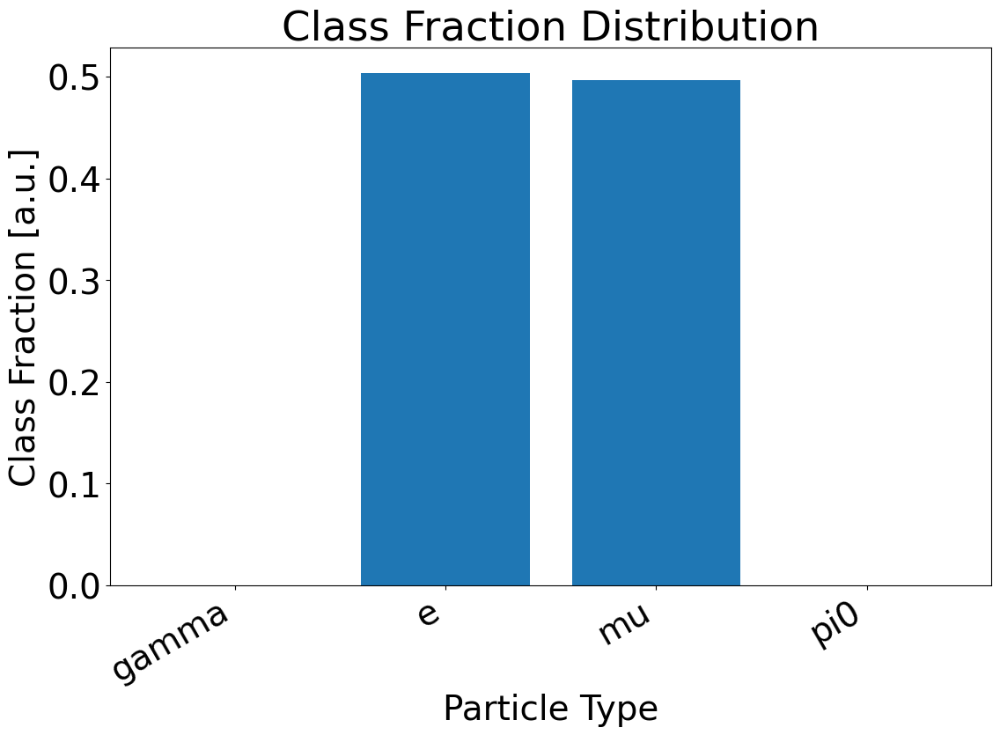

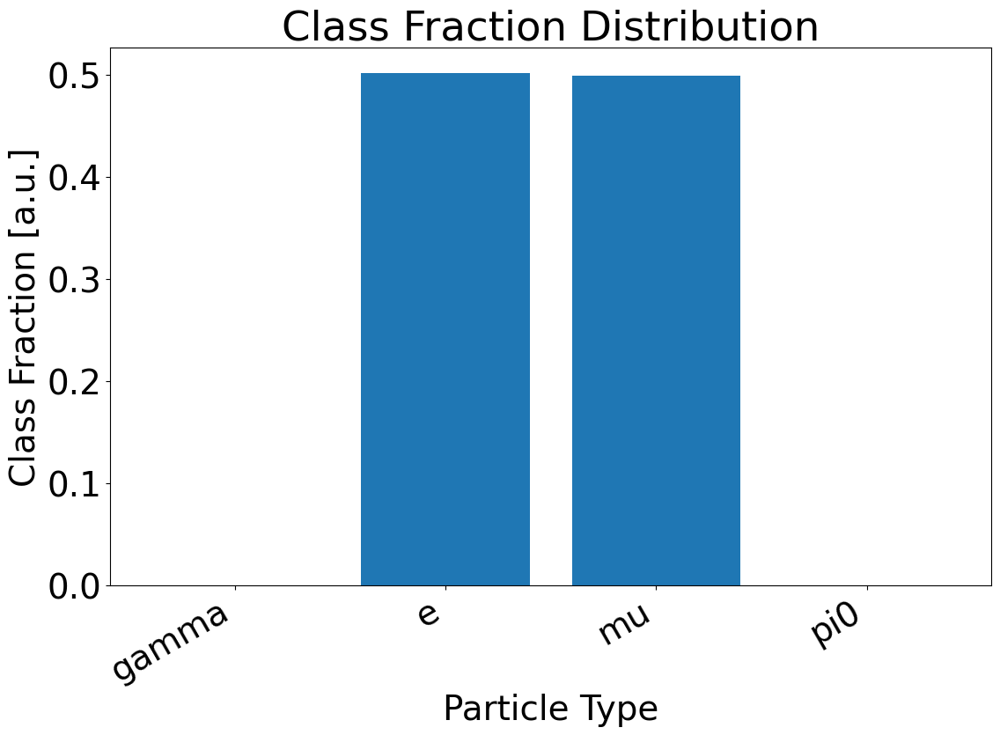

<Figure size 1200x900 with 0 Axes>

In [8]:
#Plotting class fraction for both the dataframes

plot.class_frac(df)
plot.class_frac(df_base)

## e/mu selection comparison between FiTQun, ResNet, and bdt_model using f1 scoring

In [9]:
# Getting Cuts before preselection
fq_emu = cuts.fq_cuts(df)
ml_emu = cuts.ml_cuts(df)

# Getting Cuts after preselection
fq_emu_base = cuts.fq_cuts(df_base)
ml_emu_base = cuts.ml_cuts(df_base)

train features: ['pe', 'pmu', 'reco_electron_mom', 'reco_electron_dwall', 'reco_electron_towall', 'true_sig']
train labels: [1, 2]
grid search: False
model name: gbdt
Scoring: f1
Save path: /home/surajrai1900/outputs/gbdt/emu_softmax/
The hyperparameters are: n_estimators = 300, max_depth = 13, learning rate = 0.01
Using gbdt model
The train accuracy is:0.9647196436792685
The train f1 score is: 0.9645697082106905


The test accuracy is:0.9613036542147132
The test f1 score is: 0.9613215442273406
The best threshold is : 0.49


pe : 0.4102361651181147
pmu : 0.53560245223787
reco_electron_mom : 0.01875646363645824
reco_electron_dwall : 0.01758354722687739
reco_electron_towall : 0.017821371780679482


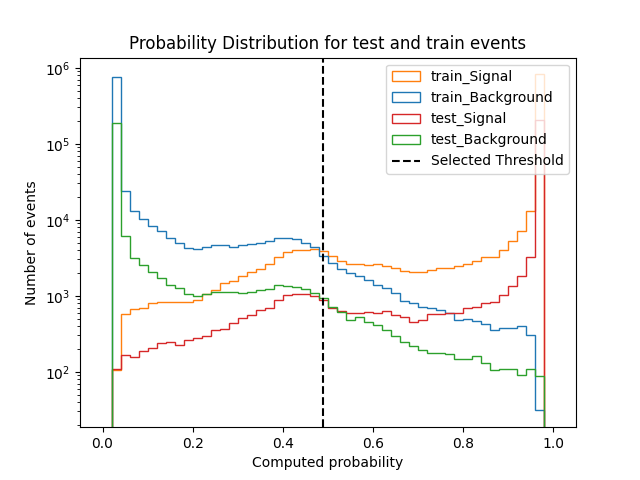

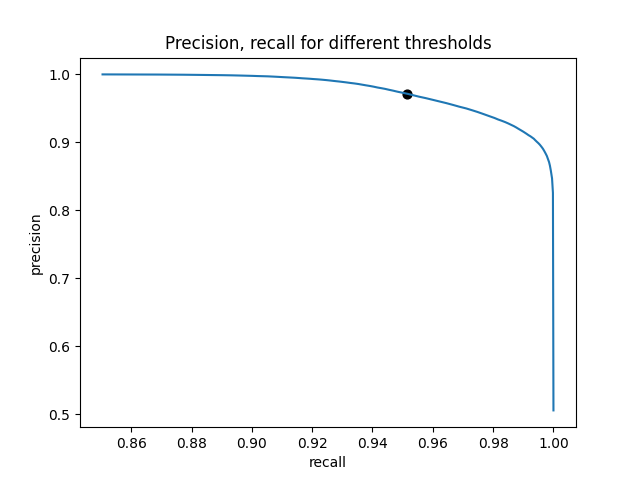

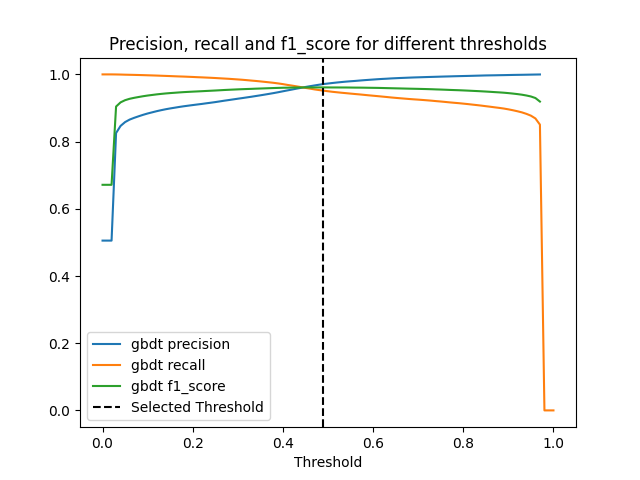

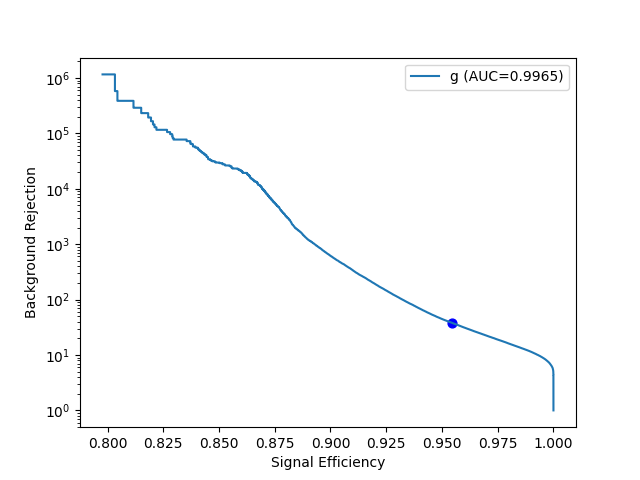

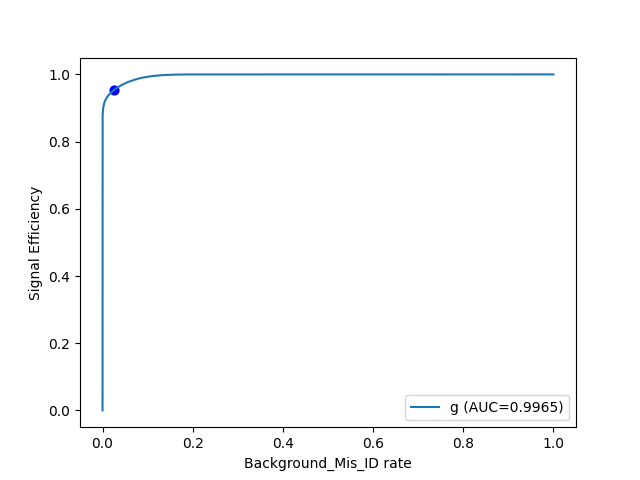

In [10]:
# Using only FiTQun variables for training and testing the model, without applying preselection

bdt_ml_prob, bdt_ml_cut = Classification_model.run_output('/home/surajrai1900/outputs/gbdt/emu_softmax/', grid_search=False)

(<Figure size 2000x1000 with 4 Axes>,
 array([<AxesSubplot: title={'center': 'Signal'}, xlabel='reco_electron_towall', ylabel='bdt_ml_prob'>,
        <AxesSubplot: title={'center': 'Background'}, xlabel='reco_electron_towall', ylabel='bdt_ml_prob'>],
       dtype=object))

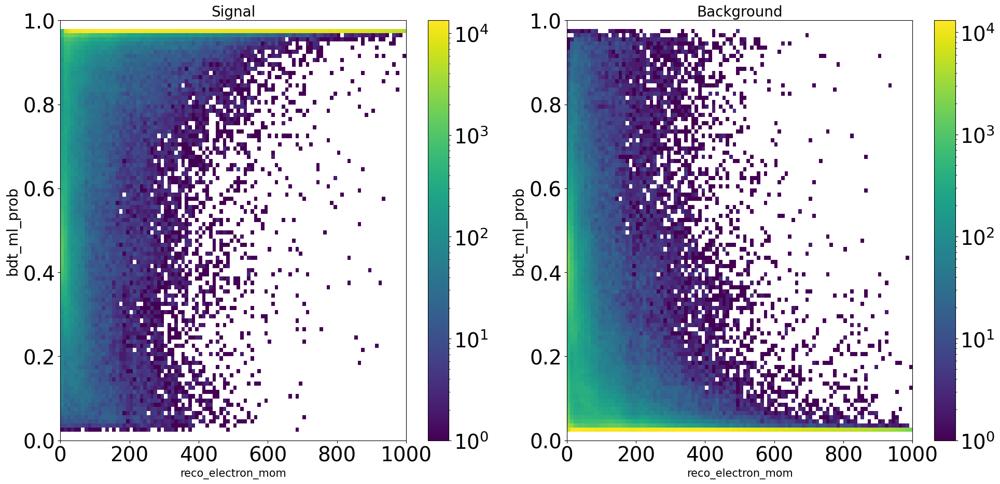

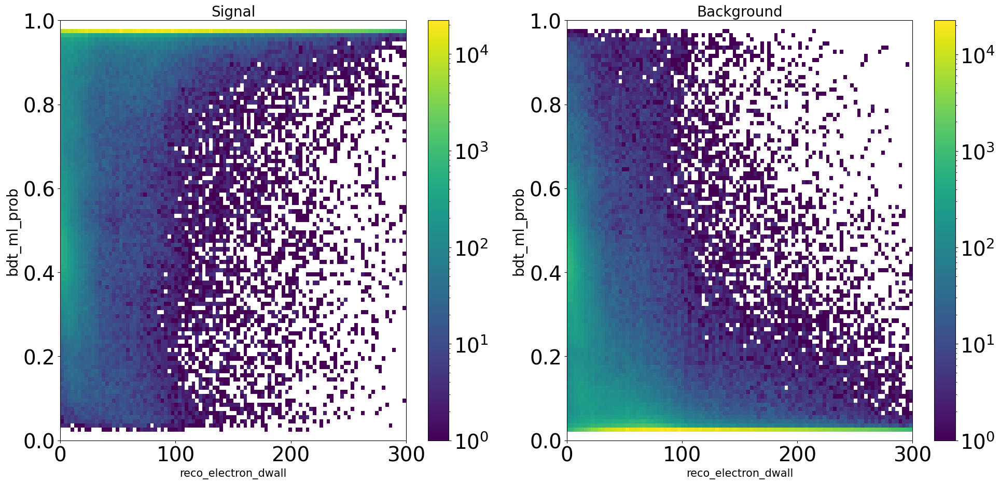

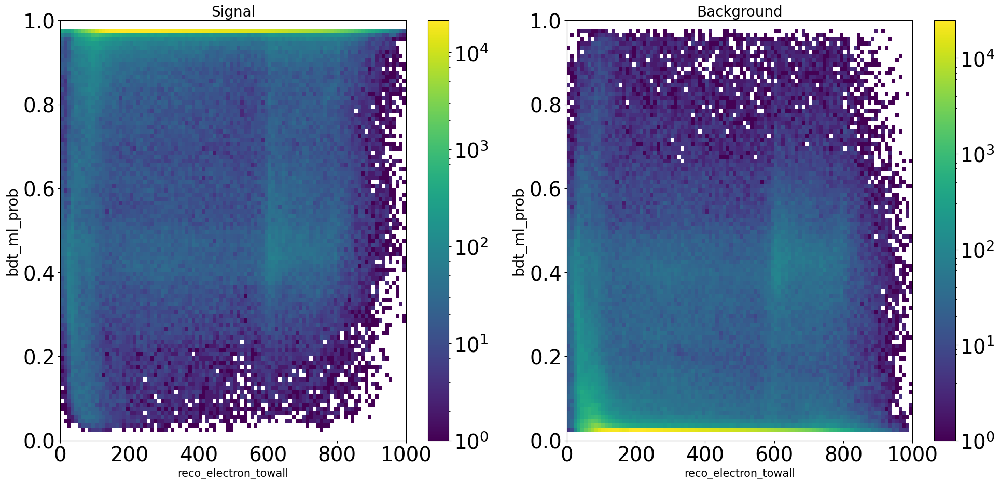

In [11]:
df['bdt_ml_prob'] = bdt_ml_prob
plot.sg_bg_hist2d(df, 'reco_electron_mom', 'bdt_ml_prob', [0, 1000], [0, 1], 100, 100, logbin_y=False, true_sig=True)
plot.sg_bg_hist2d(df, 'reco_electron_dwall', 'bdt_ml_prob', [0, 300], [0, 1], 100, 100, logbin_y=False, true_sig=True)
plot.sg_bg_hist2d(df, 'reco_electron_towall', 'bdt_ml_prob', [0, 1000], [0, 1], 100, 100, logbin_y=False, true_sig=True)

(<Figure size 2000x1000 with 4 Axes>,
 array([<AxesSubplot: title={'center': 'Signal'}, xlabel='h5_momentum', ylabel='bdt_ml_prob'>,
        <AxesSubplot: title={'center': 'Background'}, xlabel='h5_momentum', ylabel='bdt_ml_prob'>],
       dtype=object))

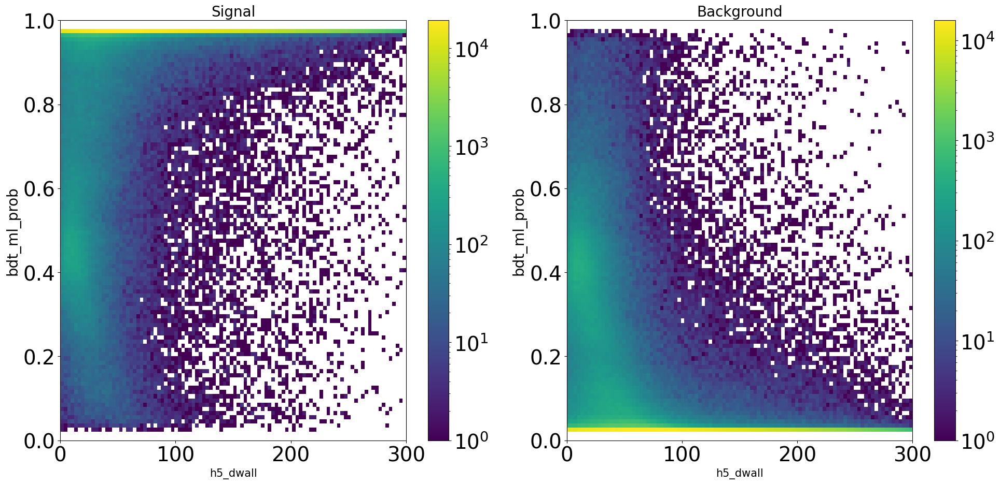

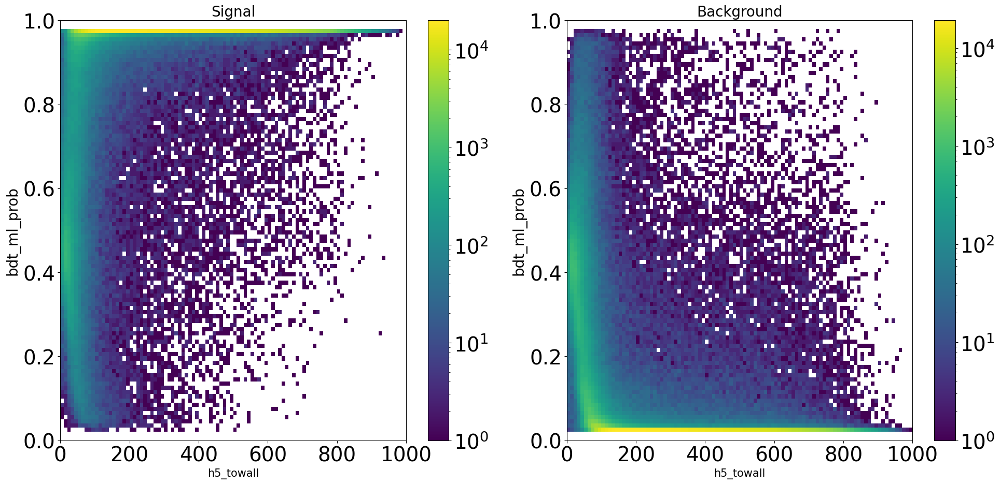

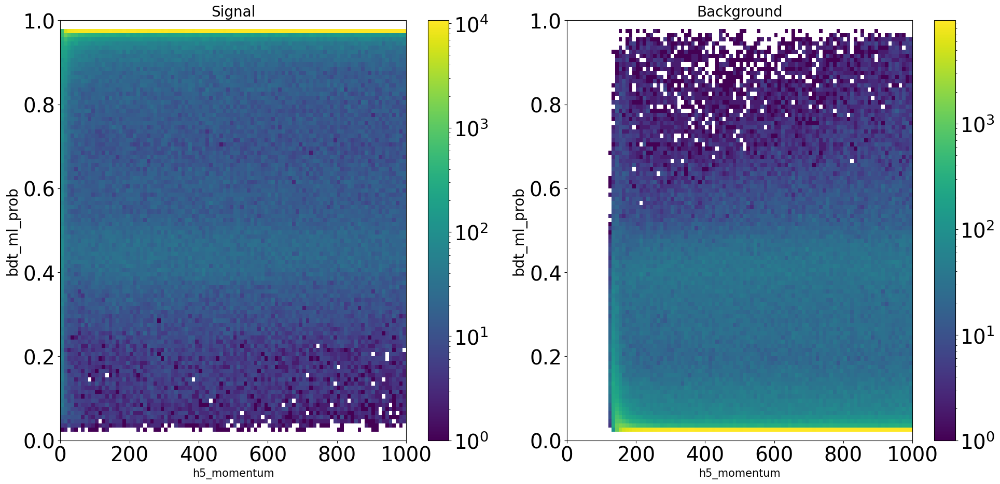

In [12]:
plot.sg_bg_hist2d(df, 'h5_dwall', 'bdt_ml_prob', [0, 300], [0, 1], 100, 100, logbin_y=False, true_sig=True)
plot.sg_bg_hist2d(df, 'h5_towall', 'bdt_ml_prob', [0, 1000], [0, 1], 100, 100, logbin_y=False, true_sig=True)
plot.sg_bg_hist2d(df, 'h5_momentum', 'bdt_ml_prob', [0, 1000], [0, 1], 100, 100, logbin_y=False, true_sig=True)

train features: ['pe', 'pmu', 'reco_electron_mom', 'reco_electron_towall', 'reco_electron_dwall', 'true_sig']
train labels: [1, 2]
grid search: False
model name: gbdt
Scoring: f1
Save path: /home/surajrai1900/outputs/gbdt/emu_pre_softmax/
The hyperparameters are: n_estimators = 300, max_depth = 13, learning rate = 0.01
Using gbdt model
The train accuracy is:0.9985136519425692
The train f1 score is: 0.9985177037884142


The test accuracy is:0.9981082877447722
The test f1 score is: 0.9981119283844959
The best threshold is : 0.48


pe : 0.5091748124232678
pmu : 0.4786392590146705
reco_electron_mom : 0.004078623320950698
reco_electron_towall : 0.004230654052443944
reco_electron_dwall : 0.003876651188666963


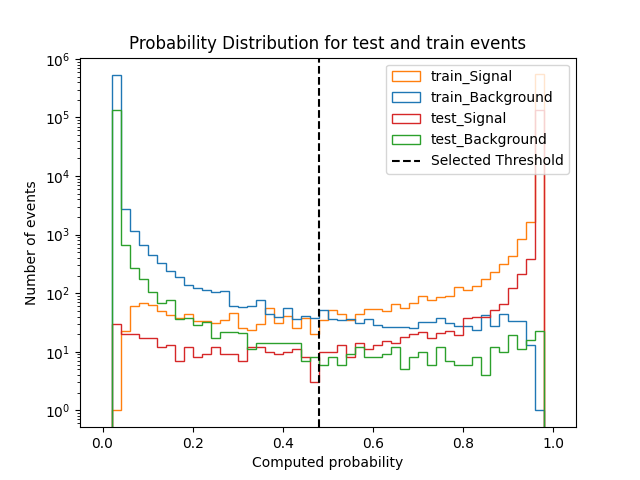

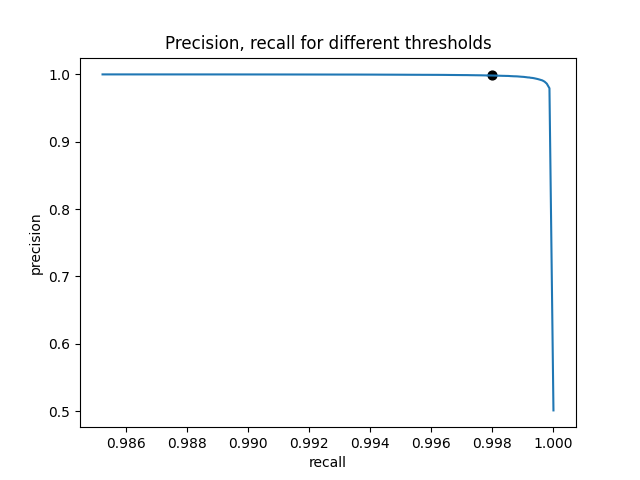

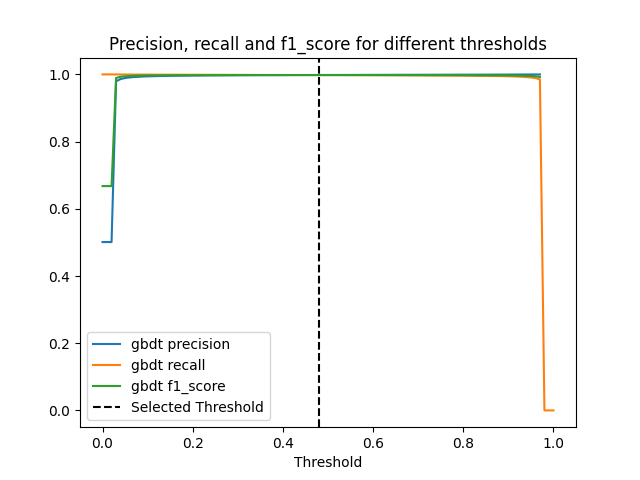

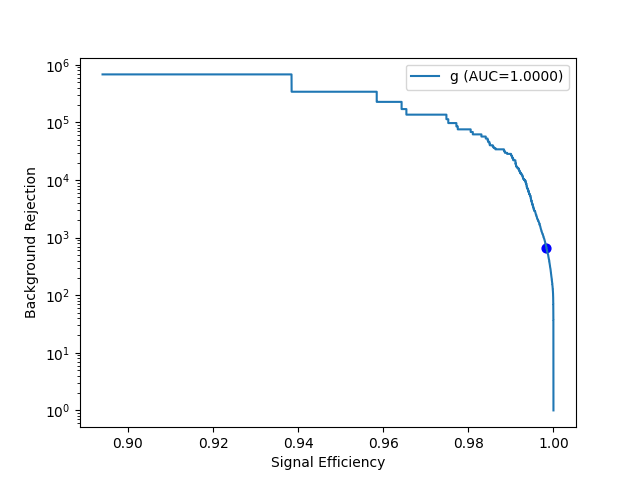

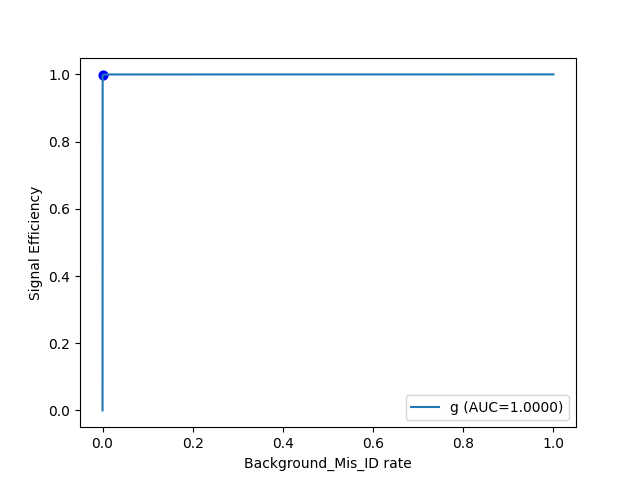

In [13]:
# Using only FiTQun variables for training and testing the model, with applying preselection

bdt_ml_prob_base, bdt_ml_cut_base = Classification_model.run_output('/home/surajrai1900/outputs/gbdt/emu_pre_softmax/', grid_search=False)

(<Figure size 2000x1000 with 4 Axes>,
 array([<AxesSubplot: title={'center': 'Signal'}, xlabel='reco_electron_towall', ylabel='bdt_ml_prob_base'>,
        <AxesSubplot: title={'center': 'Background'}, xlabel='reco_electron_towall', ylabel='bdt_ml_prob_base'>],
       dtype=object))

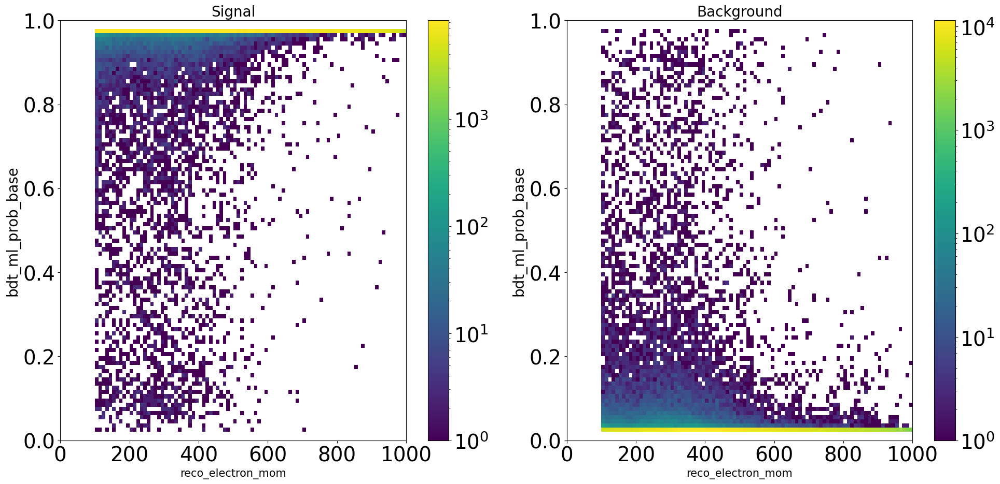

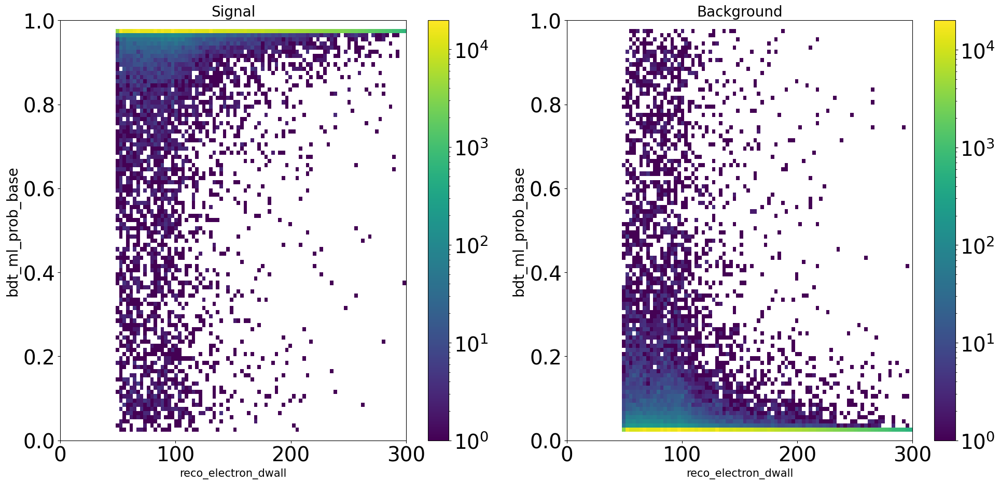

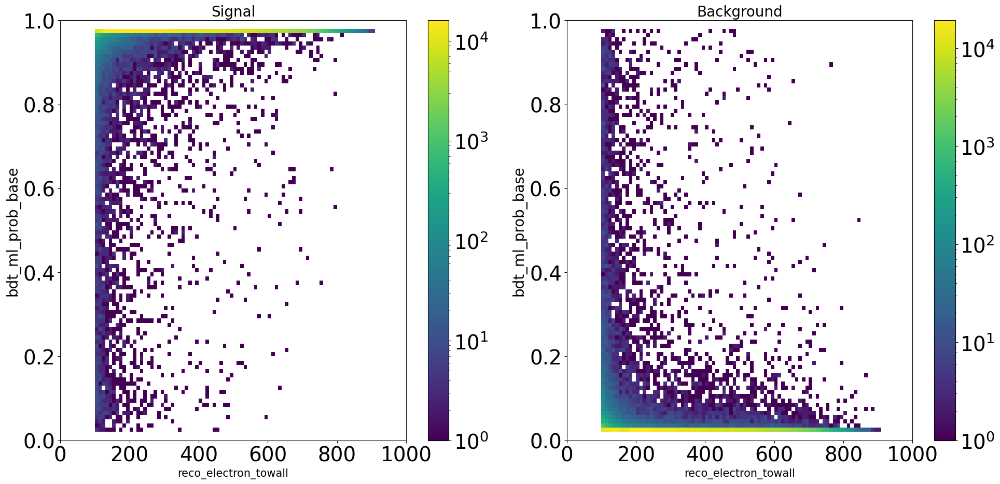

In [14]:
df_base['bdt_ml_prob_base'] = bdt_ml_prob_base
plot.sg_bg_hist2d(df_base, 'reco_electron_mom', 'bdt_ml_prob_base', [0, 1000], [0, 1], 100, 100, logbin_y=False, true_sig=True)
plot.sg_bg_hist2d(df_base, 'reco_electron_dwall', 'bdt_ml_prob_base', [0, 300], [0, 1], 100, 100, logbin_y=False, true_sig=True)
plot.sg_bg_hist2d(df_base, 'reco_electron_towall', 'bdt_ml_prob_base', [0, 1000], [0, 1], 100, 100, logbin_y=False, true_sig=True)

(<Figure size 2000x1000 with 4 Axes>,
 array([<AxesSubplot: title={'center': 'Signal'}, xlabel='reco_electron_dwall', ylabel='bdt_ml_prob_base'>,
        <AxesSubplot: title={'center': 'Background'}, xlabel='reco_electron_dwall', ylabel='bdt_ml_prob_base'>],
       dtype=object))

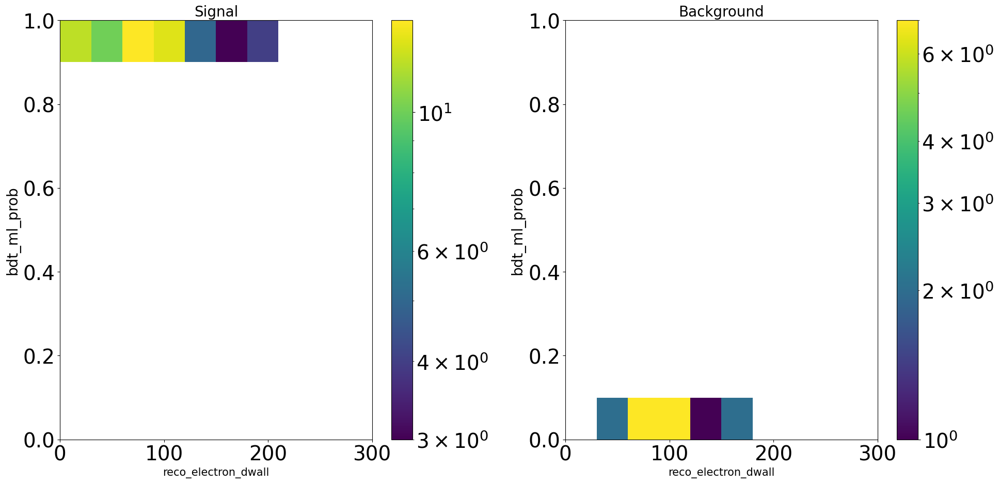

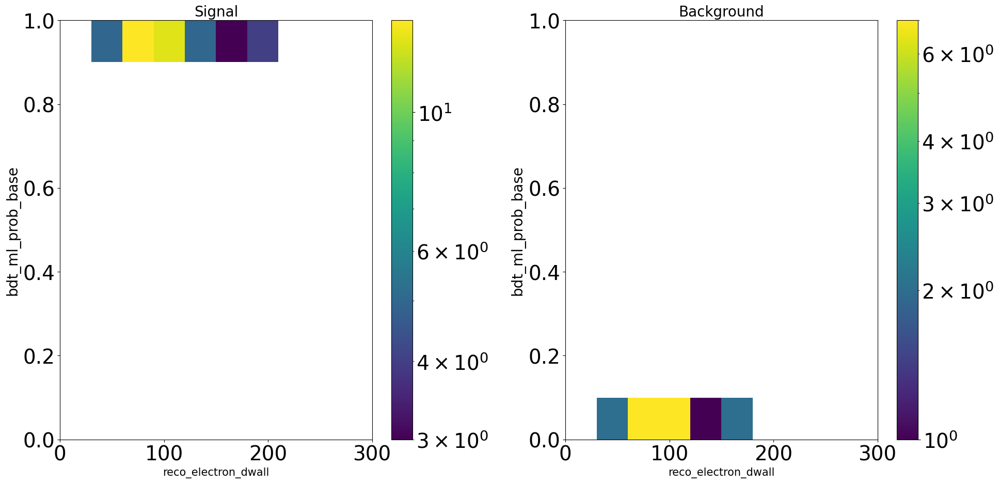

In [15]:
i = 700
cut = (((df['reco_electron_mom'] > i) & (df['reco_electron_mom'] < i + 10))
       & ((df['reco_electron_towall'] > i) & (df['reco_electron_towall'] < i + 10)))

# plot.sg_bg_hist2d(df[cut], 'reco_electron_mom', 'bdt_ml_prob', [0, 1000], [0, 1], 10, 10, logbin_y=False, true_sig=True)
plot.sg_bg_hist2d(df[cut], 'reco_electron_dwall', 'bdt_ml_prob', [0, 300], [0, 1], 10, 10, logbin_y=False, true_sig=True)
# plot.sg_bg_hist2d(df[cut], 'reco_electron_towall', 'bdt_ml_prob', [0, 1000], [0, 1], 10, 10, logbin_y=False, true_sig=True)


cut_base = (((df_base['reco_electron_mom'] > i) & (df_base['reco_electron_mom'] < i + 10))
       & ((df_base['reco_electron_towall'] > i) & (df_base['reco_electron_towall'] < i + 10)))

# plot.sg_bg_hist2d(df_base[cut_base], 'reco_electron_mom', 'bdt_ml_prob_base', [0, 1000], [0, 1], 10, 10, logbin_y=False, true_sig=True)
plot.sg_bg_hist2d(df_base[cut_base], 'reco_electron_dwall', 'bdt_ml_prob_base', [0, 300], [0, 1], 10, 10, logbin_y=False, true_sig=True)
# plot.sg_bg_hist2d(df_base[cut_base], 'reco_electron_towall', 'bdt_ml_prob_base', [0, 1000], [0, 1], 10, 10, logbin_y=False, true_sig=True)

In [16]:
# Looking at statistics of the bdt  before and after preselection

print('Signal and background statistics before applying preselection for bdt')
sig_eff_emu = classification_metrics.sg_eff(df['true_sig'], bdt_ml_cut)
bg_rej_emu = classification_metrics.bg_rej(df['true_sig'], bdt_ml_cut)
print(f"The signal event count after applying cuts is : {np.sum(df[bdt_ml_cut]['h5_labels'] == 1)}")
print(f"The background event count after applying cuts is : {np.sum(df[bdt_ml_cut]['h5_labels'] == 2)}")
print(f"The signal efficiency is: {sig_eff_emu}")
print(f"The background rejection is: {bg_rej_emu}")

print('\n')

print('Signal and background statistics after applying preselection for bdt')
sig_eff_emu_base = classification_metrics.sg_eff(df_base['true_sig'], bdt_ml_cut_base)
bg_rej_emu_base = classification_metrics.bg_rej(df_base['true_sig'], bdt_ml_cut_base)
print(f"The signal event count after applying cuts is : {np.sum(df_base[bdt_ml_cut_base]['h5_labels'] == 1)}")
print(f"The background event count after applying cuts is : {np.sum(df_base[bdt_ml_cut_base]['h5_labels'] == 2)}")
print(f"The signal efficiency is: {sig_eff_emu_base}")
print(f"The background rejection is: {bg_rej_emu_base}")

Signal and background statistics before applying preselection for bdt
The signal event count after applying cuts is : 1121656
The background event count after applying cuts is : 30365
The signal efficiency is: 0.954385606650415
The background rejection is: 0.9738167300445801


Signal and background statistics after applying preselection for bdt
The signal event count after applying cuts is : 685252
The background event count after applying cuts is : 1014
The signal efficiency is: 0.9983507774073987
The background rejection is: 0.9985148166809229


In [17]:
# Defining array of cuts, algorithms and probabilities for comparison between fitqun, softmax, and bdt cuts

cuts = [fq_emu, ml_emu, bdt_ml_cut]
probs = [df['fq_discriminator'], df['softmax_discriminator'], bdt_ml_prob]
algorithms = ['FiTQun', 'Softmax', 'BDT']

cuts_base = [fq_emu_base, ml_emu_base, bdt_ml_cut_base]
probs_base = [df_base['fq_discriminator'], df_base['softmax_discriminator'], bdt_ml_prob_base]
algorithms_base = ['FiTQun_base', 'Softmax_base', 'BDT_base']

In [18]:
# Getting the signal efficiency and background rejection for all different cuts before and after applying preselection

sig_eff = classification_metrics.sg_eff(df['true_sig'], cuts)
bg_rej = classification_metrics.bg_rej(df['true_sig'], cuts)

for i in range(len(sig_eff)):
    print(f'The signal efficiency  and background rejection for {algorithms[i]} cuts is : {round(sig_eff[i], 3)}, {round(bg_rej[i], 3)}')
    
print('\n')

sig_eff_base = classification_metrics.sg_eff(df_base['true_sig'], cuts_base)
bg_rej_base = classification_metrics.bg_rej(df_base['true_sig'], cuts_base)

for i in range(len(sig_eff_base)):
    print(f'The signal efficiency  and background rejection for {algorithms_base[i]} cuts is : {round(sig_eff_base[i], 3)}, {round(bg_rej_base[i], 3)}')

The signal efficiency  and background rejection for FiTQun cuts is : 0.91, 0.833
The signal efficiency  and background rejection for Softmax cuts is : 0.949, 0.972
The signal efficiency  and background rejection for BDT cuts is : 0.954, 0.974


The signal efficiency  and background rejection for FiTQun_base cuts is : 0.943, 0.943
The signal efficiency  and background rejection for Softmax_base cuts is : 0.998, 0.999
The signal efficiency  and background rejection for BDT_base cuts is : 0.998, 0.999


In [19]:
# Getting f1, precision and recall score for all different cuts before and after applying preselection

prec, rec, f1 = classification_metrics.f1(df['true_sig'], cuts)

for i in range(len(prec)):
    print(f'The precision, recall and f1 score for  {algorithms[i]} cuts is : {round(prec[i], 3)}, {round(rec[i], 3)}, {round(f1[i], 3)}')
    
print('\n')

prec_base, rec_base, f1_base = classification_metrics.f1(df_base['true_sig'], cuts_base)

for i in range(len(prec_base)):
    print(f'The precision, recall and f1 score for  {algorithms_base[i]} cuts is : {round(prec_base[i], 3)}, {round(rec_base[i], 3)}, {round(f1_base[i], 3)}')

The precision, recall and f1 score for  FiTQun cuts is : 0.846, 0.91, 0.877
The precision, recall and f1 score for  Softmax cuts is : 0.972, 0.949, 0.96
The precision, recall and f1 score for  BDT cuts is : 0.974, 0.954, 0.964


The precision, recall and f1 score for  FiTQun_base cuts is : 0.943, 0.943, 0.943
The precision, recall and f1 score for  Softmax_base cuts is : 0.999, 0.998, 0.998
The precision, recall and f1 score for  BDT_base cuts is : 0.999, 0.998, 0.998


(<Figure size 1200x900 with 1 Axes>,
 <AxesSubplot: xlabel='Background_Mis_ID rate', ylabel='Signal Efficiency'>)

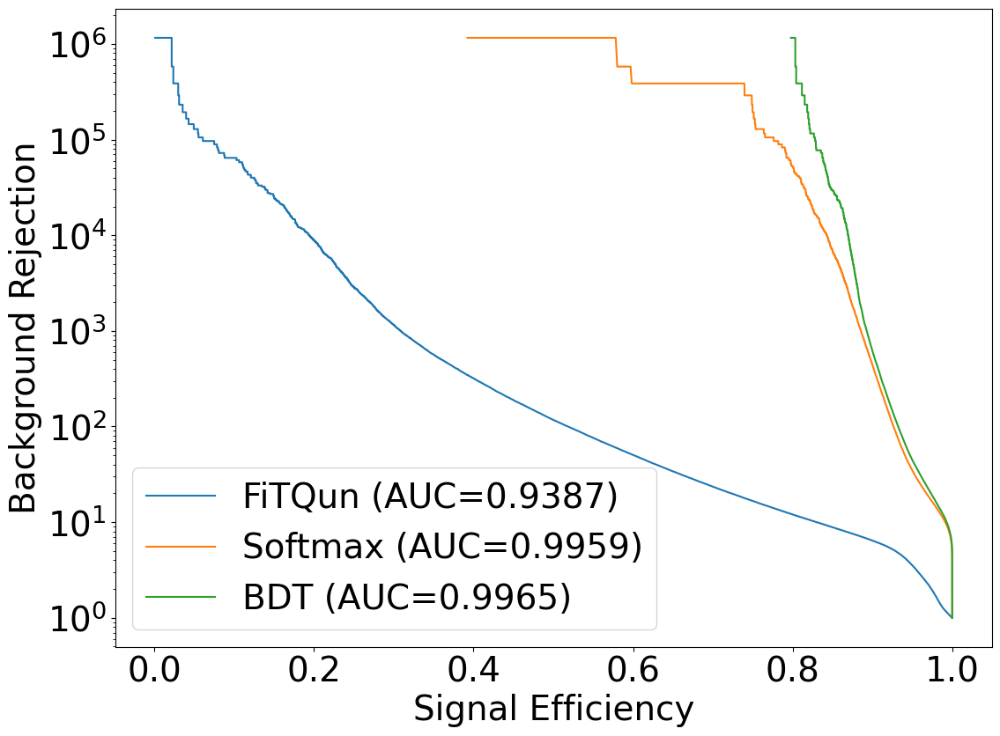

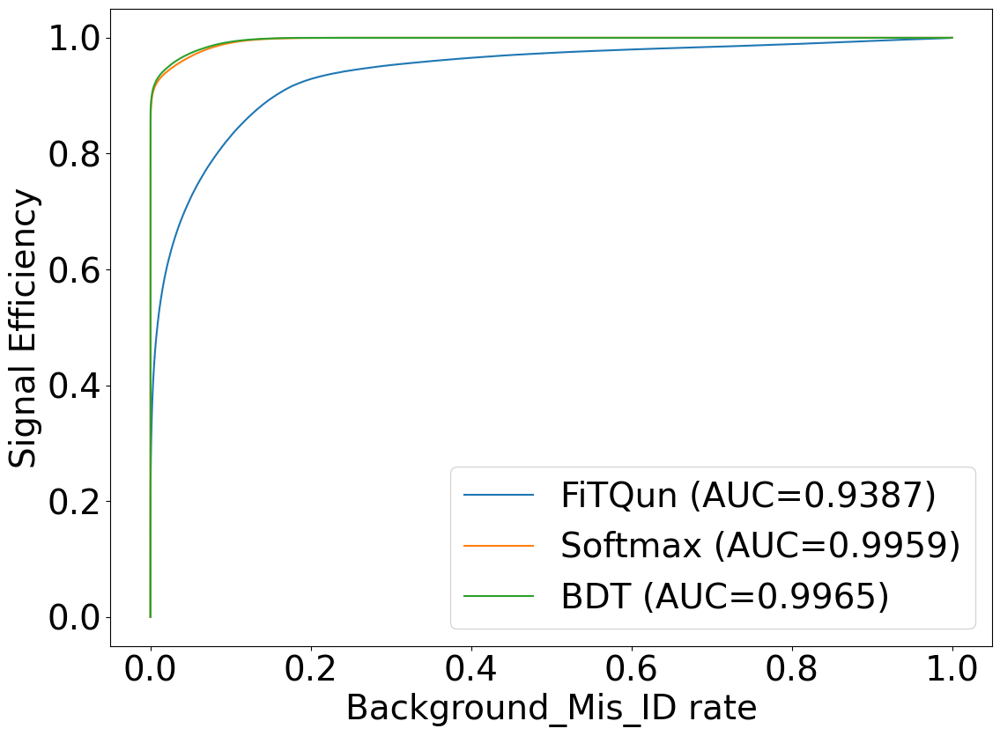

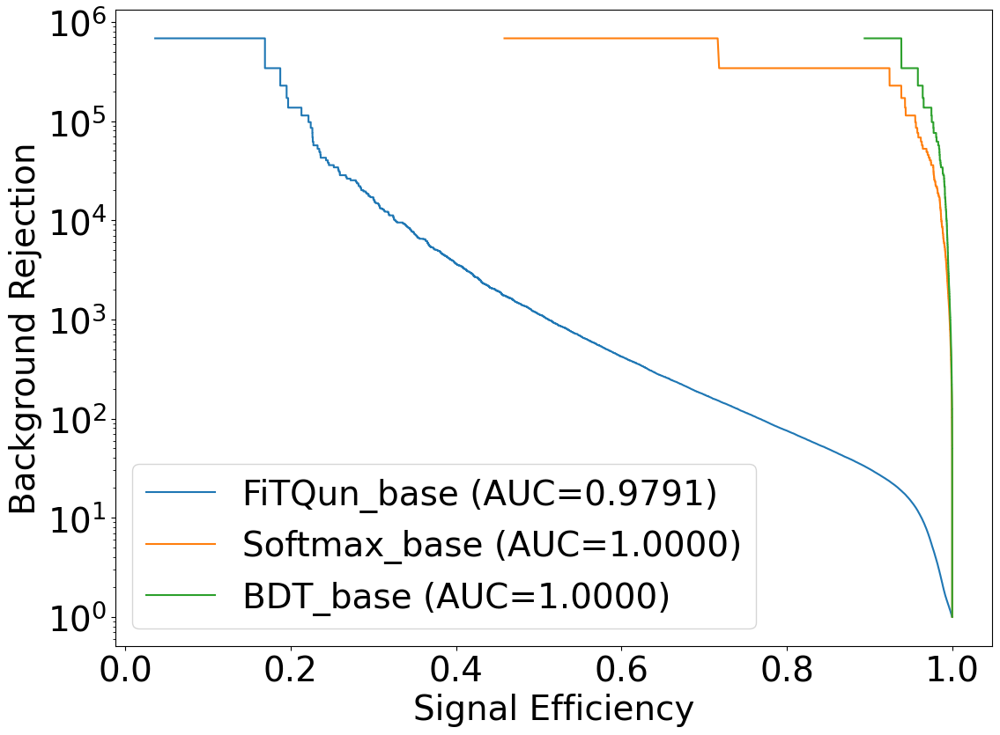

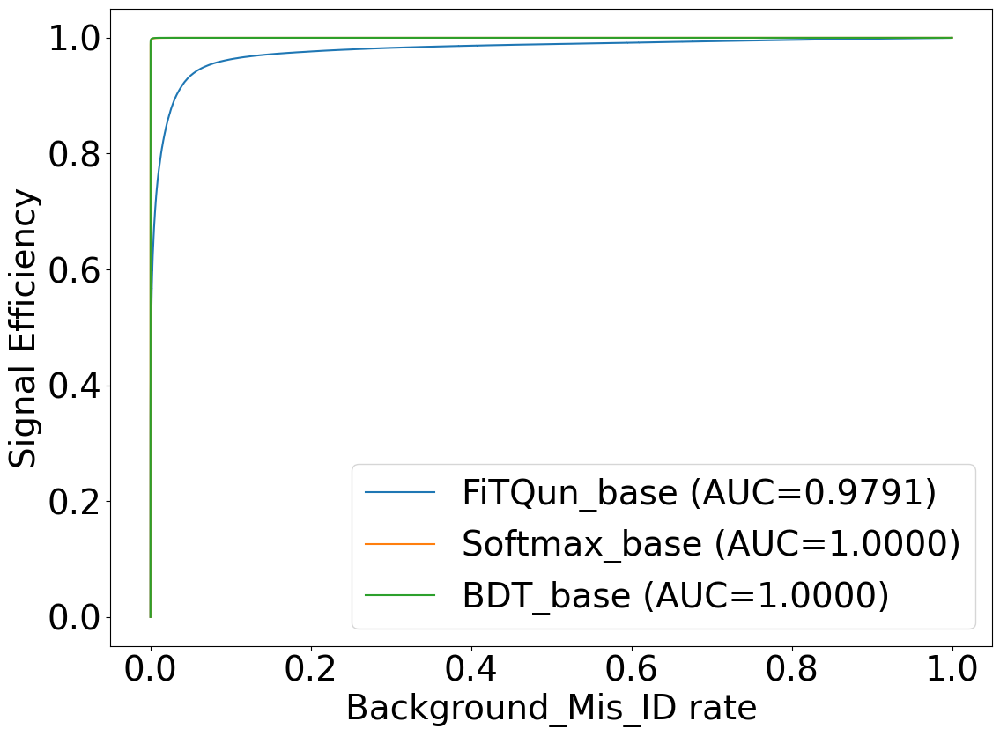

In [20]:
# Plotting roc curves for all the algorithms before and after preselection:

plot.roc(df['true_sig'], probs, algorithms, mode='rejection')
plot.roc(df['true_sig'], probs, algorithms, mode='efficiency')

plot.roc(df_base['true_sig'], probs_base, algorithms_base, mode='rejection')
plot.roc(df_base['true_sig'], probs_base, algorithms_base, mode='efficiency')

In [21]:
# Binning some varibales:

mom_binning = bins.get_binning(df['h5_momentum'], 20, 0, 1000)
reco_mom_e_binning = bins.get_binning(df['reco_electron_mom'], 20, 0, 1000)
dwall_binning = bins.get_binning(df['h5_dwall'], 20, 0, 300)
reco_dwall_binning = bins.get_binning(df['reco_electron_dwall'], 20, 0, 300)
towall_binning = bins.get_binning(df['h5_towall'], 20, 0, 800)
reco_towall_binning = bins.get_binning(df['reco_electron_towall'], 20, 0, 800)
cos_zenith_binning = bins.get_binning(df['cos_zenith'], 20, -1, 1)
azimuth_binning = bins.get_binning(df['azimuth'], 20, -180, 180)

mom_binning_base = bins.get_binning(df_base['h5_momentum'], 20, 0, 1000)
reco_mom_e_binning_base = bins.get_binning(df_base['reco_electron_mom'], 20, 100, 1000)
dwall_binning_base = bins.get_binning(df_base['h5_dwall'], 20, 0, 300)
reco_dwall_binning_base = bins.get_binning(df_base['reco_electron_dwall'], 20, 50, 300)
towall_binning_base = bins.get_binning(df_base['h5_towall'], 20, 0, 800)
reco_towall_binning_base = bins.get_binning(df_base['reco_electron_towall'], 20, 100, 800)
cos_zenith_binning_base = bins.get_binning(df_base['cos_zenith'], 20, -1, 1)
azimuth_binning_base = bins.get_binning(df_base['azimuth'], 20, -180, 180)


(<Figure size 1200x900 with 1 Axes>,
 <AxesSubplot: xlabel='azimuth', ylabel='Background Mis_ID'>)

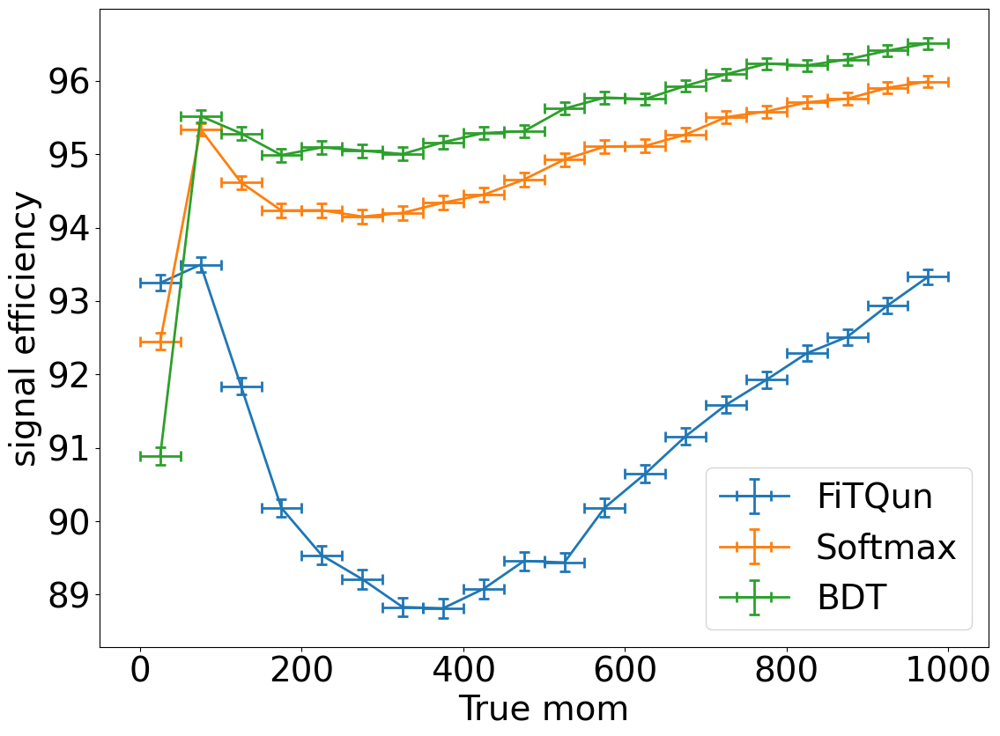

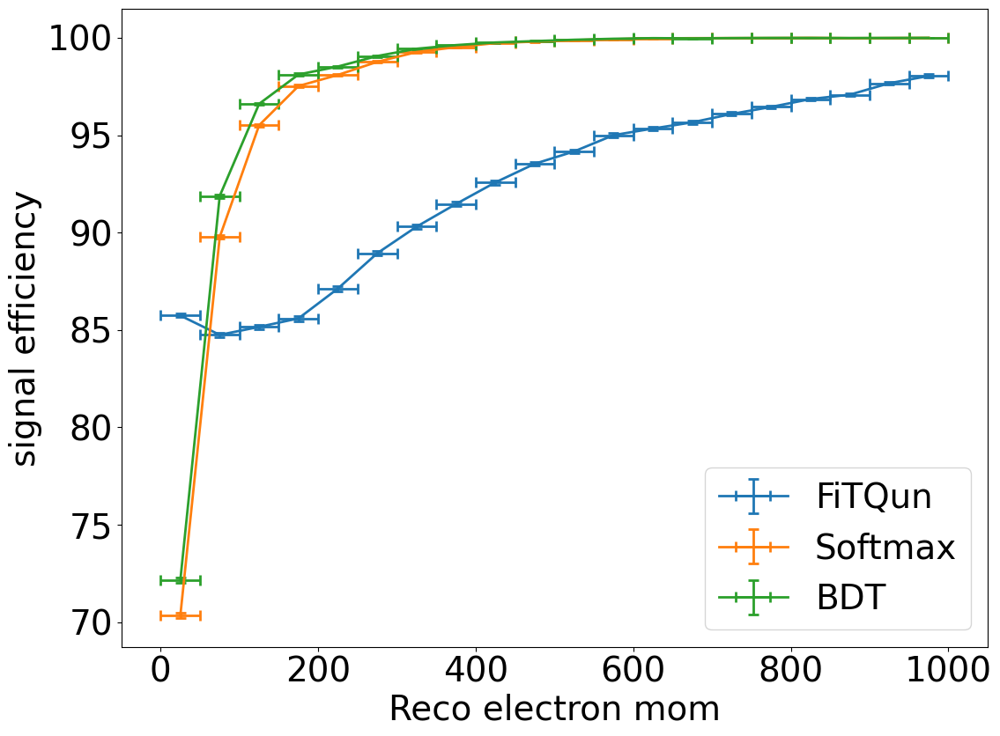

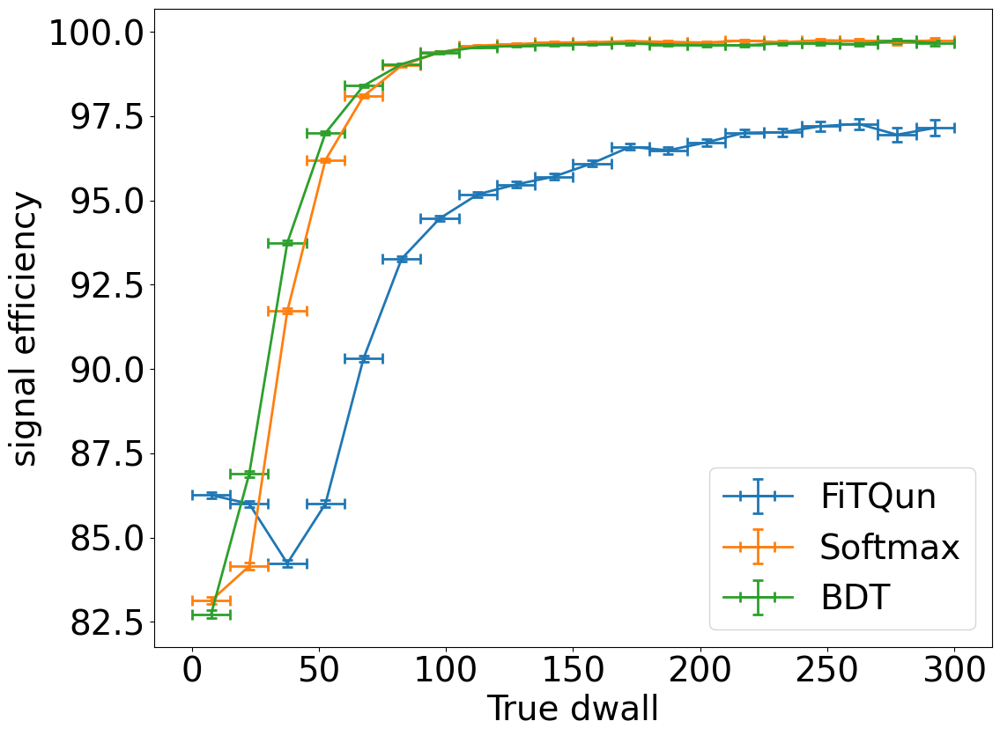

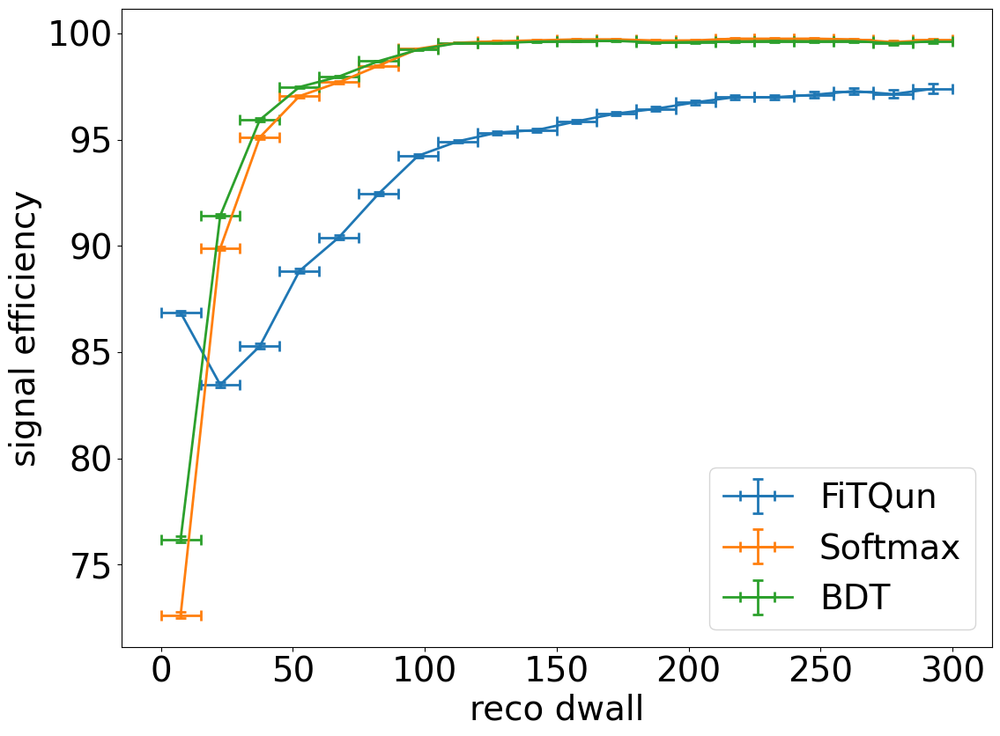

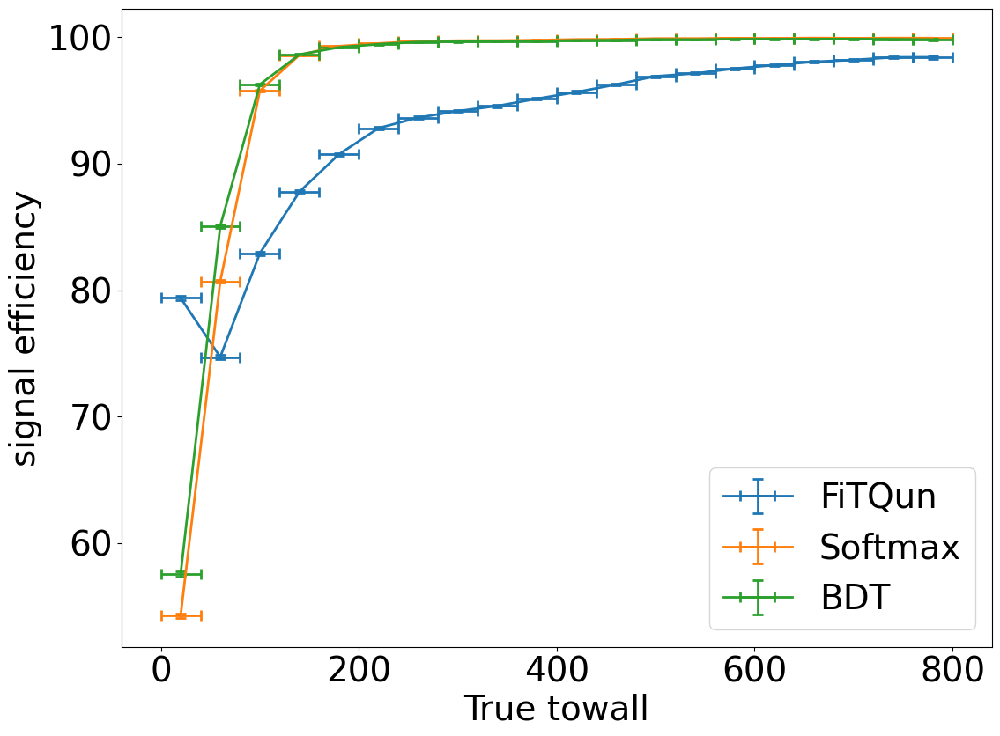

...

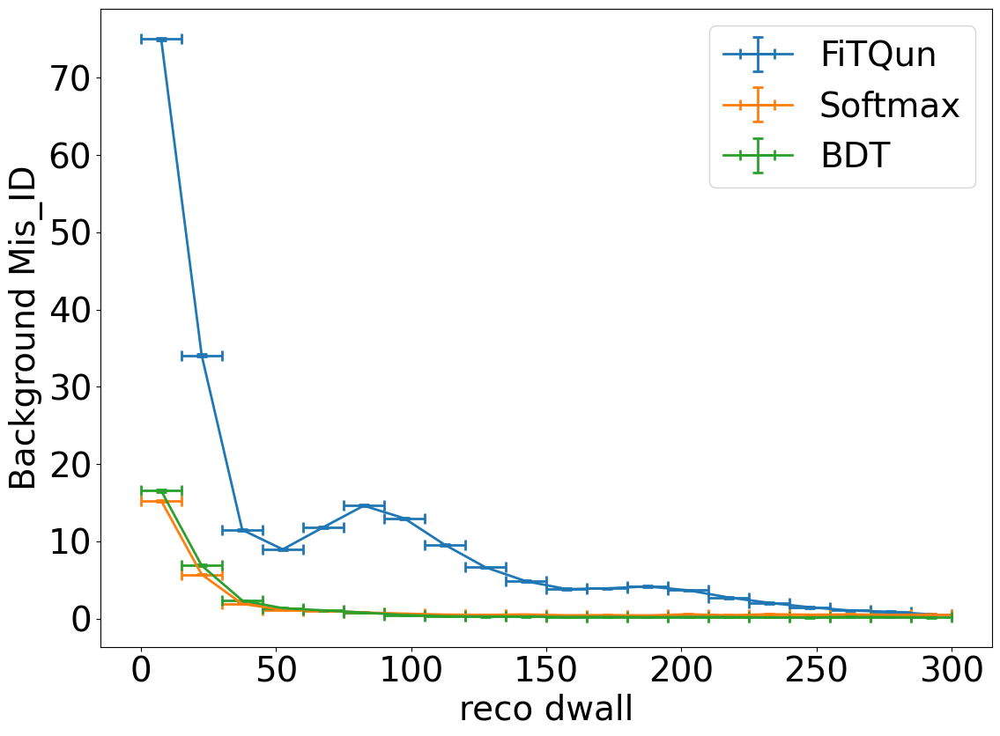

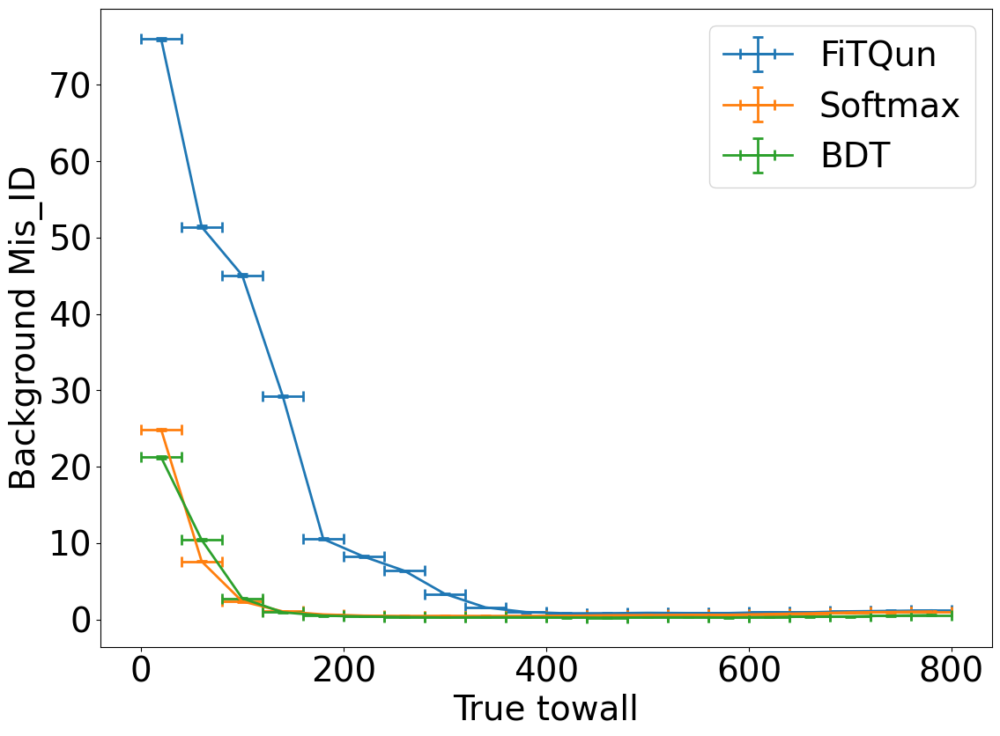

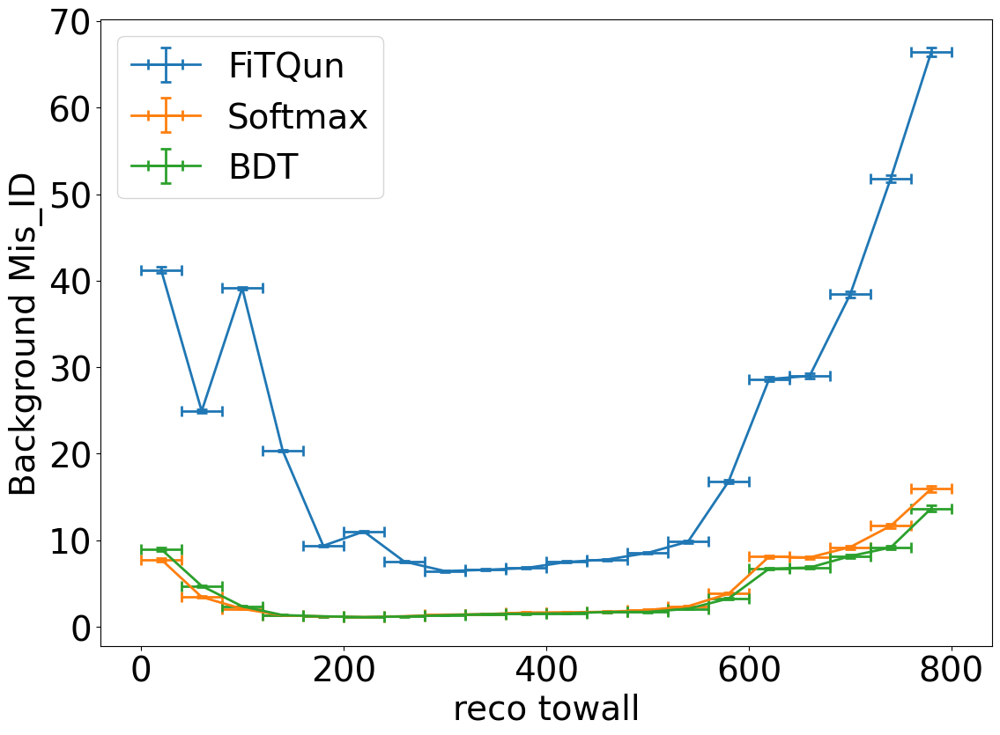

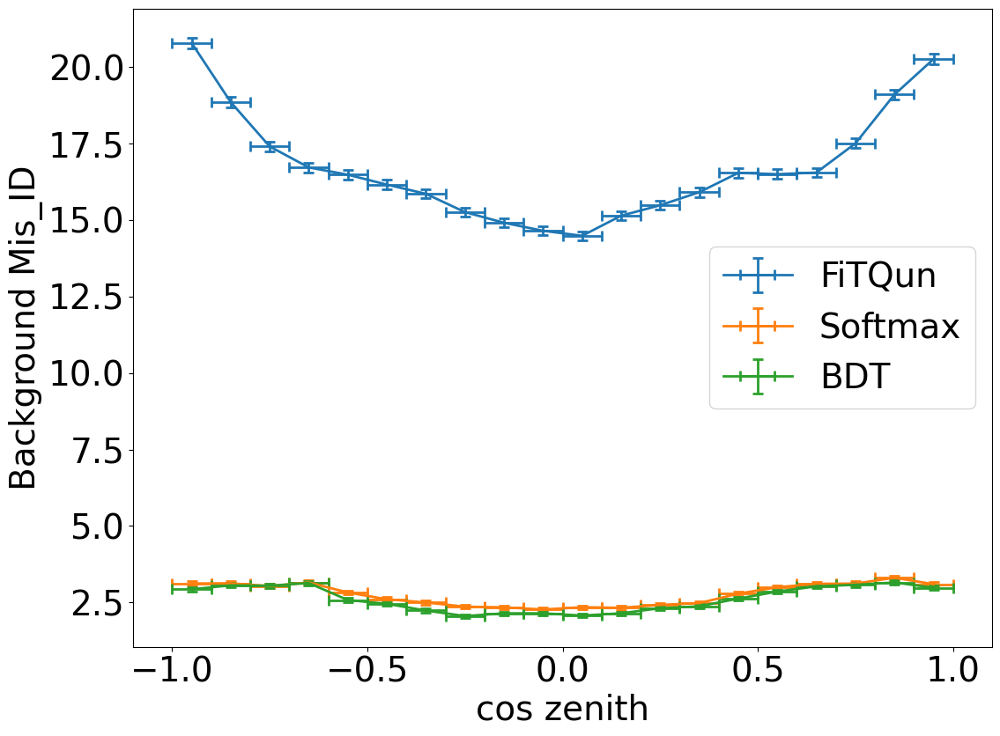

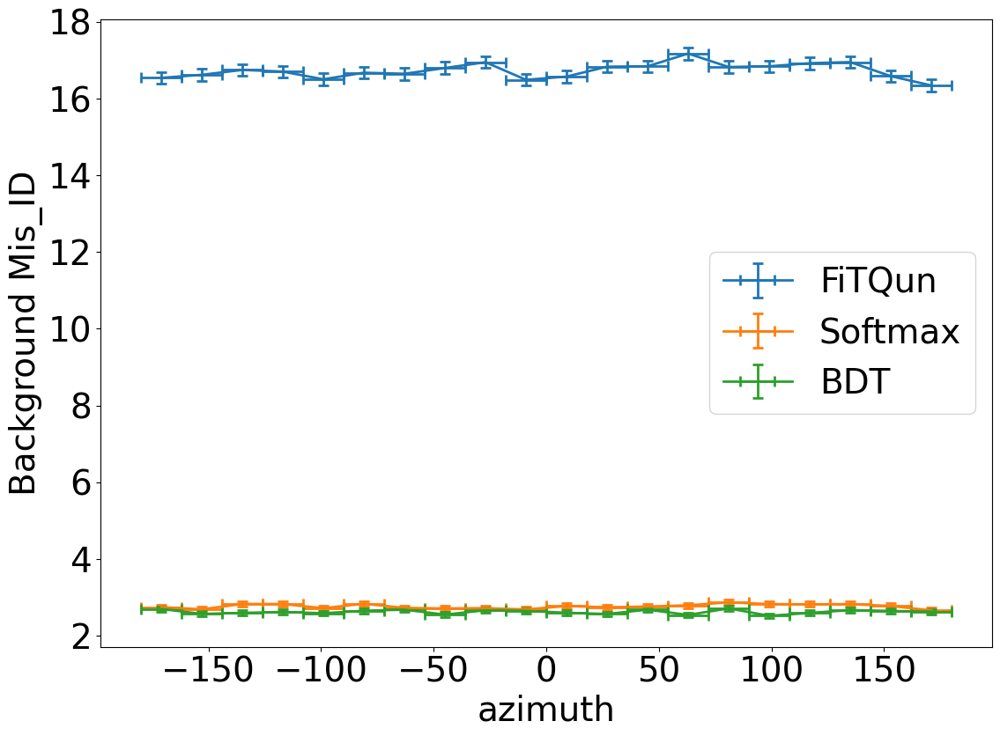

In [22]:
# Plotting efficiency profile using predefined cuts which have predefined fixed background rejection, before applying preselection

plot.efficiency_profile(df, 1, mom_binning, algorithms, cut_array=cuts, x_label='True mom', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_mom_e_binning, algorithms, cut_array=cuts, x_label='Reco electron mom', y_label='signal efficiency')
plot.efficiency_profile(df, 1, dwall_binning, algorithms, cut_array=cuts, x_label='True dwall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_dwall_binning, algorithms, cut_array=cuts, x_label='reco dwall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, towall_binning, algorithms, cut_array=cuts, x_label='True towall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_towall_binning, algorithms, cut_array=cuts, x_label='reco towall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, cos_zenith_binning, algorithms, cut_array=cuts, x_label='cos zenith', y_label='signal efficiency')
plot.efficiency_profile(df, 1, azimuth_binning, algorithms, cut_array=cuts, x_label='azimuth', y_label='signal efficiency')

plot.efficiency_profile(df, 2, mom_binning, algorithms, cut_array=cuts, x_label='True mom', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_mom_e_binning, algorithms, cut_array=cuts, x_label='Reco electron mom', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, dwall_binning, algorithms, cut_array=cuts, x_label='True dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_dwall_binning, algorithms, cut_array=cuts, x_label='reco dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, towall_binning, algorithms, cut_array=cuts, x_label='True towall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_towall_binning, algorithms, cut_array=cuts, x_label='reco towall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, cos_zenith_binning, algorithms, cut_array=cuts, x_label='cos zenith', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, azimuth_binning, algorithms, cut_array=cuts, x_label='azimuth', y_label='Background Mis_ID')


(<Figure size 1200x900 with 1 Axes>,
 <AxesSubplot: xlabel='azimuth', ylabel='Background Mis_ID'>)

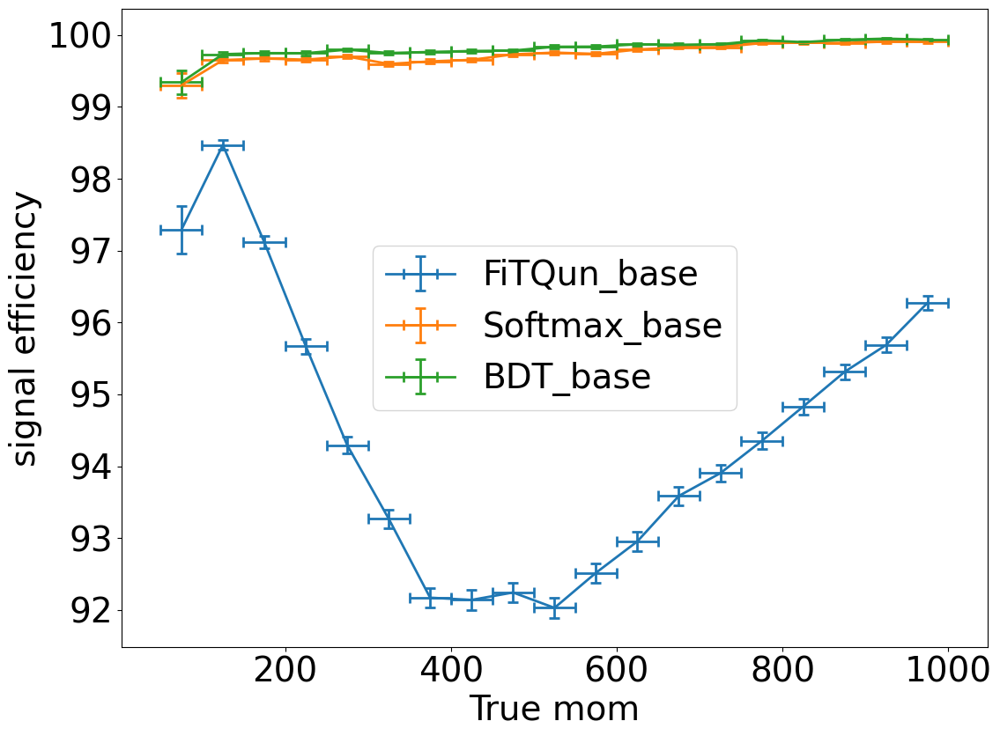

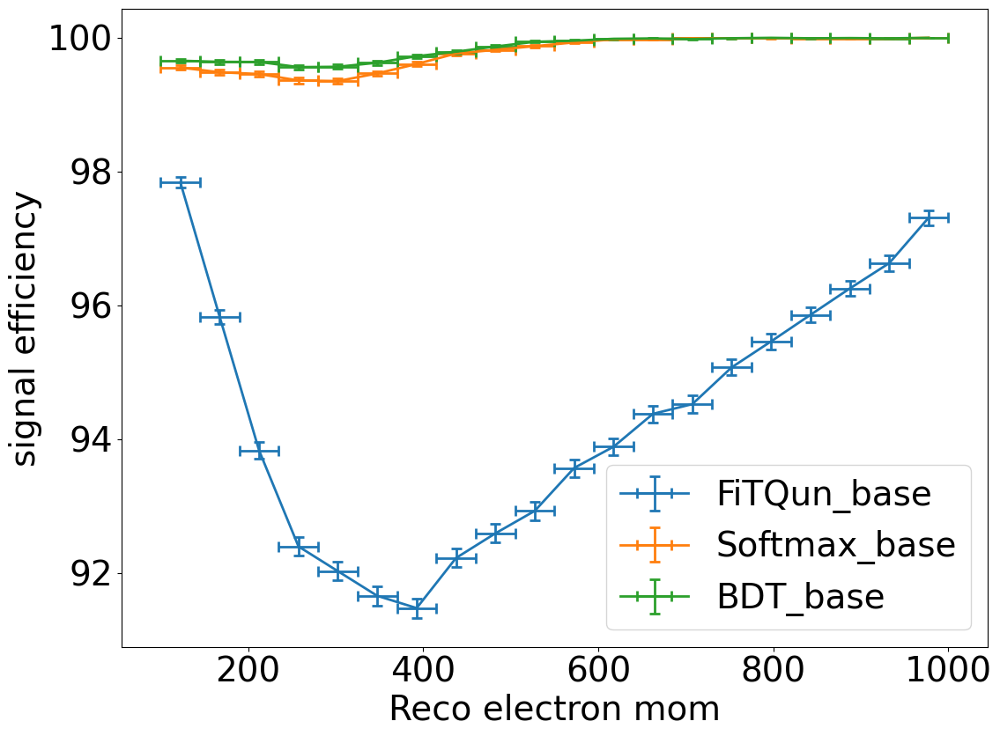

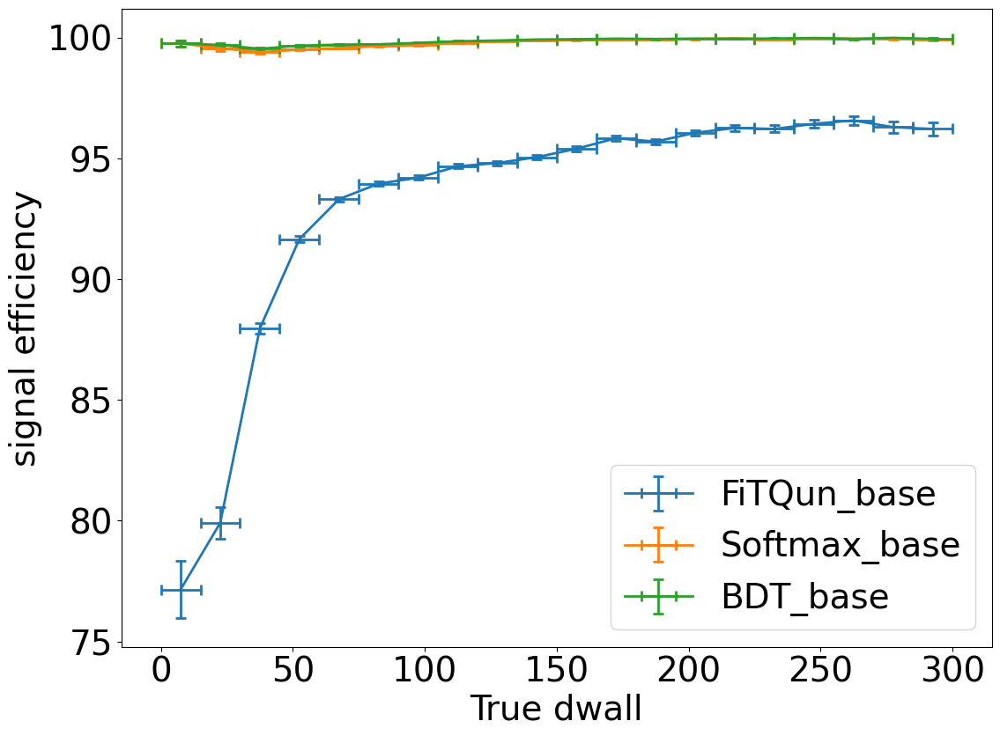

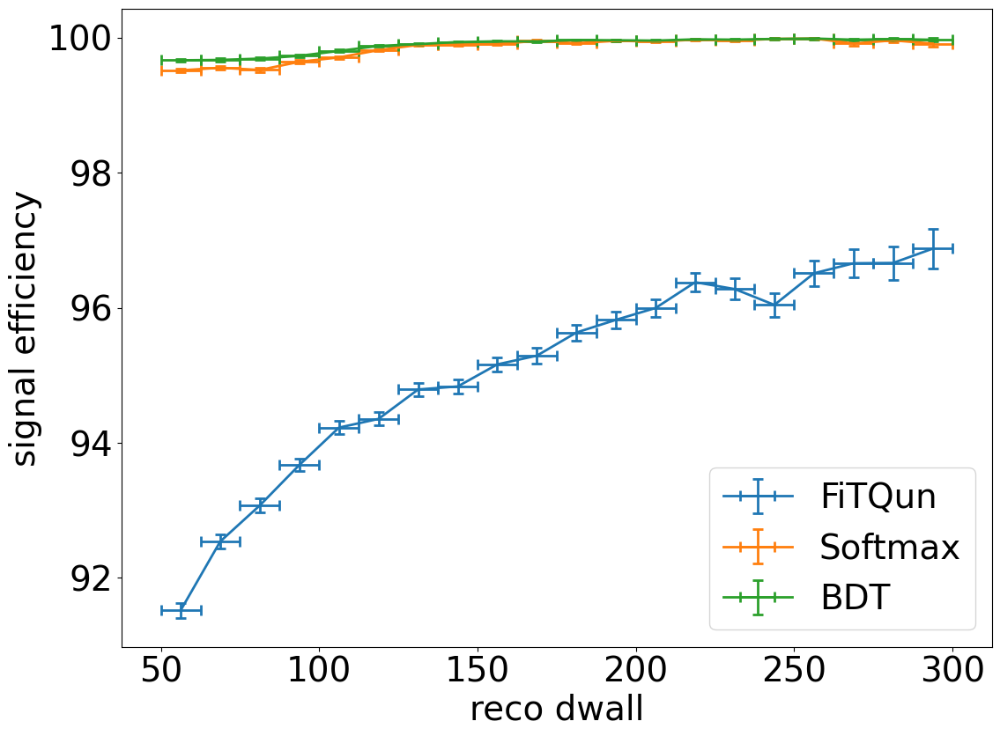

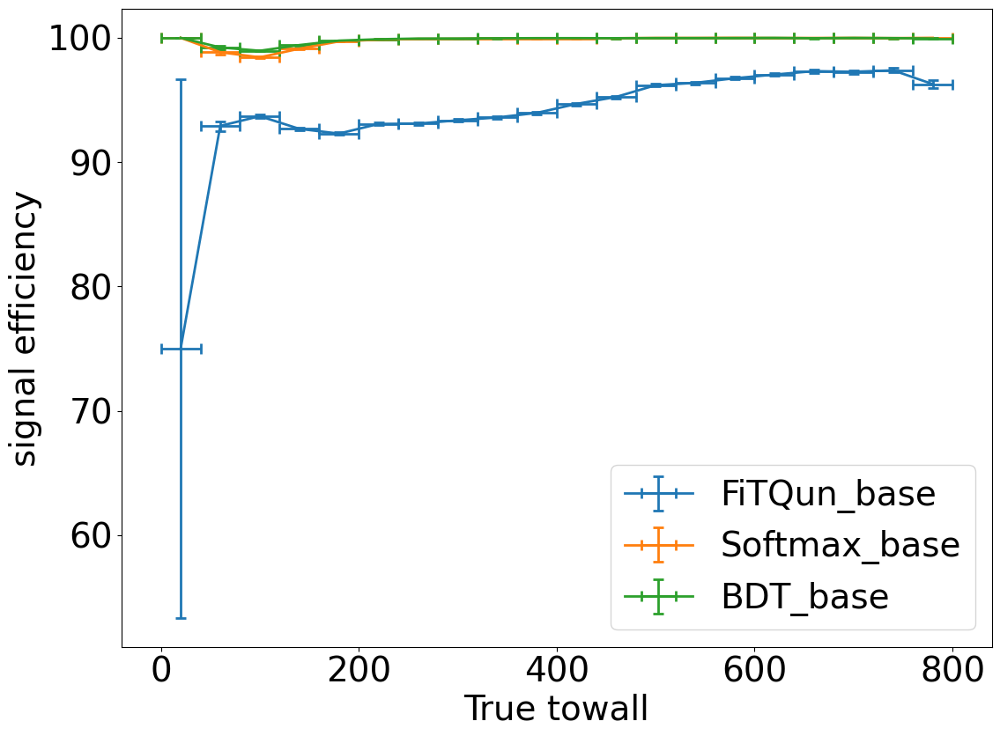

...

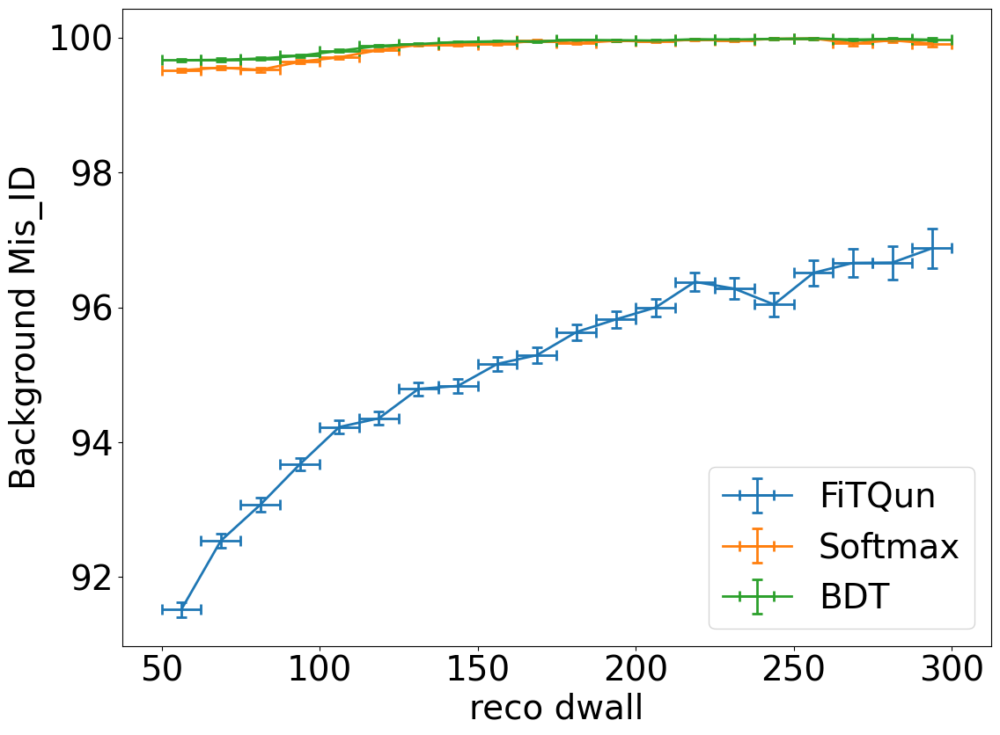

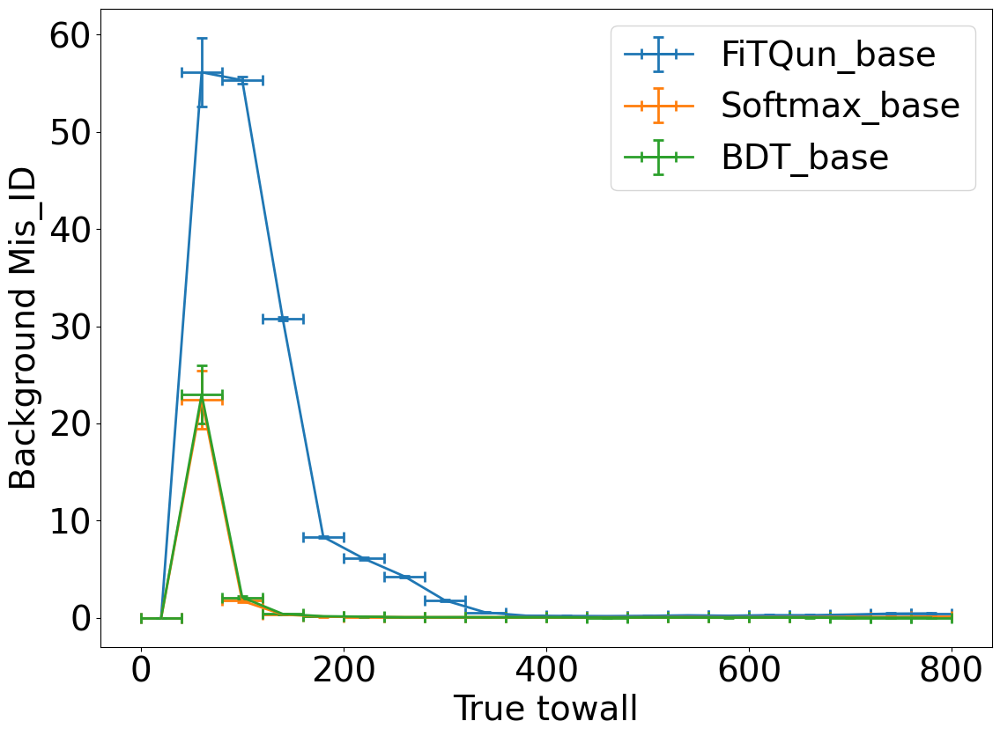

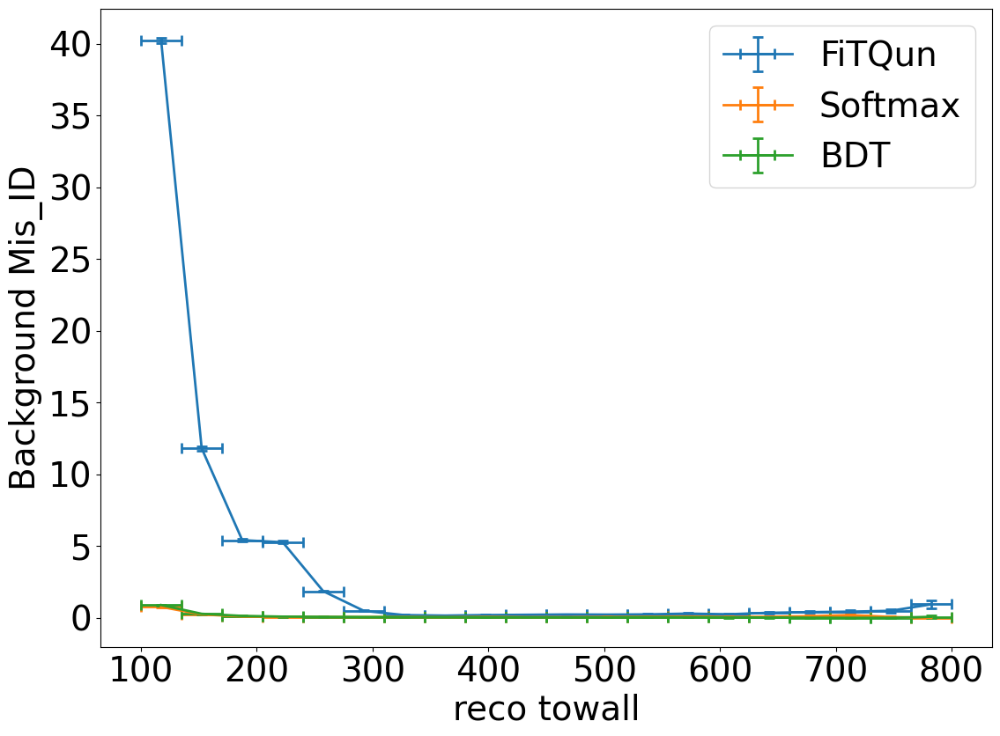

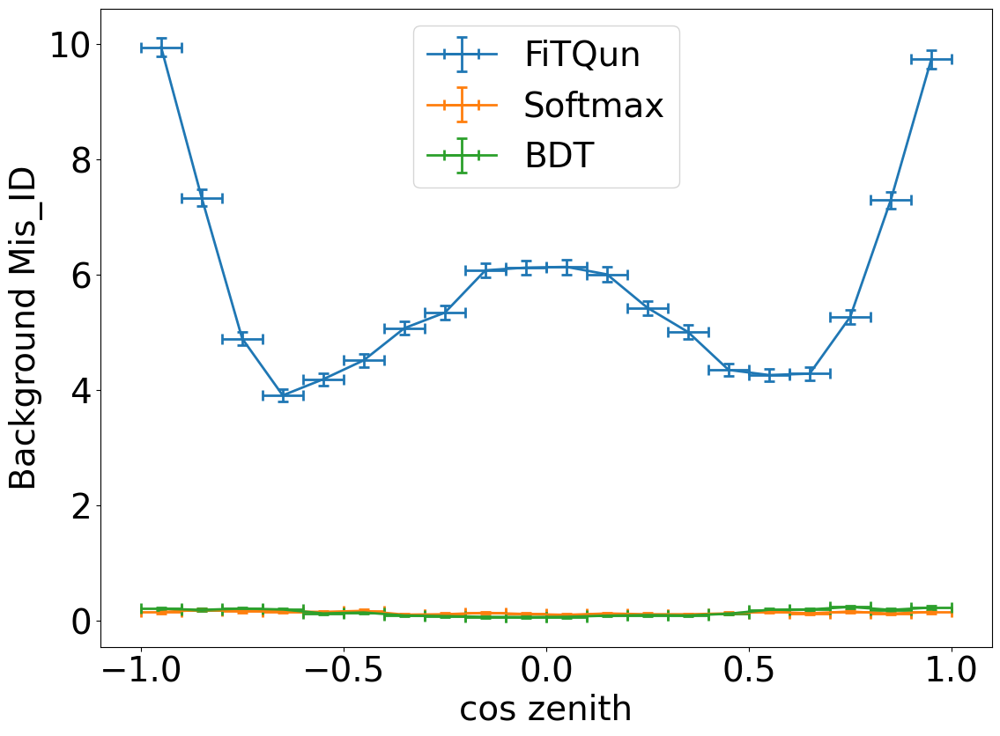

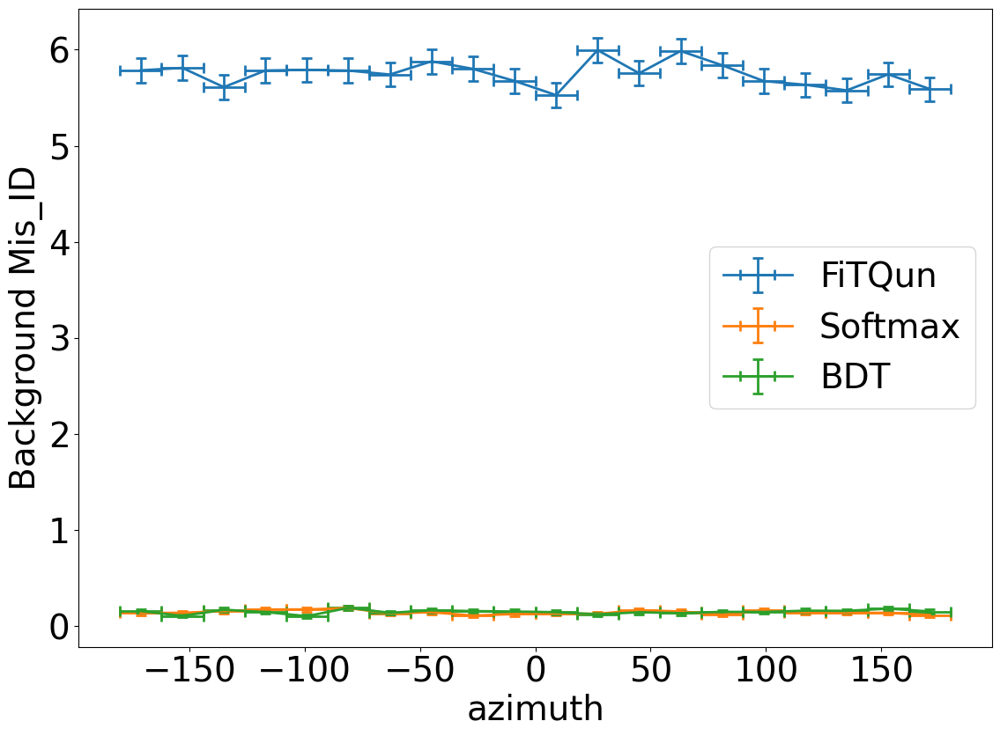

In [23]:
# Plotting efficiency profile using predefined cuts which have predefined fixed background rejection, after applying preselection

plot.efficiency_profile(df_base, 1, mom_binning_base, algorithms_base, cut_array=cuts_base, x_label='True mom', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_mom_e_binning_base, algorithms_base, cut_array=cuts_base, x_label='Reco electron mom', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, dwall_binning_base, algorithms_base, cut_array=cuts_base, x_label='True dwall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_dwall_binning_base, algorithms, cut_array=cuts_base, x_label='reco dwall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, towall_binning_base, algorithms_base, cut_array=cuts_base, x_label='True towall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_towall_binning_base, algorithms, cut_array=cuts_base, x_label='reco towall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, cos_zenith_binning_base, algorithms, cut_array=cuts_base, x_label='cos zenith', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, azimuth_binning_base, algorithms, cut_array=cuts_base, x_label='azimuth', y_label='signal efficiency')

plot.efficiency_profile(df_base, 2, mom_binning_base, algorithms_base, cut_array=cuts_base, x_label='True mom', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_mom_e_binning_base, algorithms_base, cut_array=cuts_base, x_label='Reco electron mom', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, dwall_binning_base, algorithms_base, cut_array=cuts_base, x_label='True dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 1, reco_dwall_binning_base, algorithms, cut_array=cuts_base, x_label='reco dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, towall_binning_base, algorithms_base, cut_array=cuts_base, x_label='True towall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_towall_binning_base, algorithms, cut_array=cuts_base, x_label='reco towall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, cos_zenith_binning_base, algorithms, cut_array=cuts_base, x_label='cos zenith', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, azimuth_binning_base, algorithms, cut_array=cuts_base, x_label='azimuth', y_label='Background Mis_ID')

In [24]:
# Using fixed background rejection and plotting the efficiency profile over different varibales:

muon_rejection = 0.99
fixed_rejection_cuts, fixed_rejection_thresholds = classification_metrics.cut_with_fixed_rejection(df, probs, 2, muon_rejection)
fixed_rejection_cuts_base, fixed_rejection_thresholds_base = classification_metrics.cut_with_fixed_rejection(df_base, probs_base, 2, muon_rejection)

(<Figure size 1200x900 with 1 Axes>,
 <AxesSubplot: xlabel='azimuth', ylabel='Background Mis_ID'>)

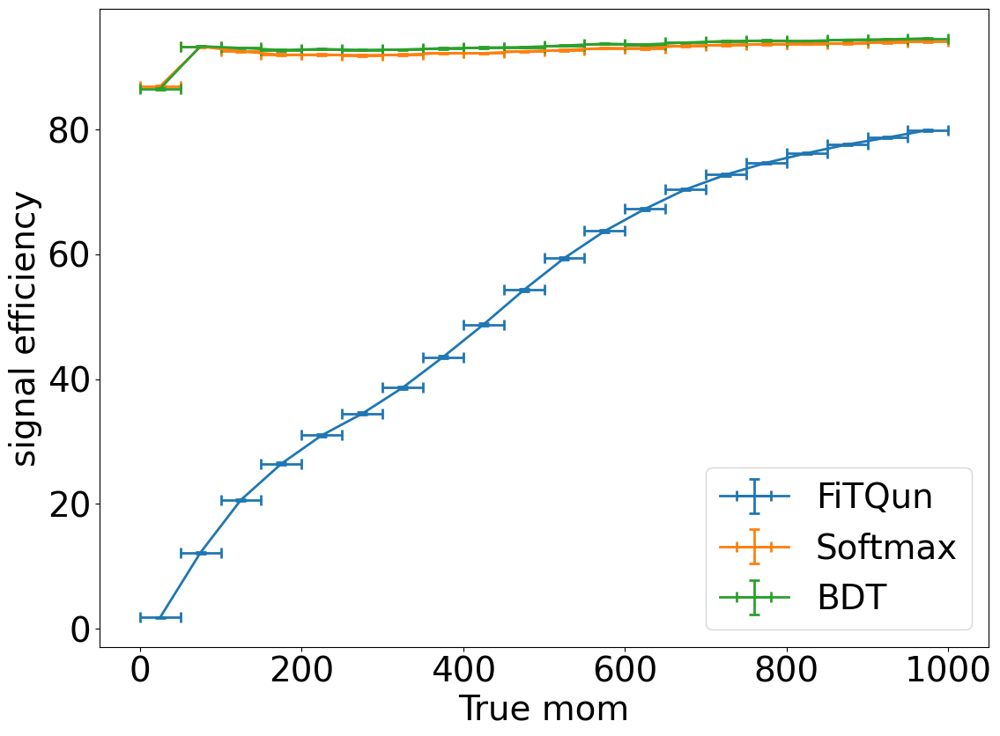

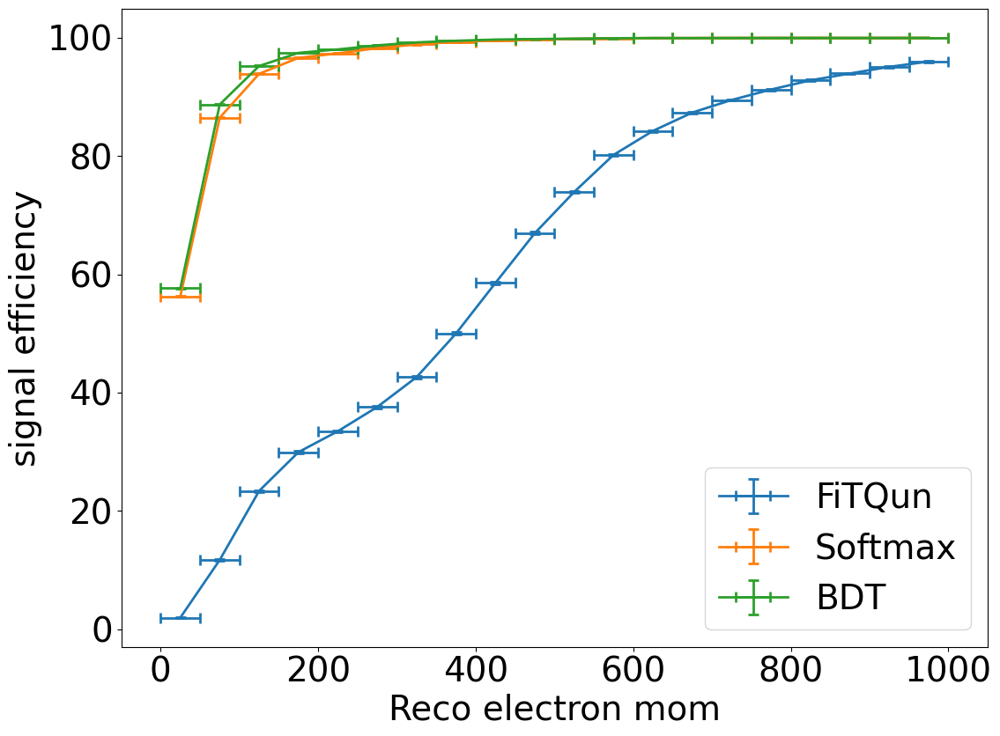

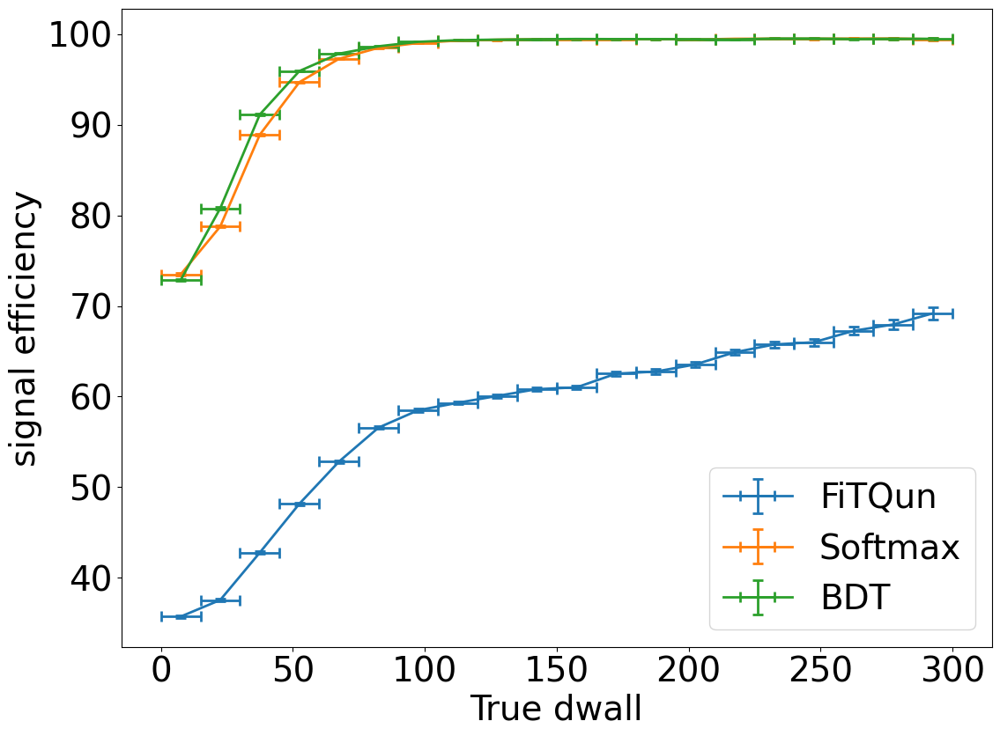

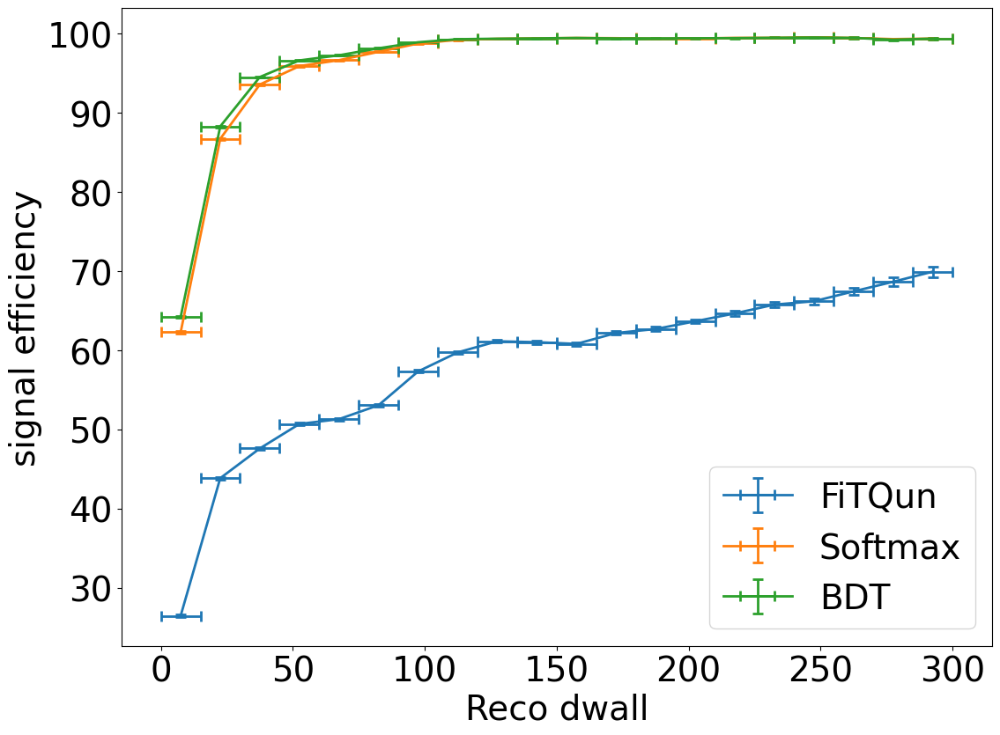

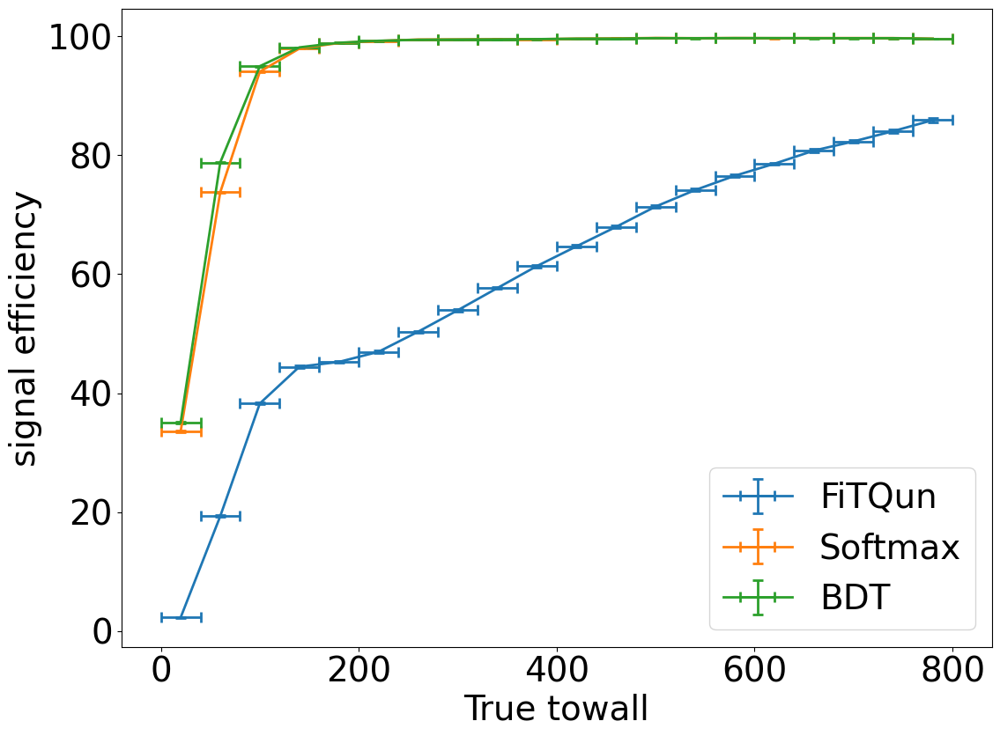

...

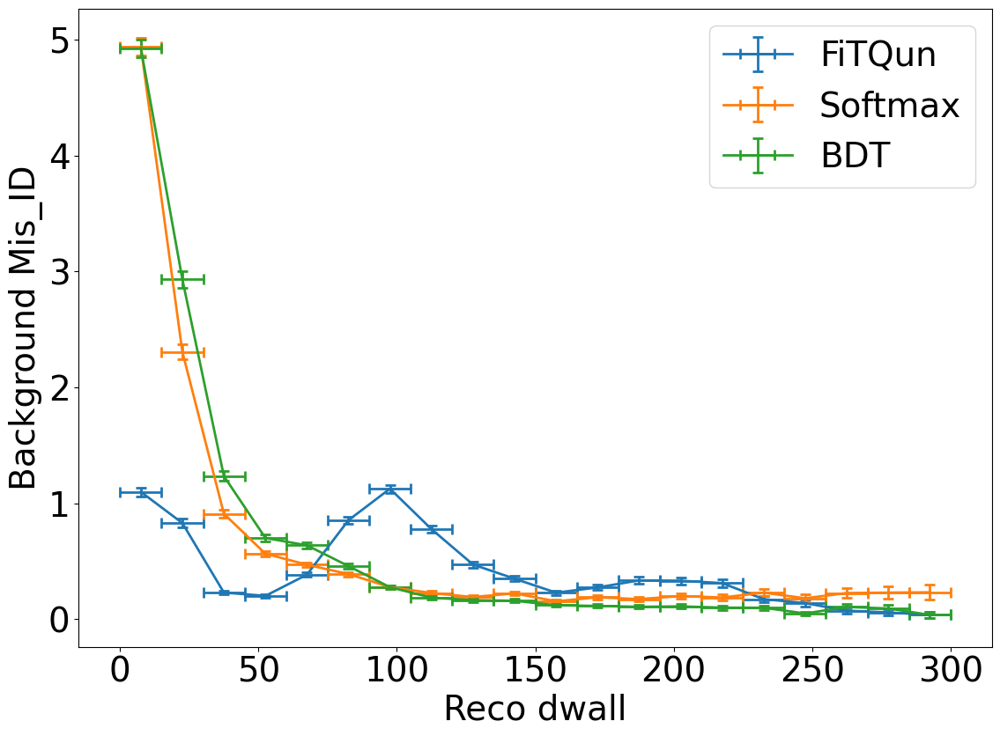

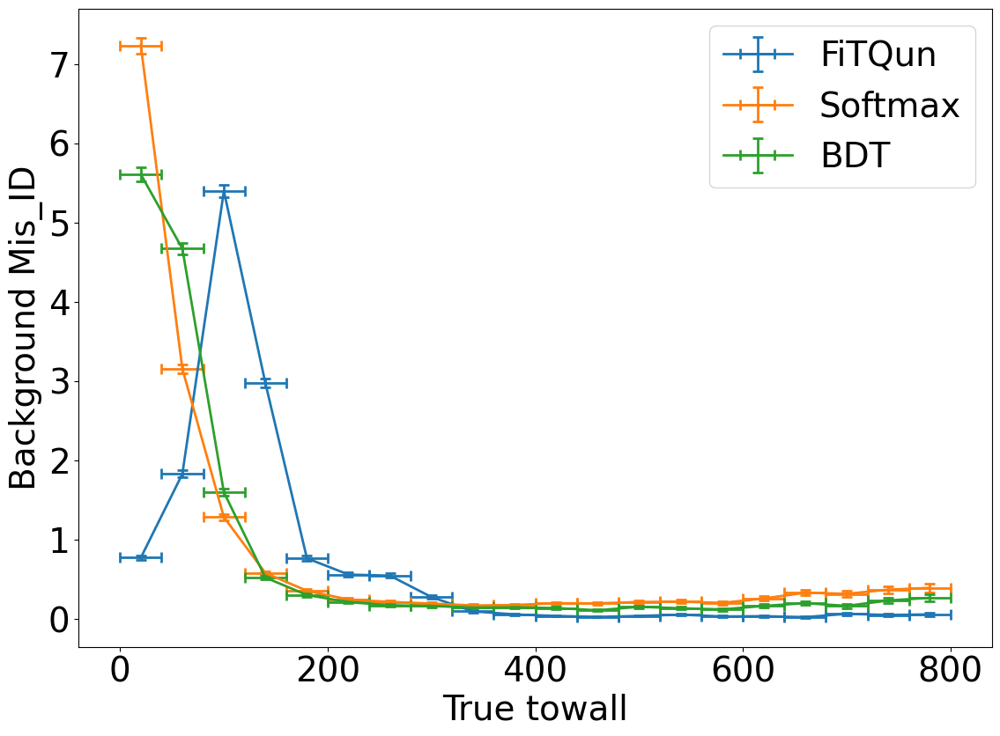

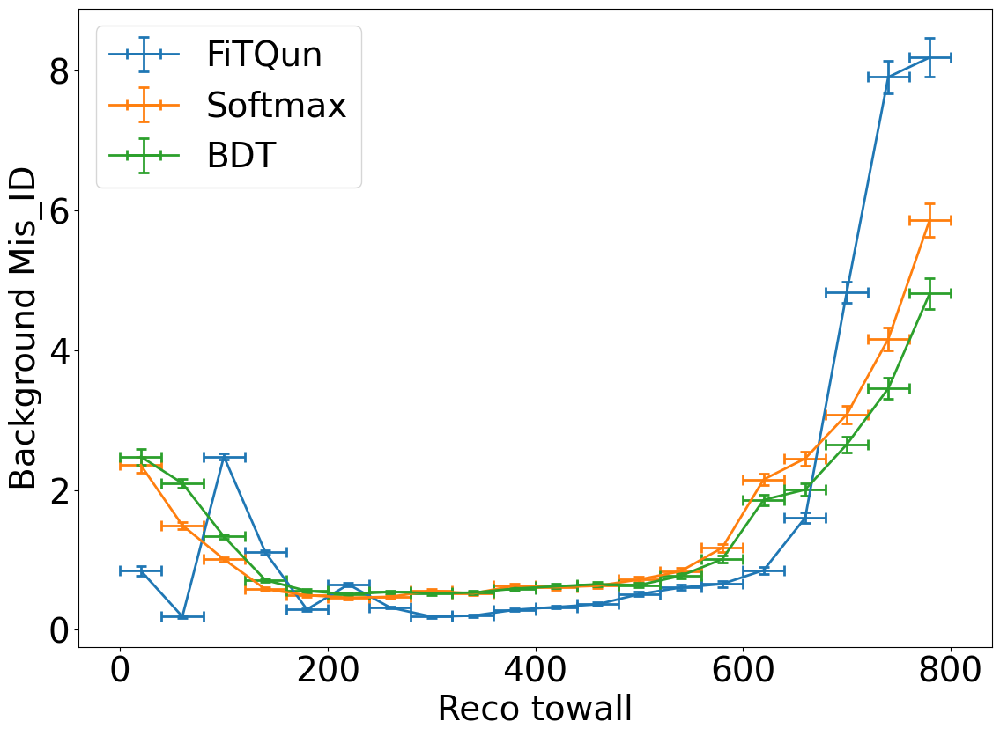

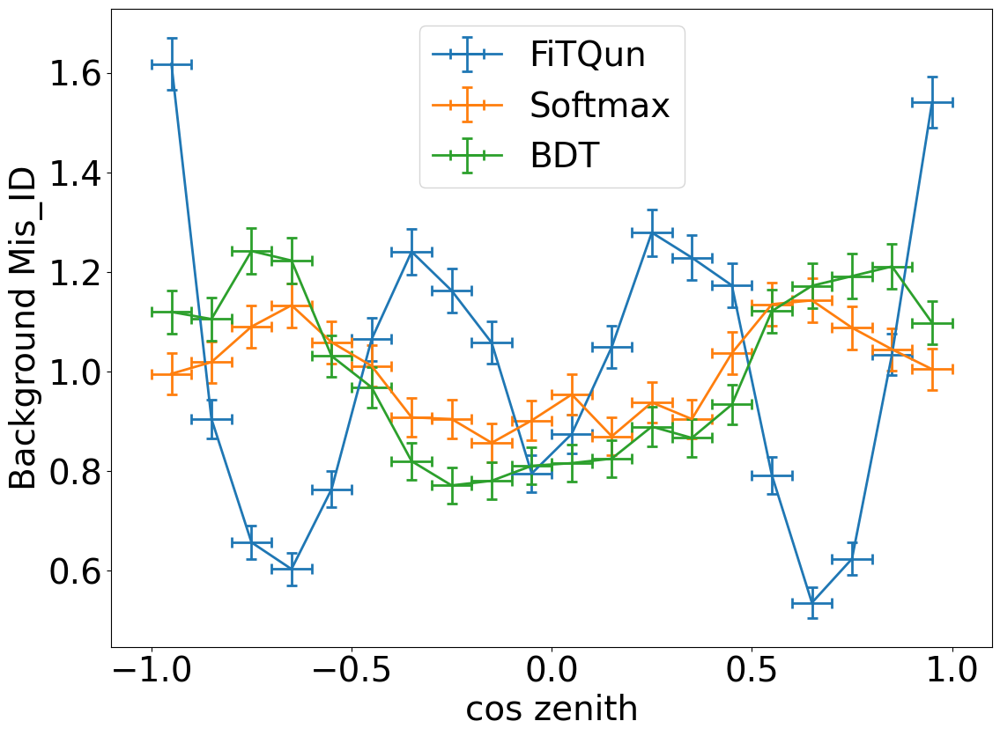

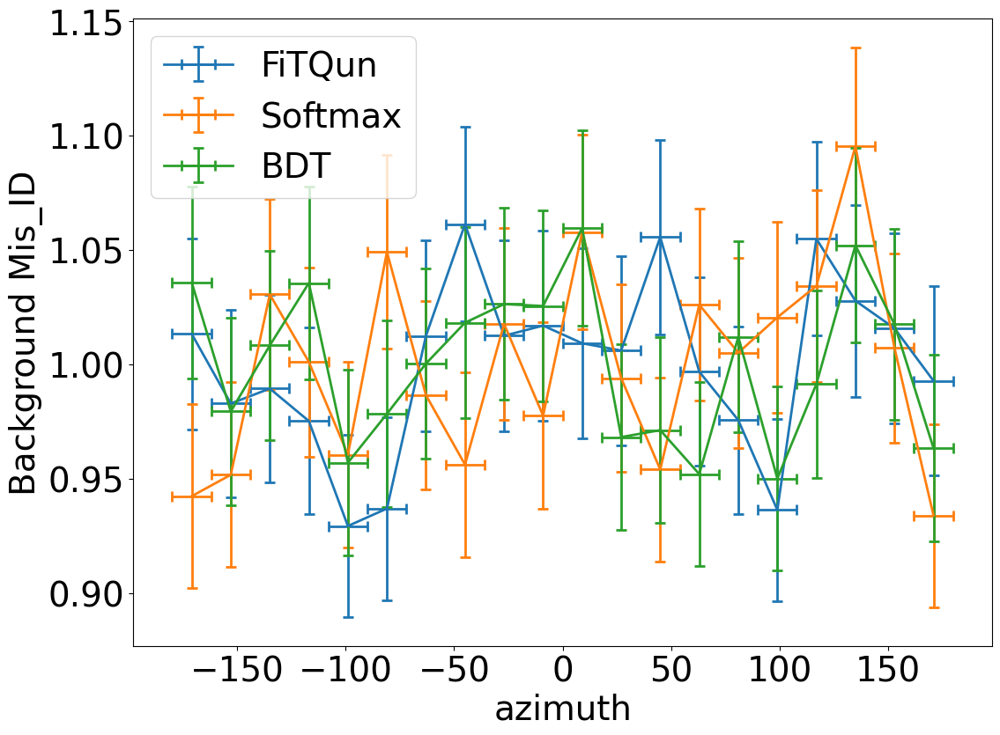

In [25]:
# Plotting efficiency profile using muon_rejection of 0.99, before applying preselection

plot.efficiency_profile(df, 1, mom_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='True mom', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_mom_e_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='Reco electron mom', y_label='signal efficiency')
plot.efficiency_profile(df, 1, dwall_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='True dwall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_dwall_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='Reco dwall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, towall_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='True towall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_towall_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='Reco towall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, cos_zenith_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='cos zenith', y_label='signal efficiency')
plot.efficiency_profile(df, 1, azimuth_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='azimuth', y_label='signal efficiency')

plot.efficiency_profile(df, 2, mom_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='True mom', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_mom_e_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='Reco electron mom', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, dwall_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='True dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_dwall_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='Reco dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, towall_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='True towall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_towall_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='Reco towall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, cos_zenith_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='cos zenith', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, azimuth_binning, algorithms, cut_array=fixed_rejection_cuts, x_label='azimuth', y_label='Background Mis_ID')

(<Figure size 1200x900 with 1 Axes>,
 <AxesSubplot: xlabel='azimuth', ylabel='Background Mis_ID'>)

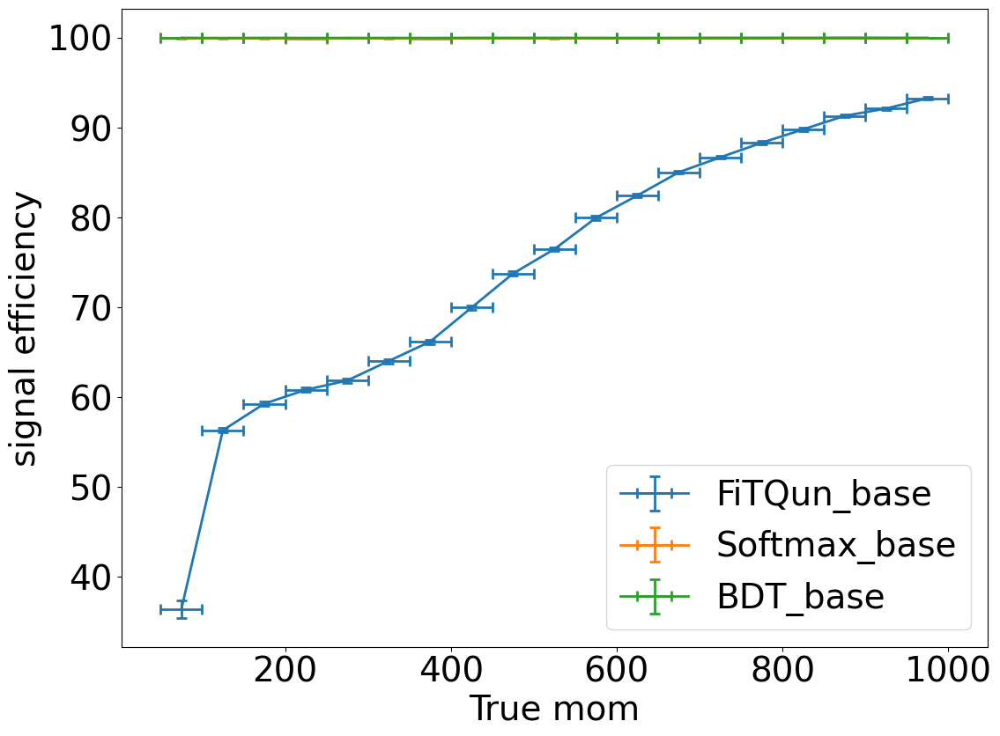

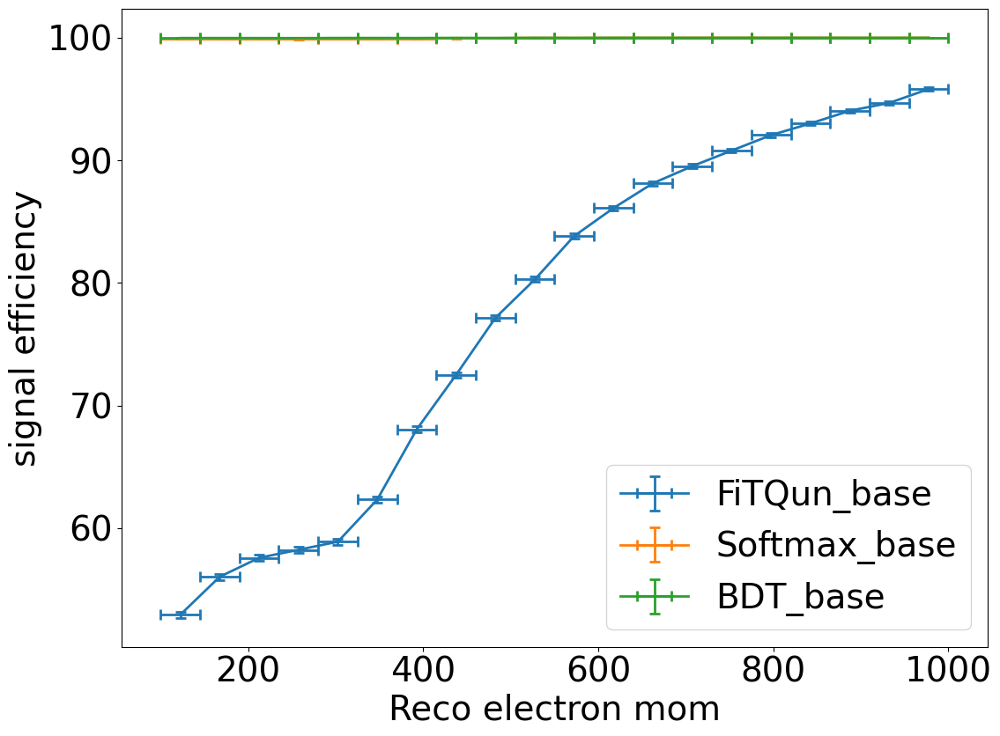

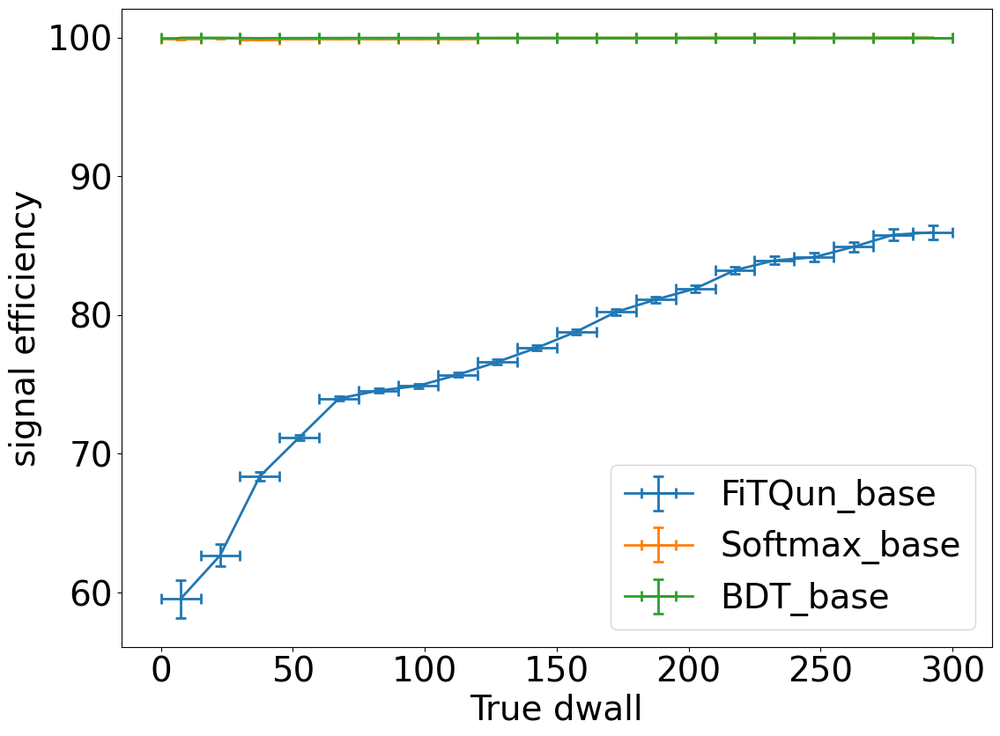

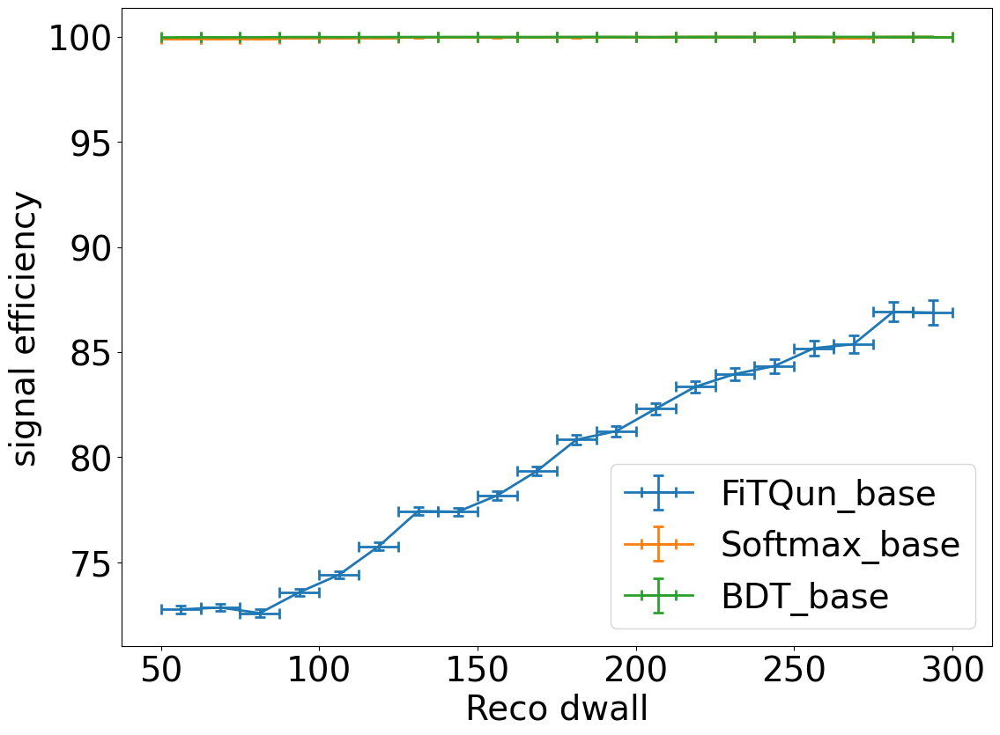

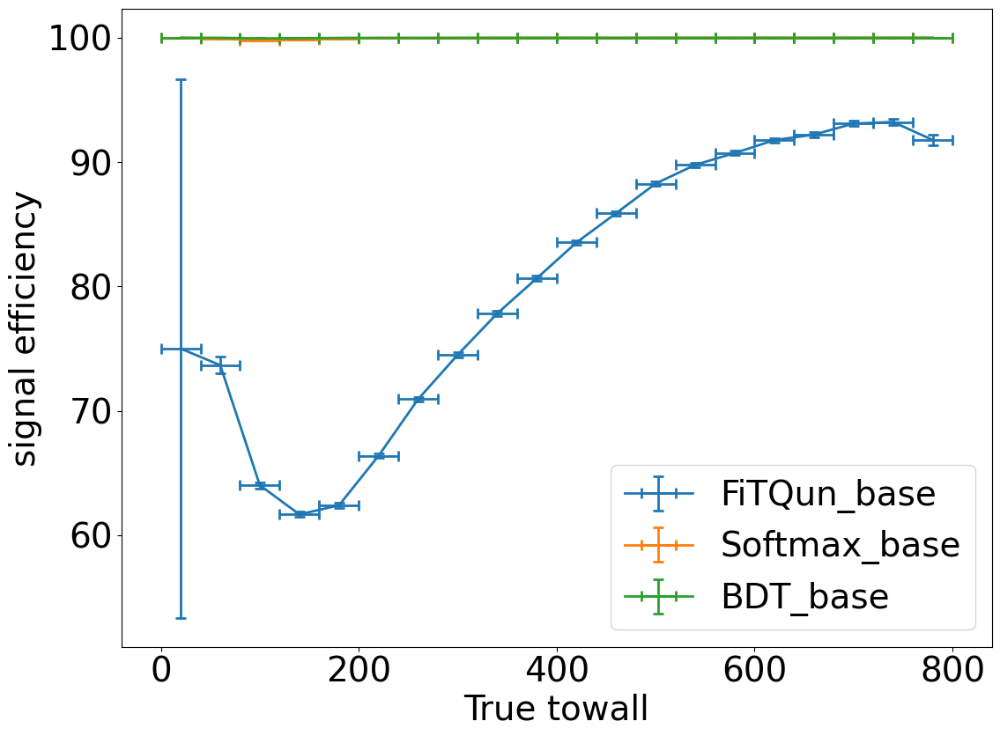

...

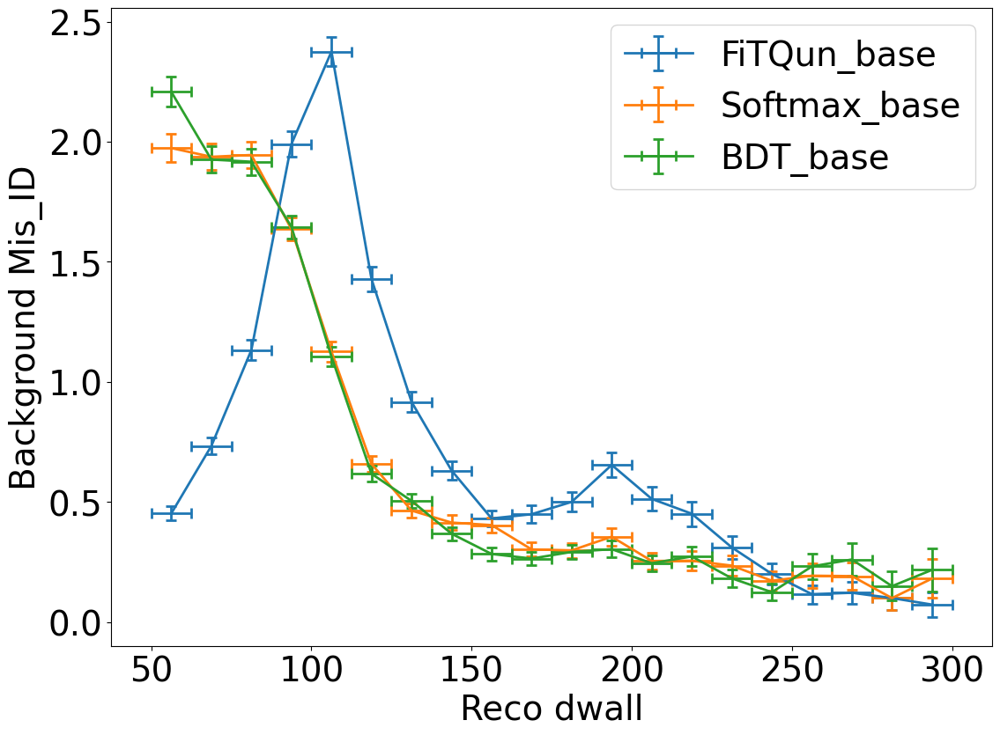

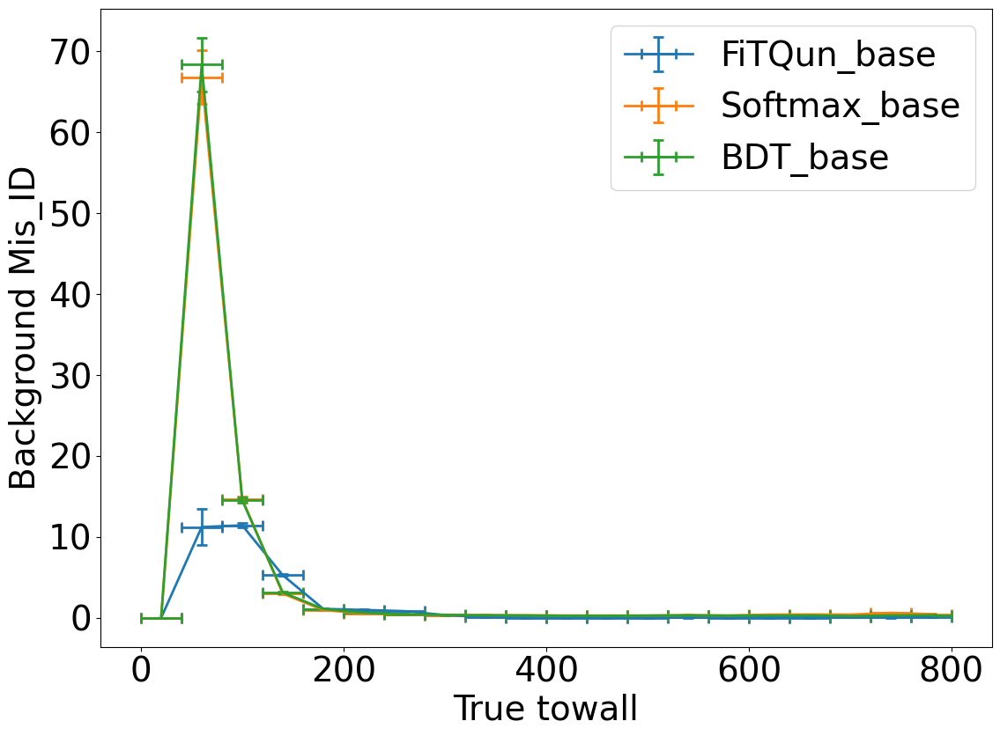

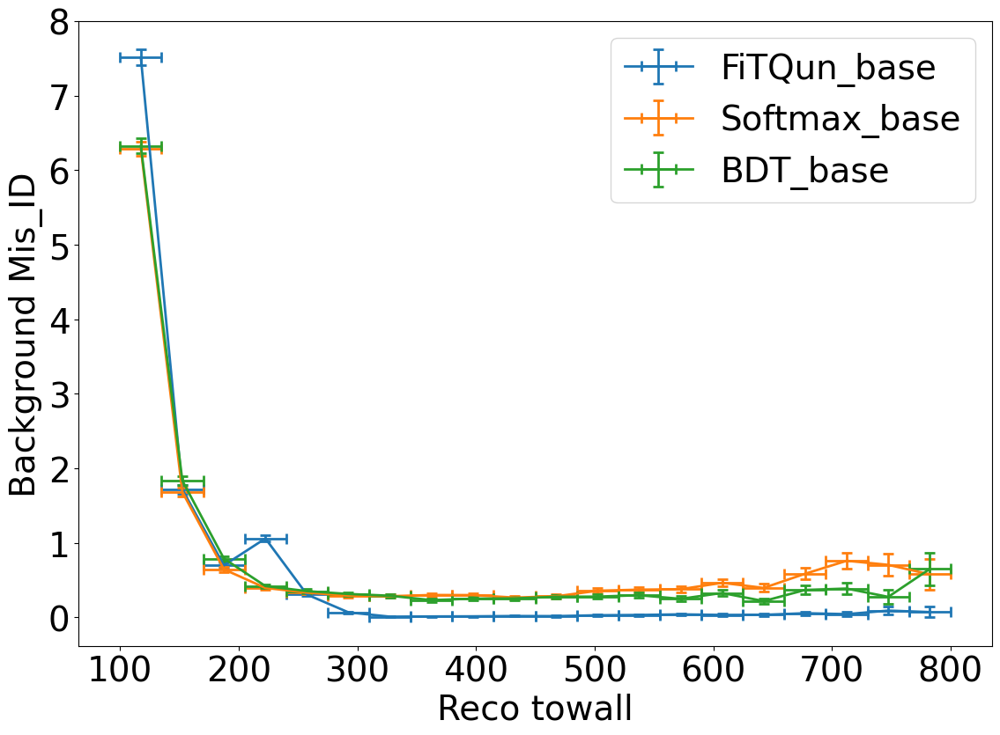

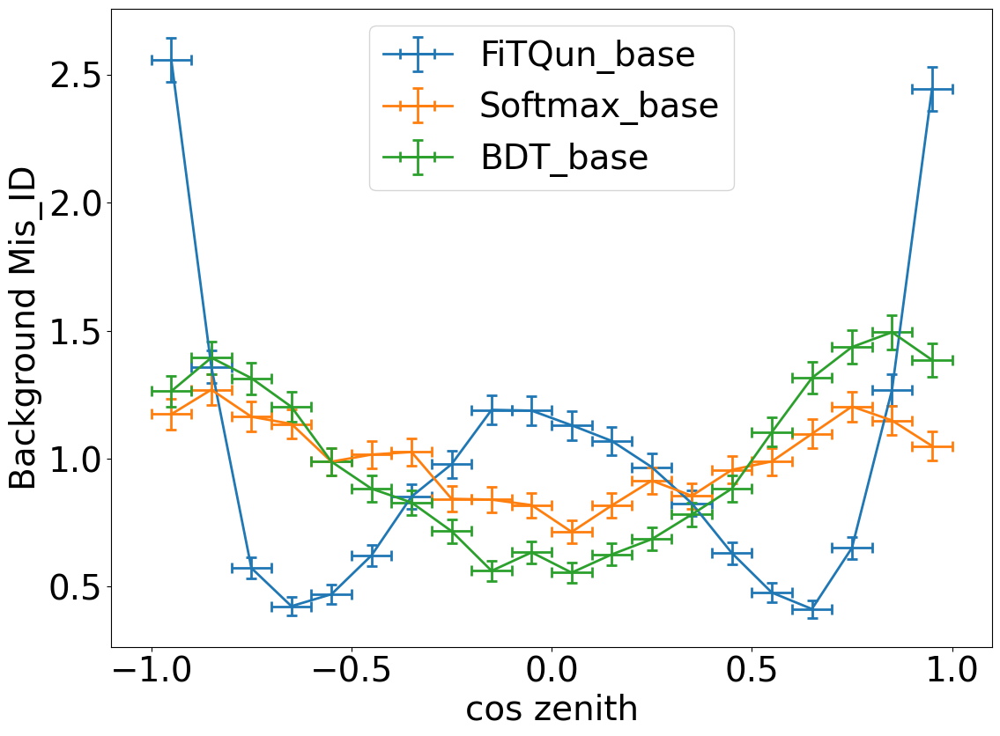

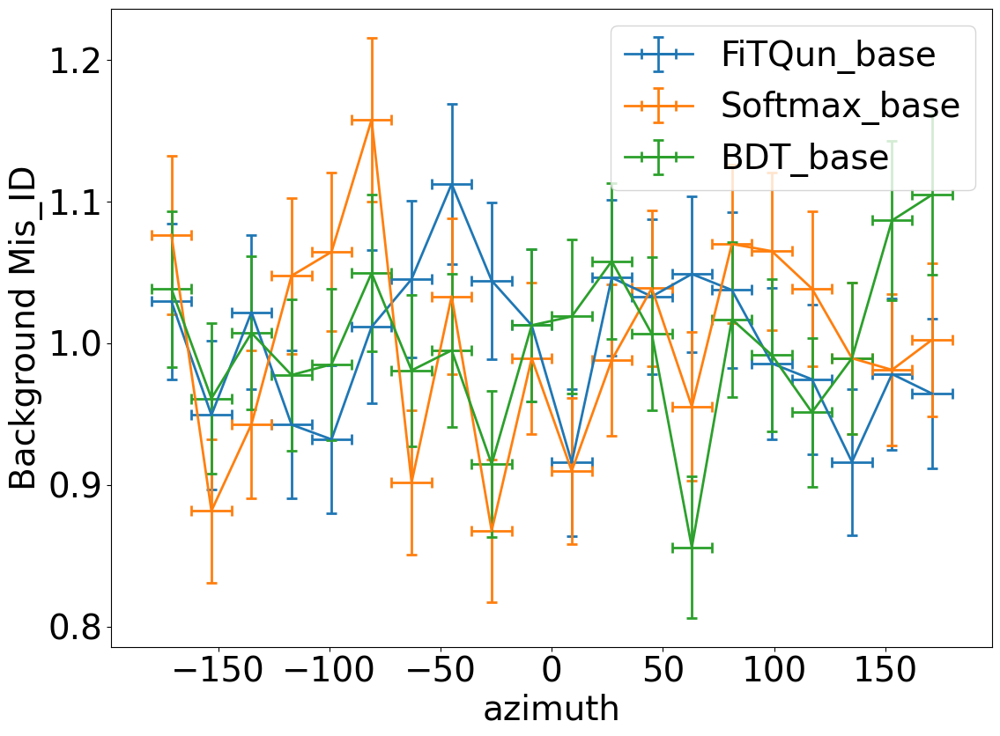

In [26]:
# Plotting efficiency profile using muon_rejection of 0.99, after applying preselection
plot.efficiency_profile(df_base, 1, mom_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='True mom', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_mom_e_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='Reco electron mom', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, dwall_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='True dwall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_dwall_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='Reco dwall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, towall_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='True towall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_towall_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='Reco towall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, cos_zenith_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='cos zenith', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, azimuth_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='azimuth', y_label='signal efficiency')

plot.efficiency_profile(df_base, 2, mom_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='True mom', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_mom_e_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='Reco electron mom', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, dwall_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='True dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_dwall_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='Reco dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, towall_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='True towall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_towall_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='Reco towall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, cos_zenith_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='cos zenith', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, azimuth_binning_base, algorithms_base, cut_array=fixed_rejection_cuts_base, x_label='azimuth', y_label='Background Mis_ID')

In [27]:
# Getting the signal efficiency and background rejection for all different fixed rejection cuts before and after applying preselection

sig_eff = classification_metrics.sg_eff(df['true_sig'], fixed_rejection_cuts)
bg_rej = classification_metrics.bg_rej(df['true_sig'], fixed_rejection_cuts)

for i in range(len(sig_eff)):
    print(f'The signal efficiency  and background rejection for {algorithms[i]} cuts is : {round(sig_eff[i], 3)}, {round(bg_rej[i], 3)}')
    
print('\n')

sig_eff_base = classification_metrics.sg_eff(df_base['true_sig'], fixed_rejection_cuts_base)
bg_rej_base = classification_metrics.bg_rej(df_base['true_sig'], fixed_rejection_cuts_base)

for i in range(len(sig_eff_base)):
    print(f'The signal efficiency  and background rejection for {algorithms_base[i]} cuts is : {round(sig_eff_base[i], 3)}, {round(bg_rej_base[i], 3)}')

The signal efficiency  and background rejection for FiTQun cuts is : 0.519, 0.99
The signal efficiency  and background rejection for Softmax cuts is : 0.926, 0.99
The signal efficiency  and background rejection for BDT cuts is : 0.932, 0.99


The signal efficiency  and background rejection for FiTQun_base cuts is : 0.766, 0.99
The signal efficiency  and background rejection for Softmax_base cuts is : 1.0, 0.99
The signal efficiency  and background rejection for BDT_base cuts is : 1.0, 0.99


In [28]:
# Using binned background rejection over reco mom and plotting the efficiency profile over different varibales:

muon_rejection = 0.99
binned_rejection_cuts, binned_rejection_thresholds = classification_metrics.cut_with_constant_binned_rejection(df, probs, 2, muon_rejection, reco_mom_e_binning)
binned_rejection_cuts_base, binned_rejection_thresholds_base = classification_metrics.cut_with_constant_binned_rejection(df_base, probs_base, 2, muon_rejection, reco_mom_e_binning_base)

(<Figure size 1200x900 with 1 Axes>,
 <AxesSubplot: xlabel='azimuth', ylabel='Background Mis_ID'>)

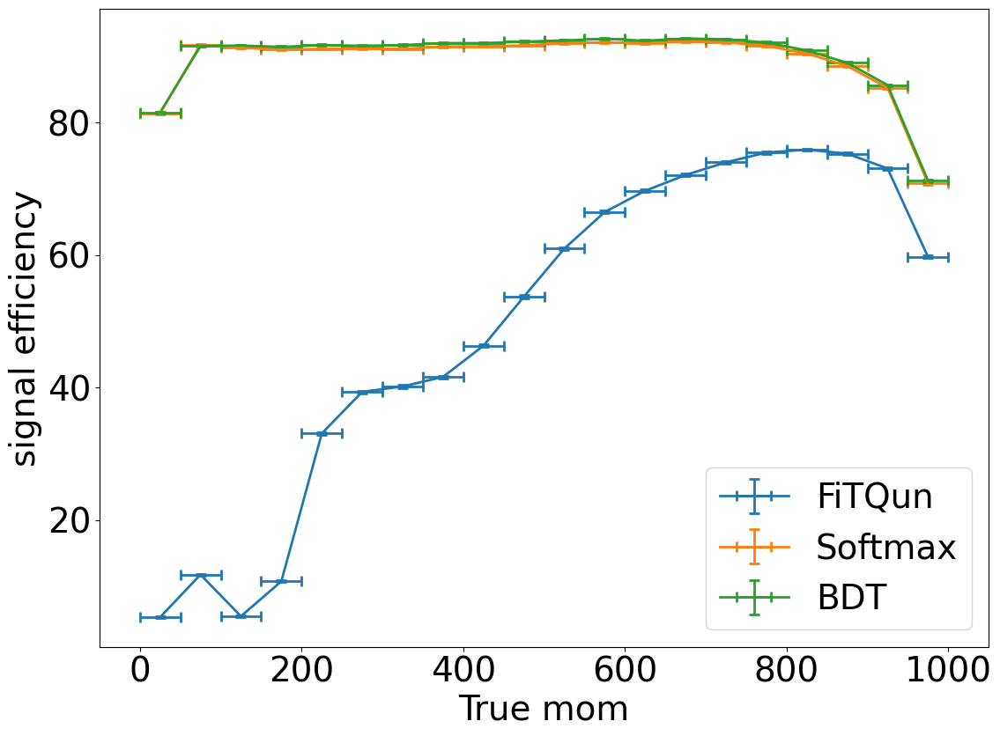

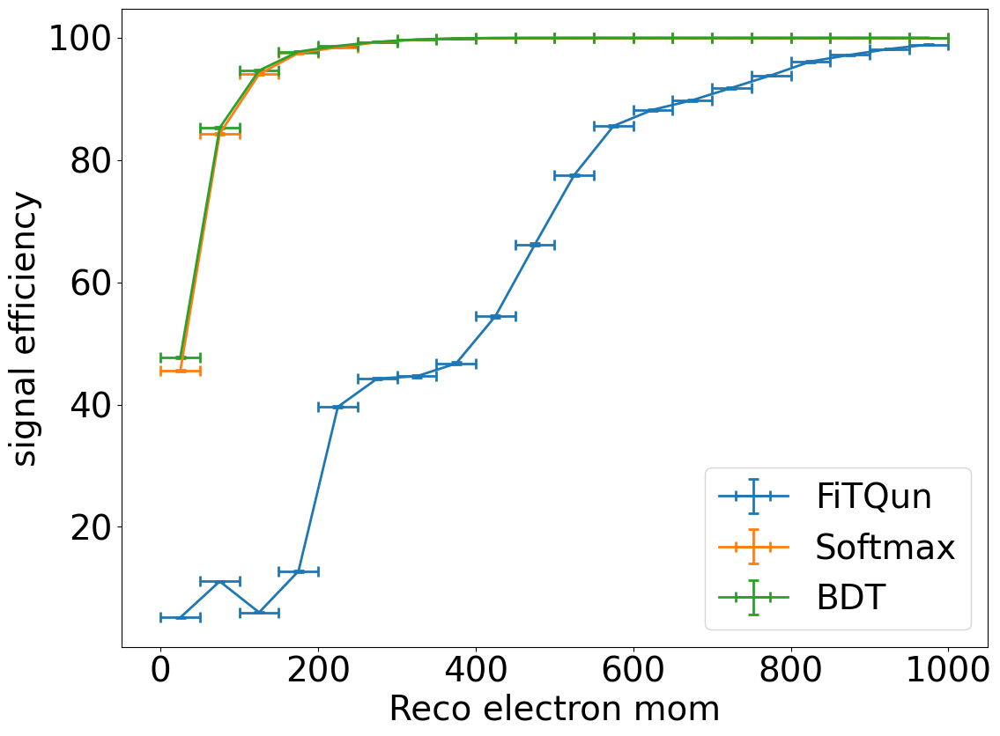

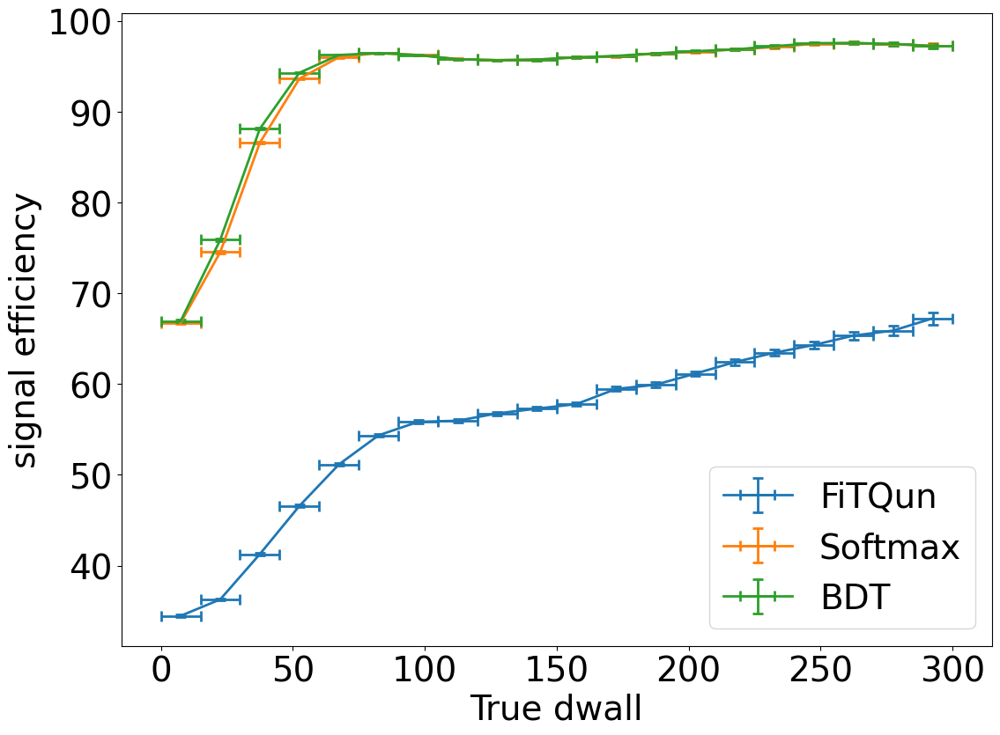

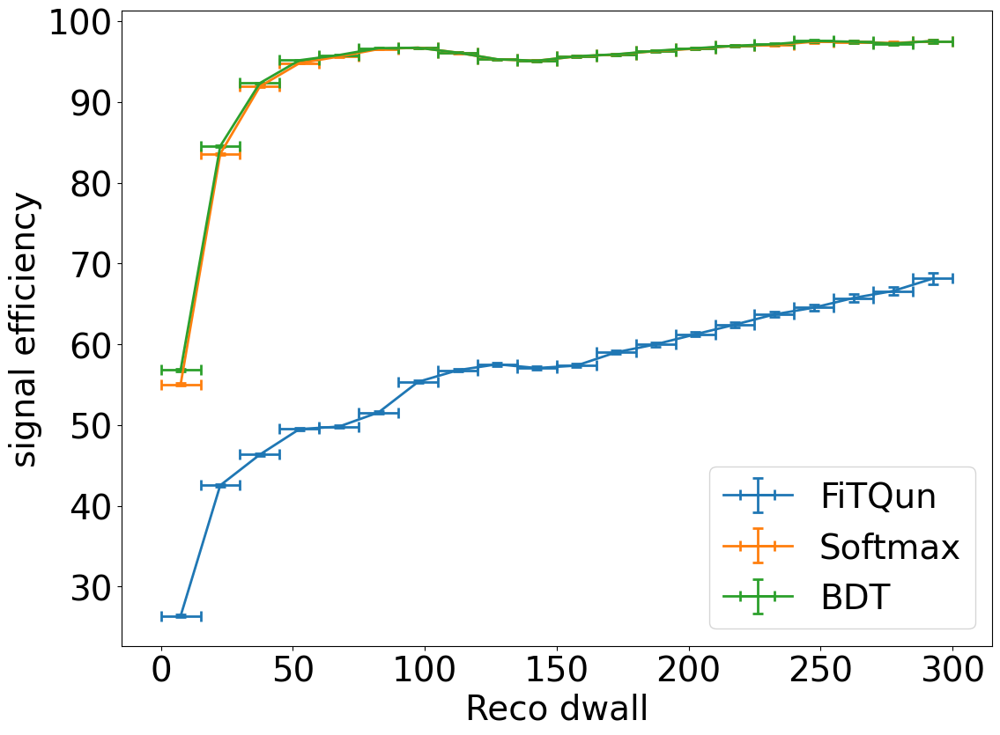

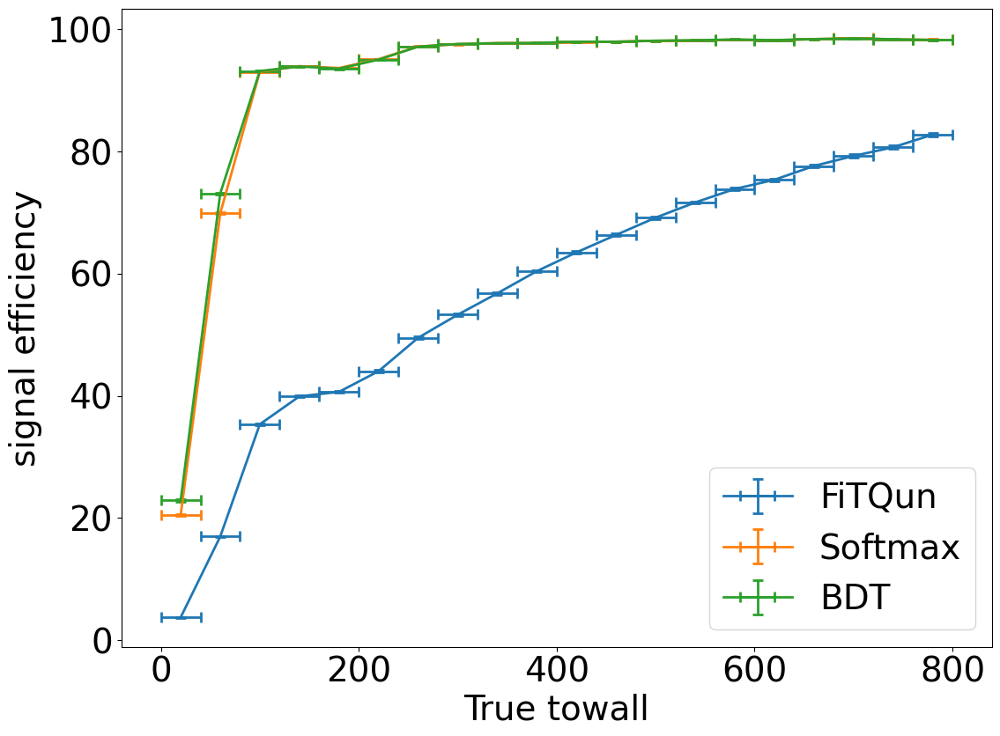

...

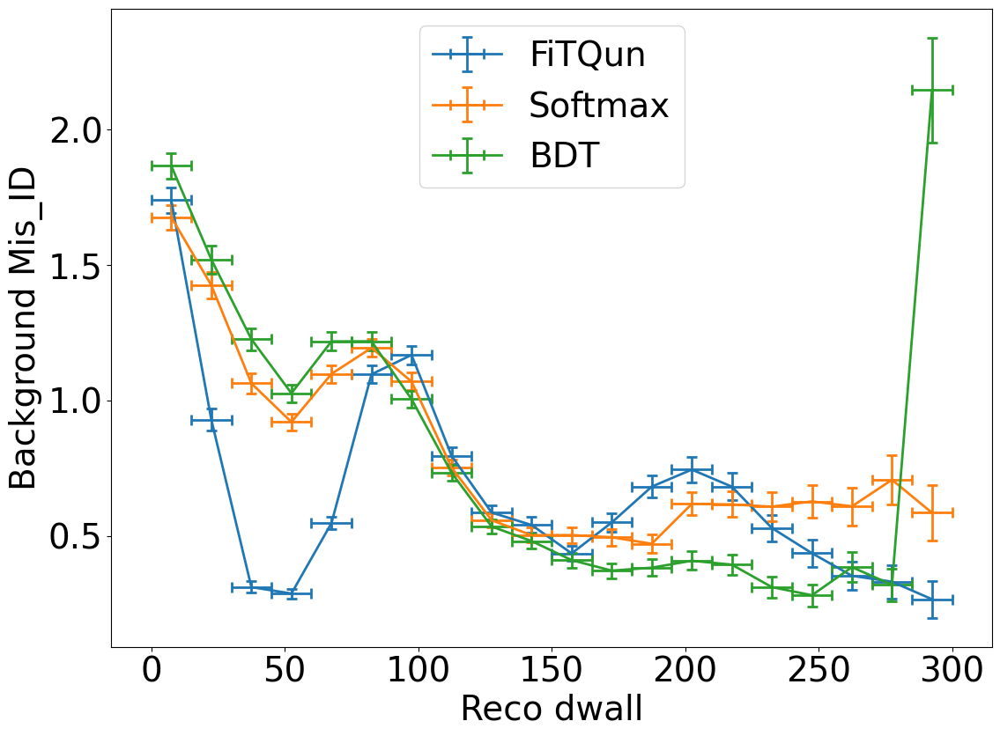

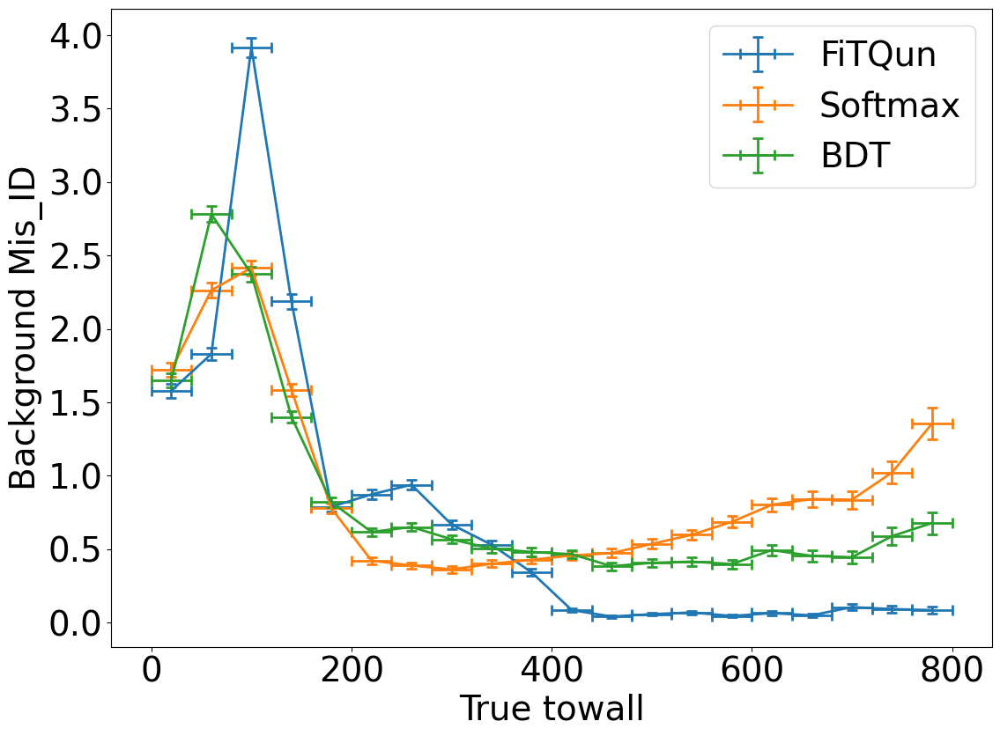

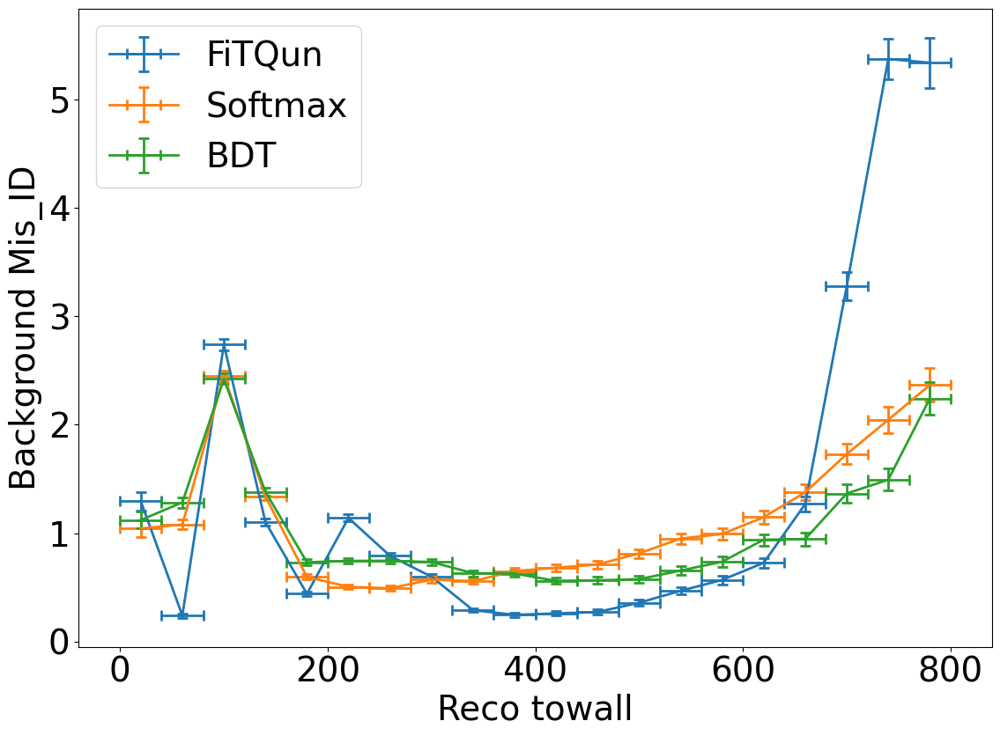

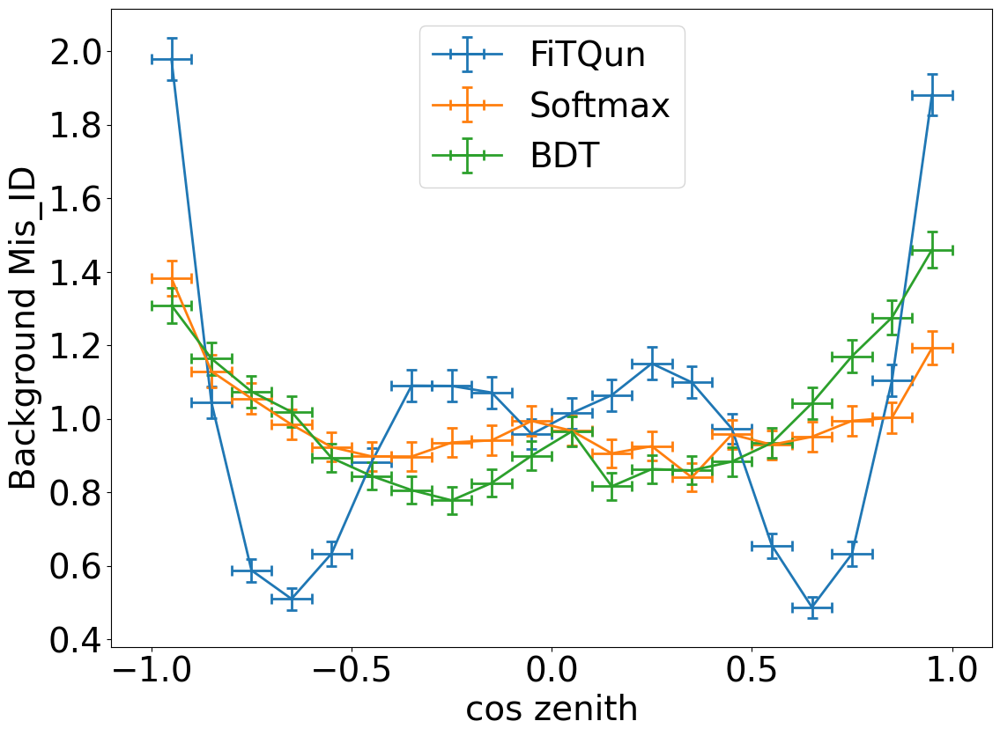

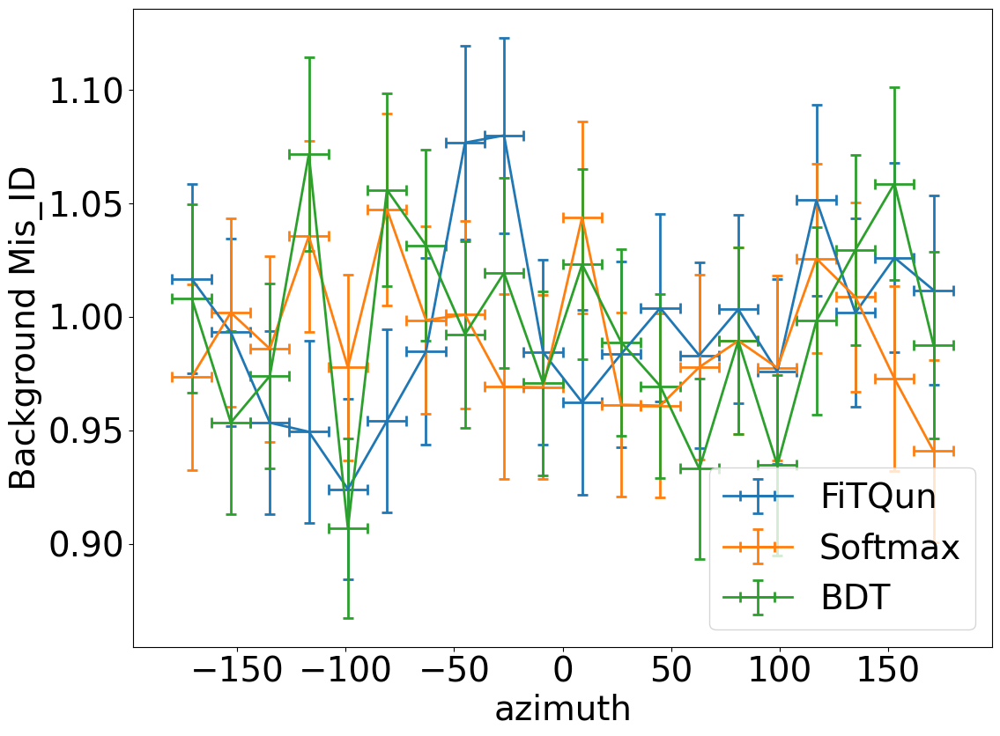

In [29]:
# Plotting efficiency profile using binned muon rejection of 0.99 over reco mom, before applying preselection using cuts

plot.efficiency_profile(df, 1, mom_binning, algorithms, cut_array=binned_rejection_cuts, x_label='True mom', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_mom_e_binning, algorithms, cut_array=binned_rejection_cuts, x_label='Reco electron mom', y_label='signal efficiency')
plot.efficiency_profile(df, 1, dwall_binning, algorithms, cut_array=binned_rejection_cuts, x_label='True dwall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_dwall_binning, algorithms, cut_array=binned_rejection_cuts, x_label='Reco dwall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, towall_binning, algorithms, cut_array=binned_rejection_cuts, x_label='True towall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_towall_binning, algorithms, cut_array=binned_rejection_cuts, x_label='Reco towall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, cos_zenith_binning, algorithms, cut_array=binned_rejection_cuts, x_label='cos zenith', y_label='signal efficiency')
plot.efficiency_profile(df, 1, azimuth_binning, algorithms, cut_array=binned_rejection_cuts, x_label='azimuth', y_label='signal efficiency')

plot.efficiency_profile(df, 2, mom_binning, algorithms, cut_array=binned_rejection_cuts, x_label='True mom', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_mom_e_binning, algorithms, cut_array=binned_rejection_cuts, x_label='Reco electron mom', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, dwall_binning, algorithms, cut_array=binned_rejection_cuts, x_label='True dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_dwall_binning, algorithms, cut_array=binned_rejection_cuts, x_label='Reco dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, towall_binning, algorithms, cut_array=binned_rejection_cuts, x_label='True towall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_towall_binning, algorithms, cut_array=binned_rejection_cuts, x_label='Reco towall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, cos_zenith_binning, algorithms, cut_array=binned_rejection_cuts, x_label='cos zenith', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, azimuth_binning, algorithms, cut_array=binned_rejection_cuts, x_label='azimuth', y_label='Background Mis_ID')

(<Figure size 1200x900 with 1 Axes>,
 <AxesSubplot: xlabel='azimuth', ylabel='Background Mis_ID'>)

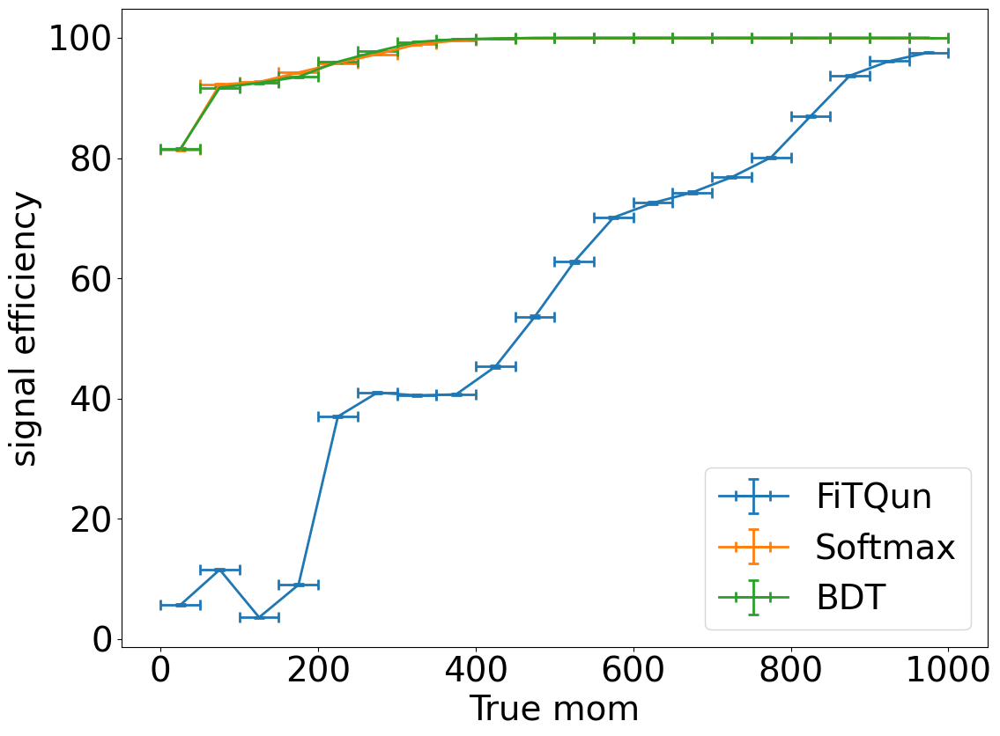

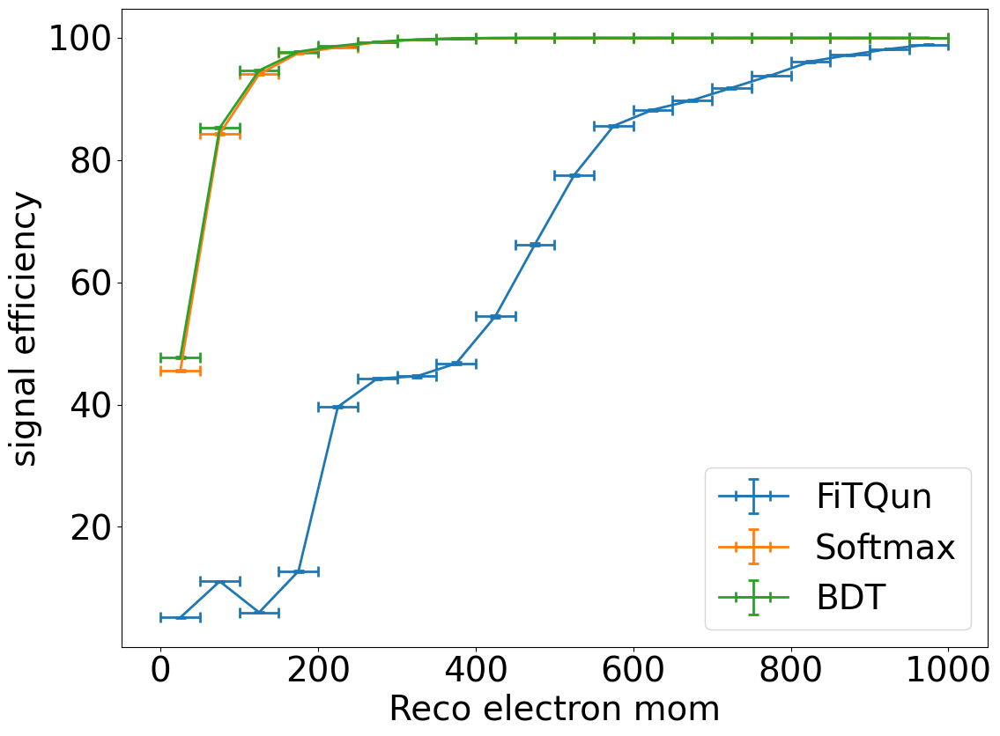

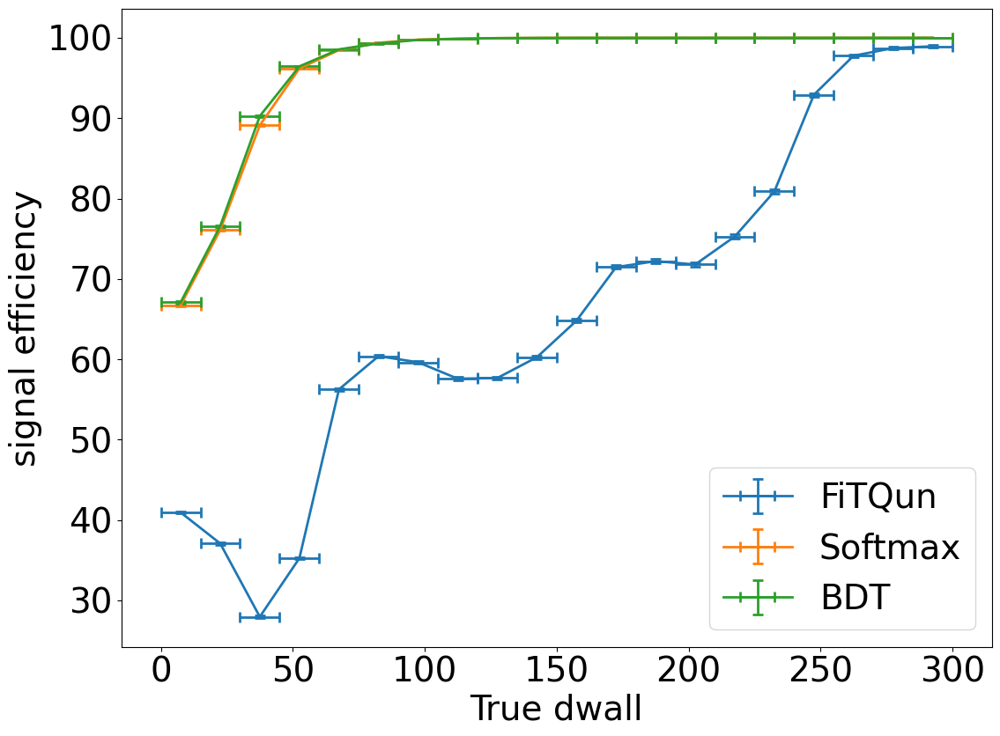

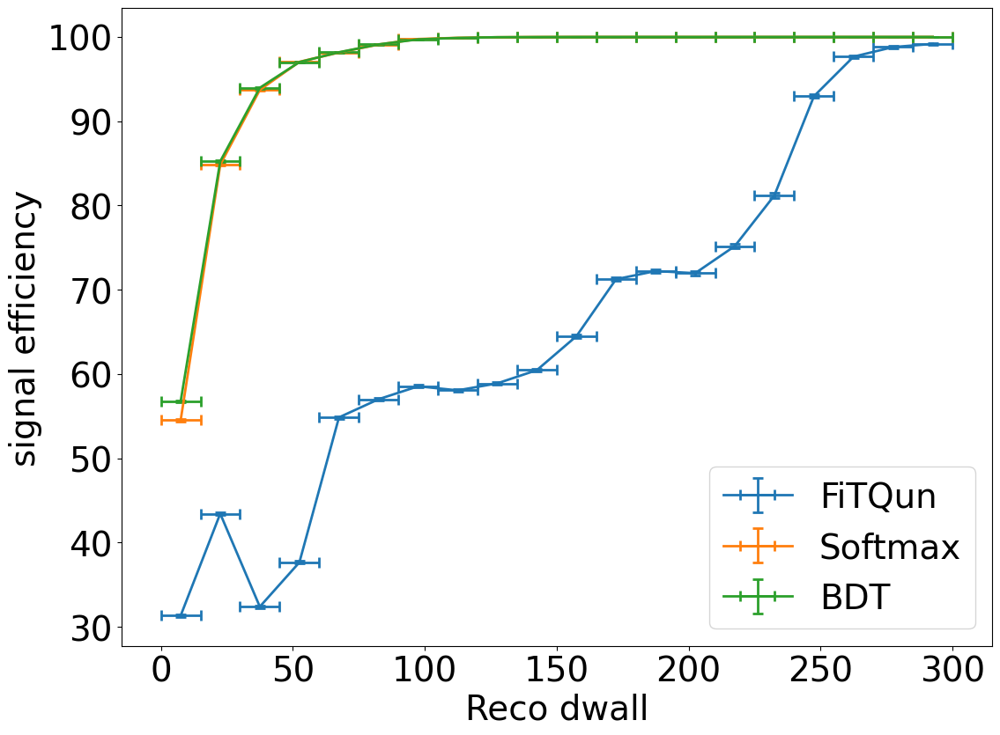

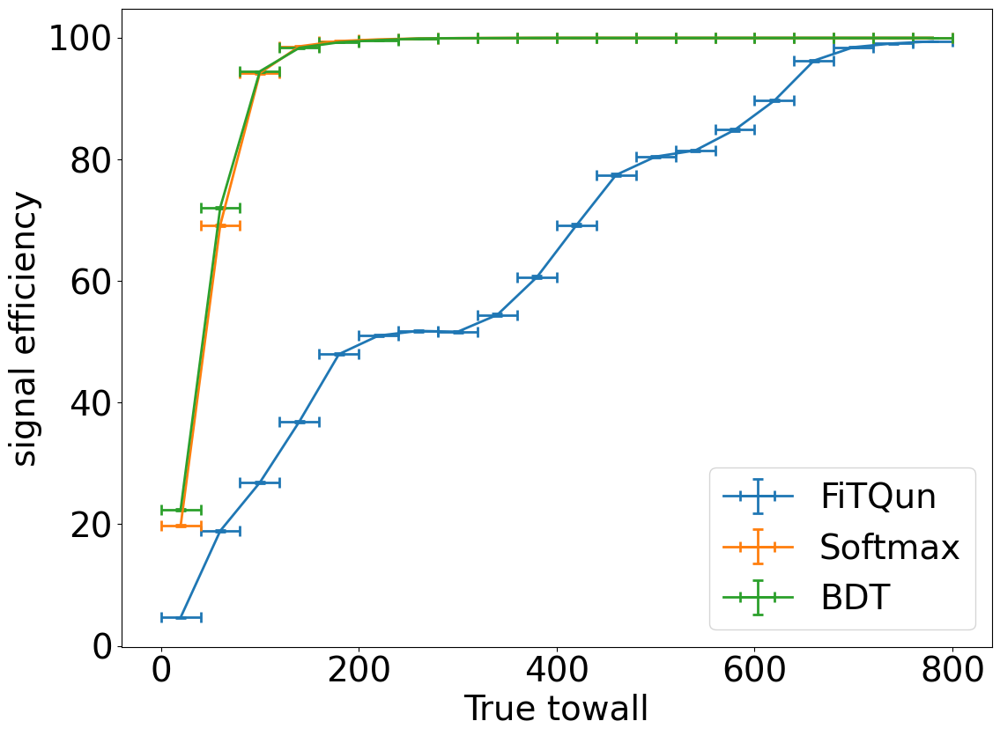

...

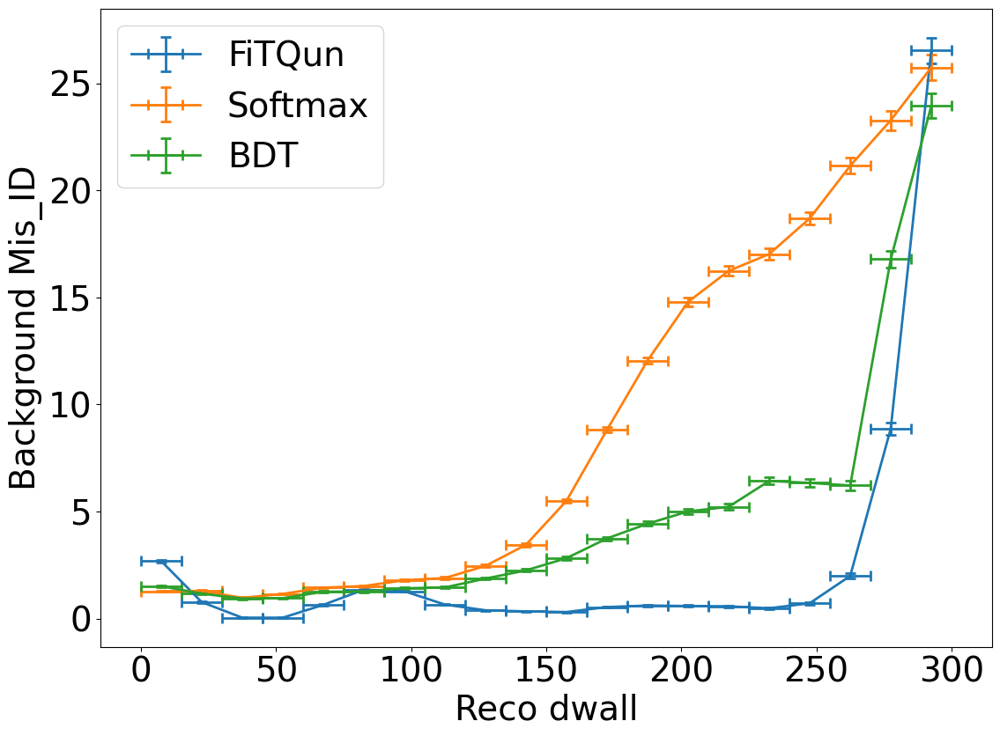

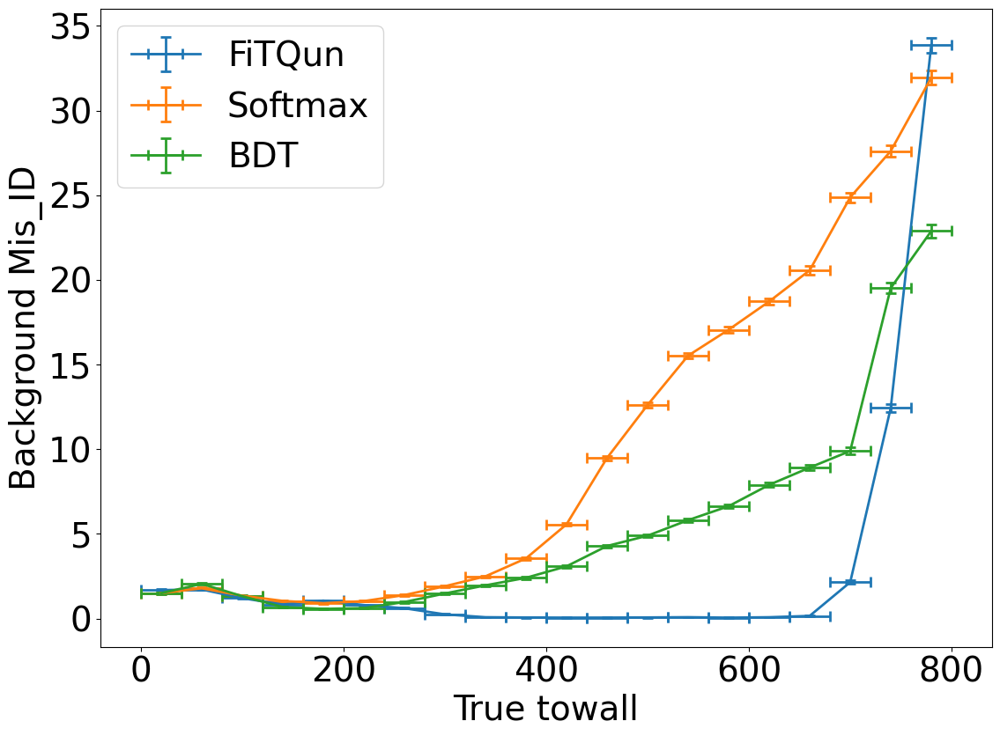

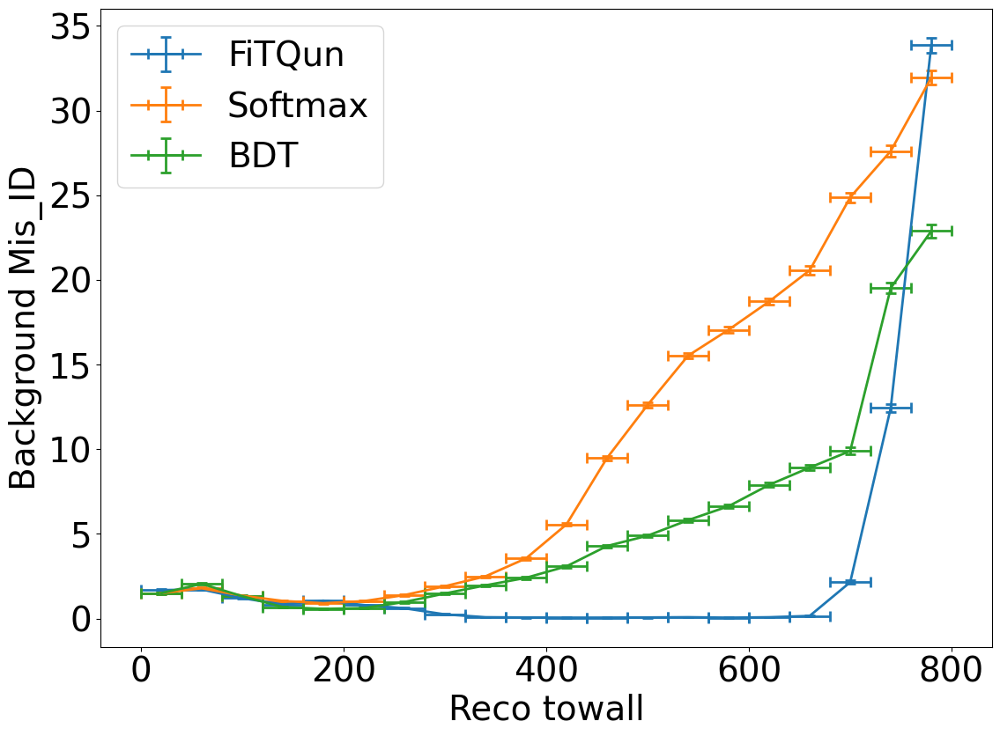

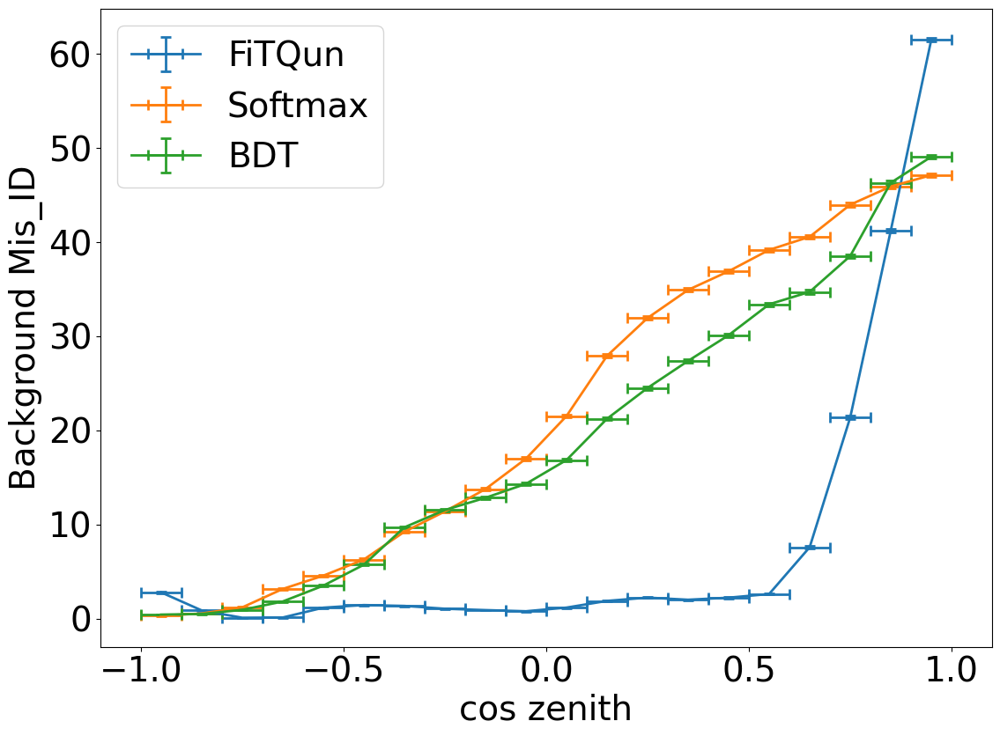

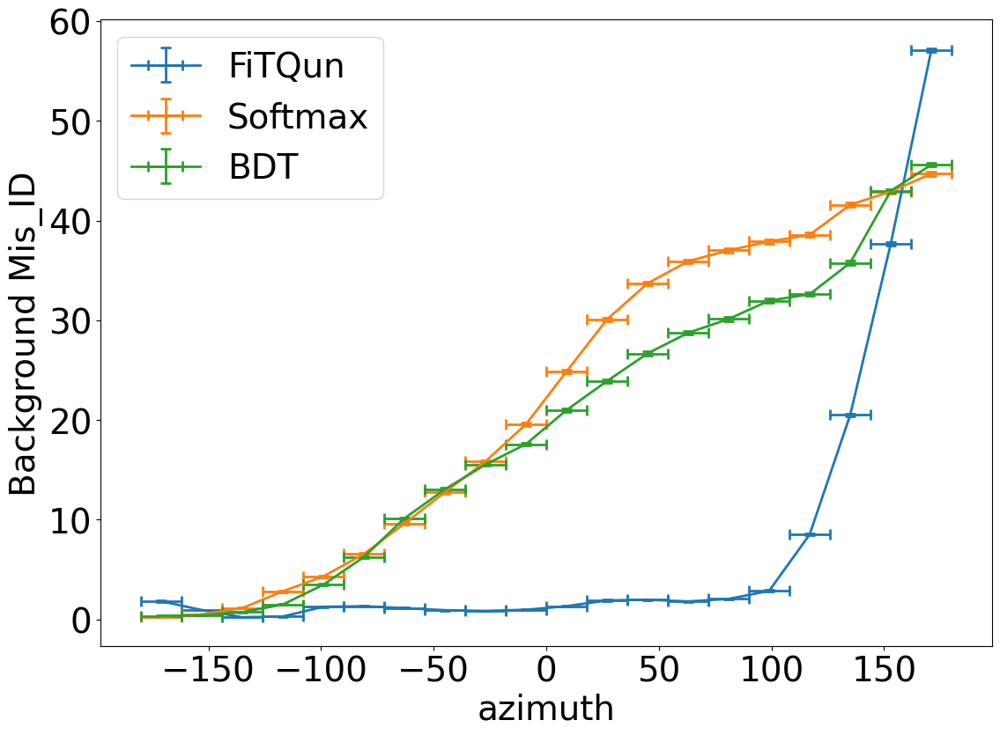

In [30]:
# Plotting efficiency profile using binned muon rejection of 0.99 over reco mom, before applying preselection using threshold

plot.efficiency_profile(df, 1, mom_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs, x_label='True mom', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_mom_e_binning, algorithms, threshold_array=binned_rejection_thresholds,signal_probability_array=probs, x_label='Reco electron mom', y_label='signal efficiency')
plot.efficiency_profile(df, 1, dwall_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs,x_label='True dwall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, reco_dwall_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs,x_label='Reco dwall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, towall_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs, x_label='True towall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, towall_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs, x_label='Reco towall', y_label='signal efficiency')
plot.efficiency_profile(df, 1, cos_zenith_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs, x_label='cos zenith', y_label='signal efficiency')
plot.efficiency_profile(df, 1, azimuth_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs, x_label='azimuth', y_label='signal efficiency')

plot.efficiency_profile(df, 2, mom_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs,x_label='True mom', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_mom_e_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs, x_label='Reco electron mom', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, dwall_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs,x_label='True dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, reco_dwall_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs,x_label='Reco dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, towall_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs,x_label='True towall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, towall_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs, x_label='Reco towall', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, cos_zenith_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs, x_label='cos zenith', y_label='Background Mis_ID')
plot.efficiency_profile(df, 2, azimuth_binning, algorithms, threshold_array=binned_rejection_thresholds, signal_probability_array=probs, x_label='azimuth', y_label='Background Mis_ID')

(<Figure size 1200x900 with 1 Axes>,
 <AxesSubplot: xlabel='azimuth', ylabel='Background Mis_ID'>)

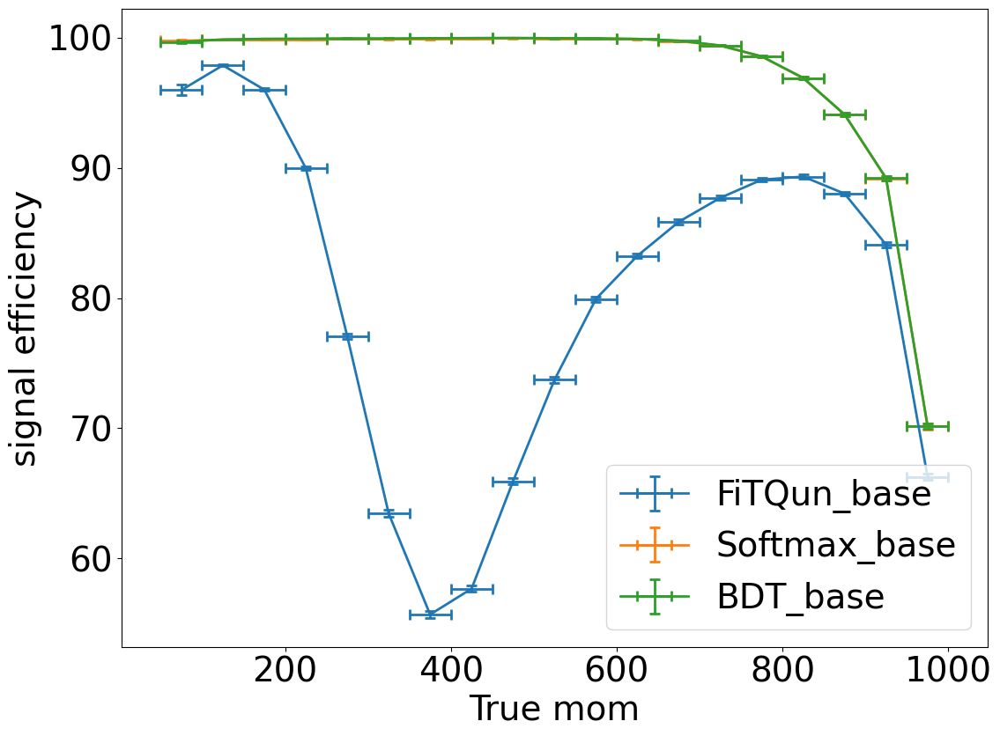

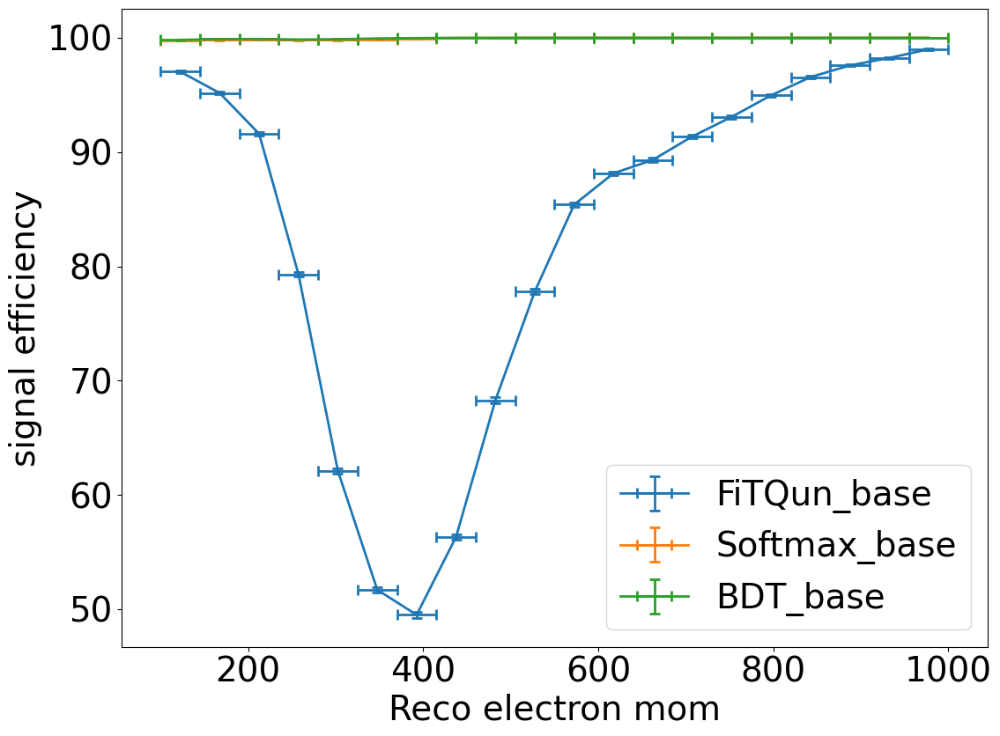

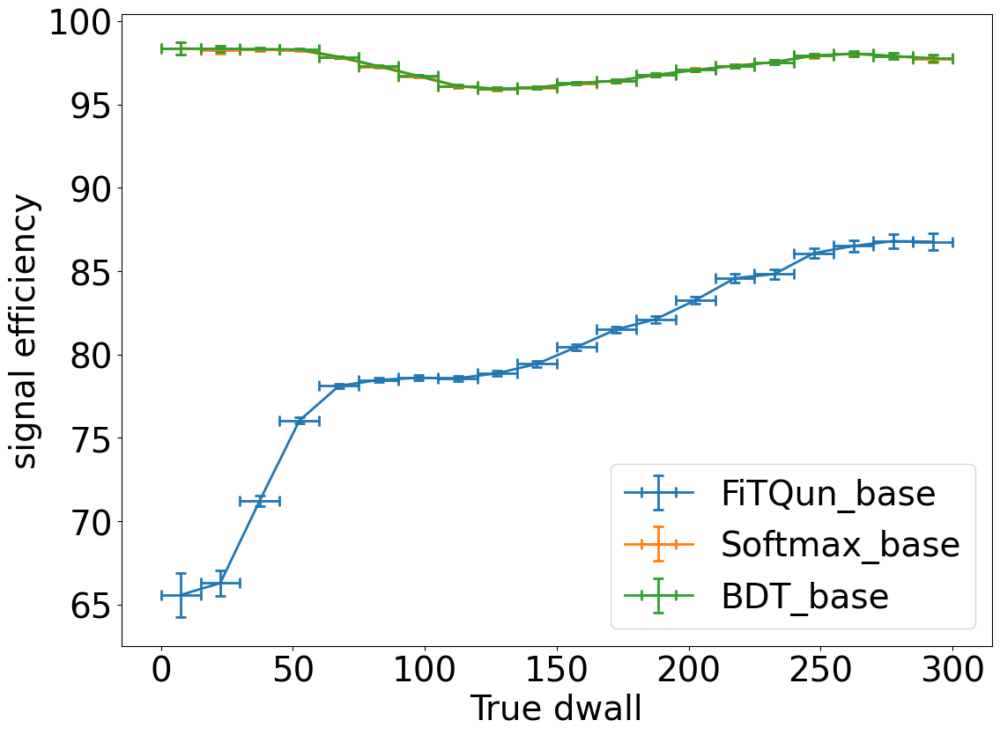

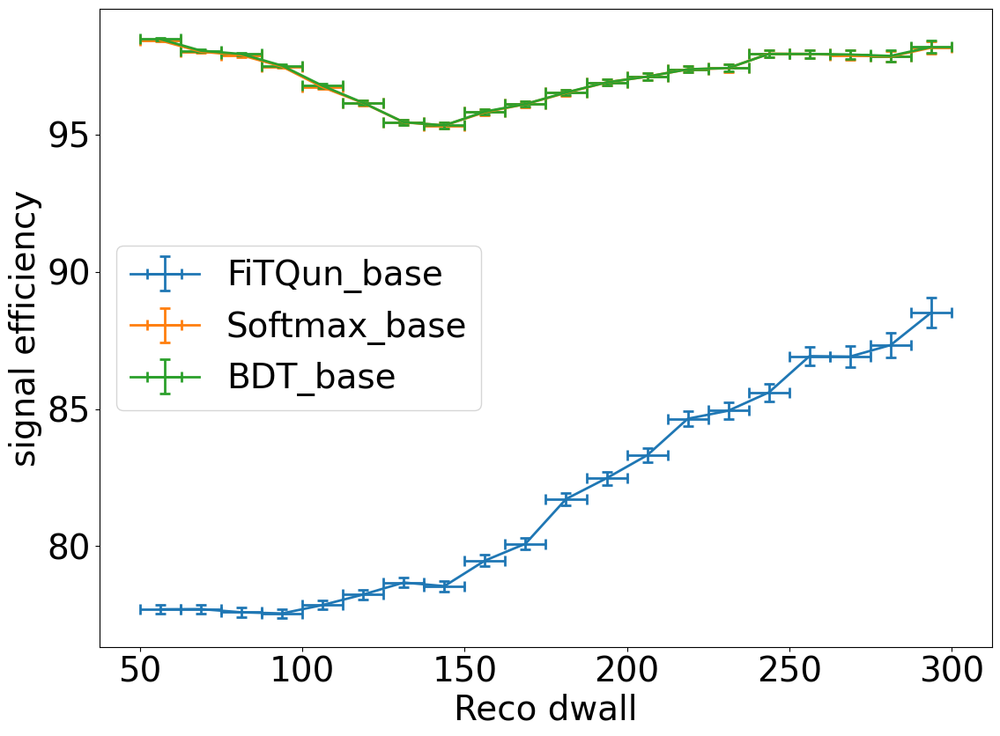

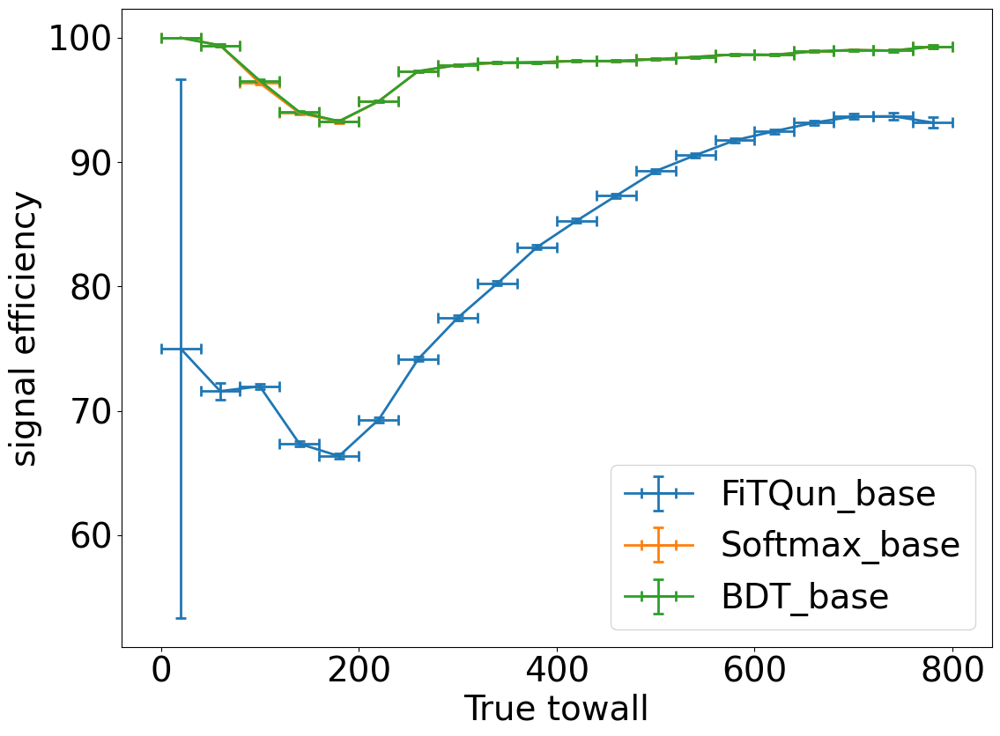

...

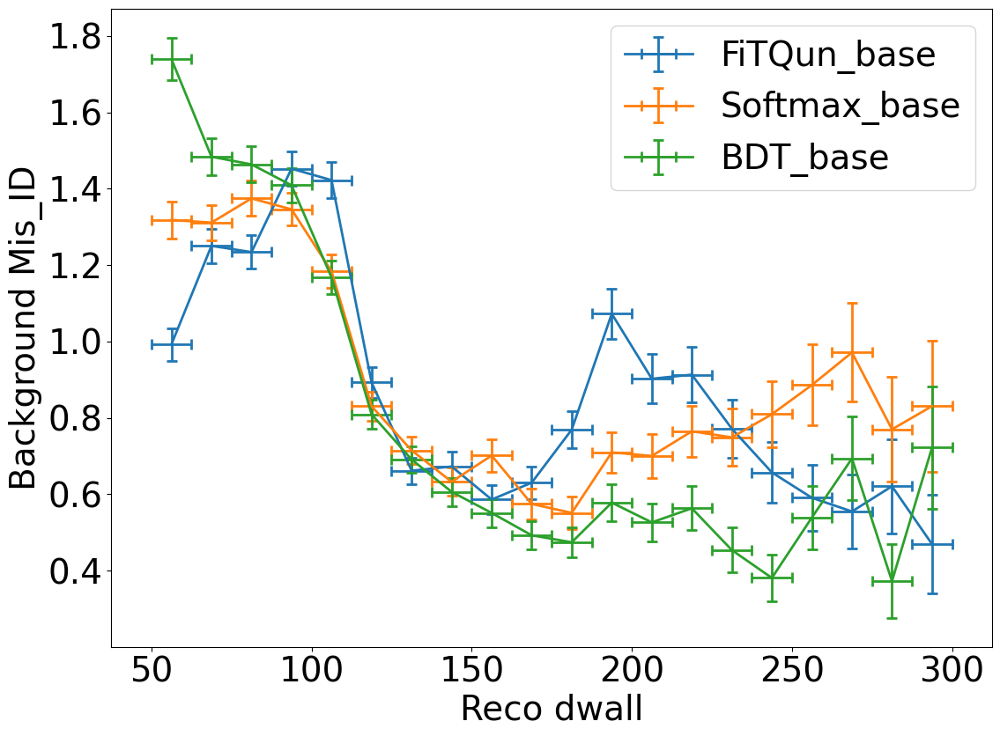

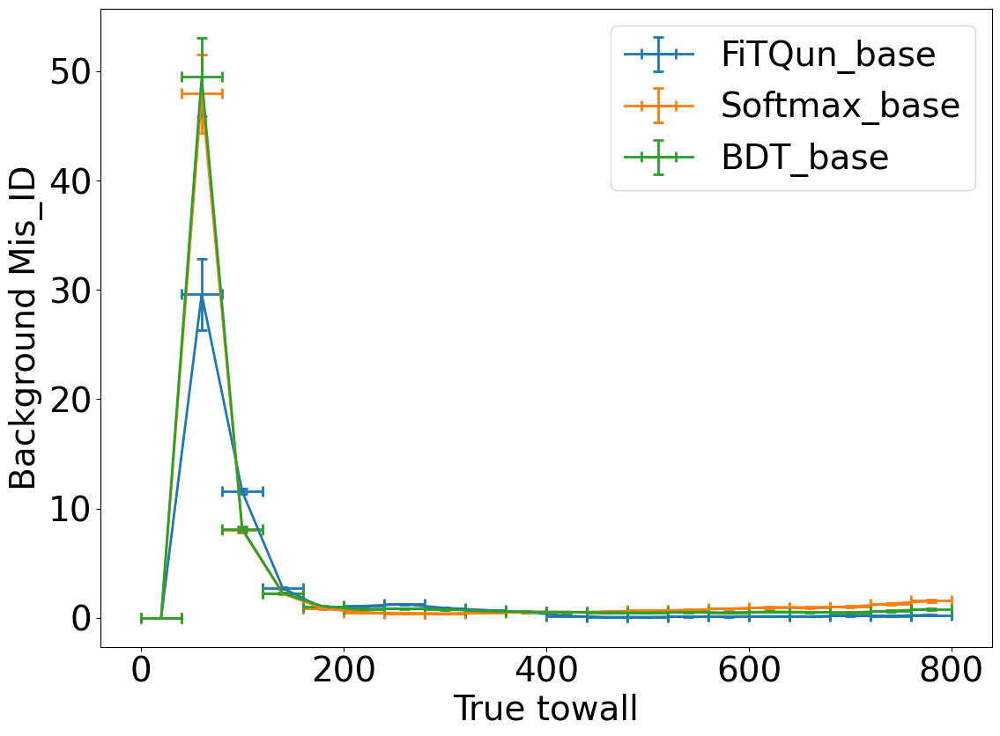

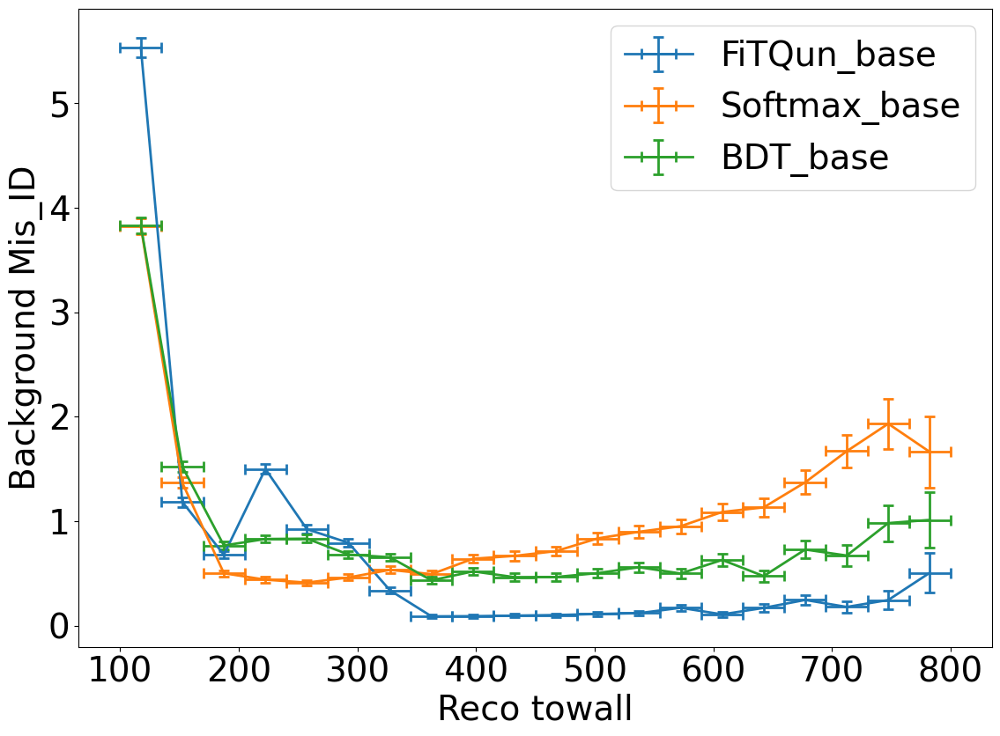

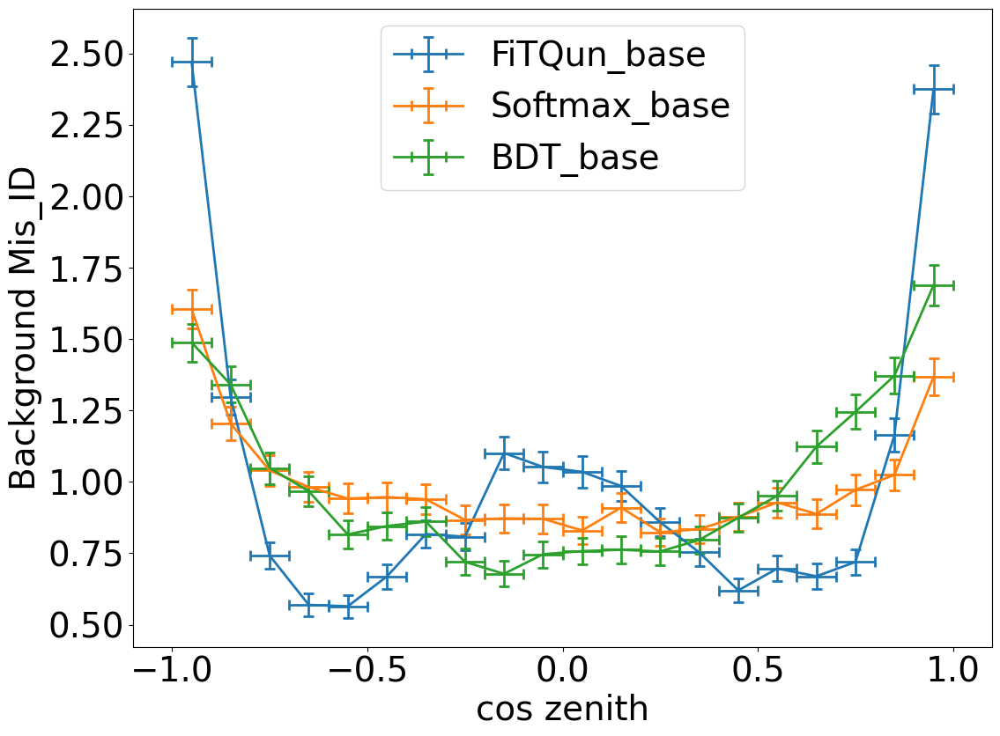

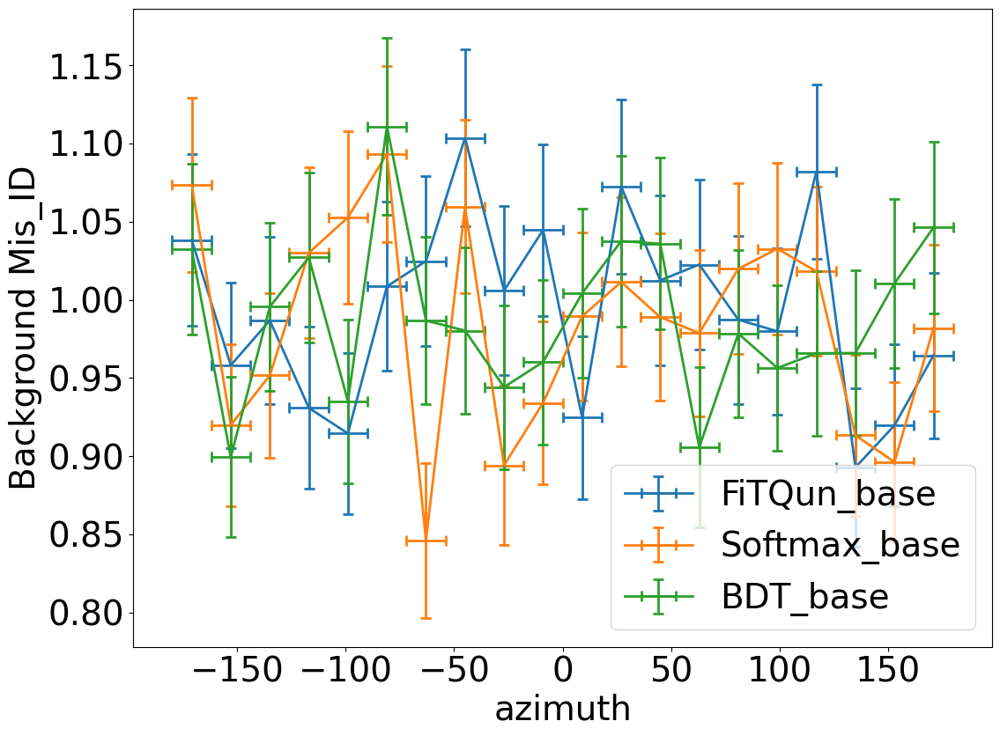

In [31]:
# Plotting efficiency profile using binned muon rejection of 0.99 over reco mom, after applying preselection using cuts

plot.efficiency_profile(df_base, 1, mom_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='True mom', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_mom_e_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='Reco electron mom', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, dwall_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='True dwall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_dwall_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='Reco dwall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, towall_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='True towall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_towall_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='Reco towall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, cos_zenith_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='cos zenith', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, azimuth_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='azimuth', y_label='signal efficiency')

plot.efficiency_profile(df_base, 2, mom_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='True mom', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_mom_e_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='Reco electron mom', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, dwall_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='True dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_dwall_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='Reco dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, towall_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='True towall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_towall_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='Reco towall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, cos_zenith_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='cos zenith', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, azimuth_binning_base, algorithms_base, cut_array=binned_rejection_cuts_base, x_label='azimuth', y_label='Background Mis_ID')

(<Figure size 1200x900 with 1 Axes>,
 <AxesSubplot: xlabel='azimuth', ylabel='Background Mis_ID'>)

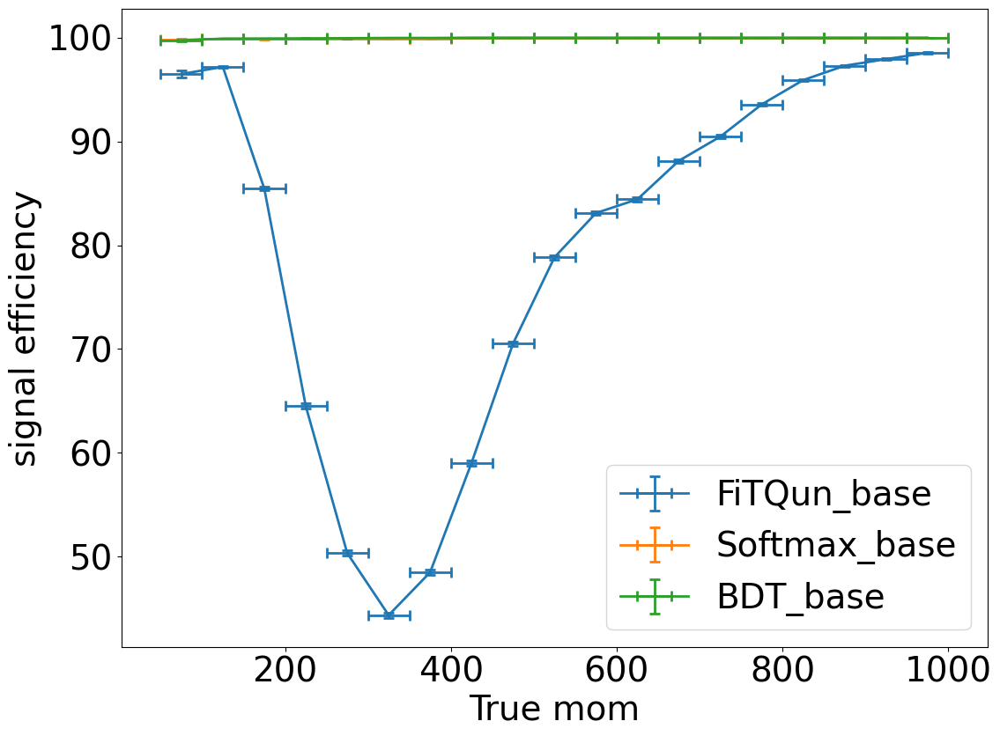

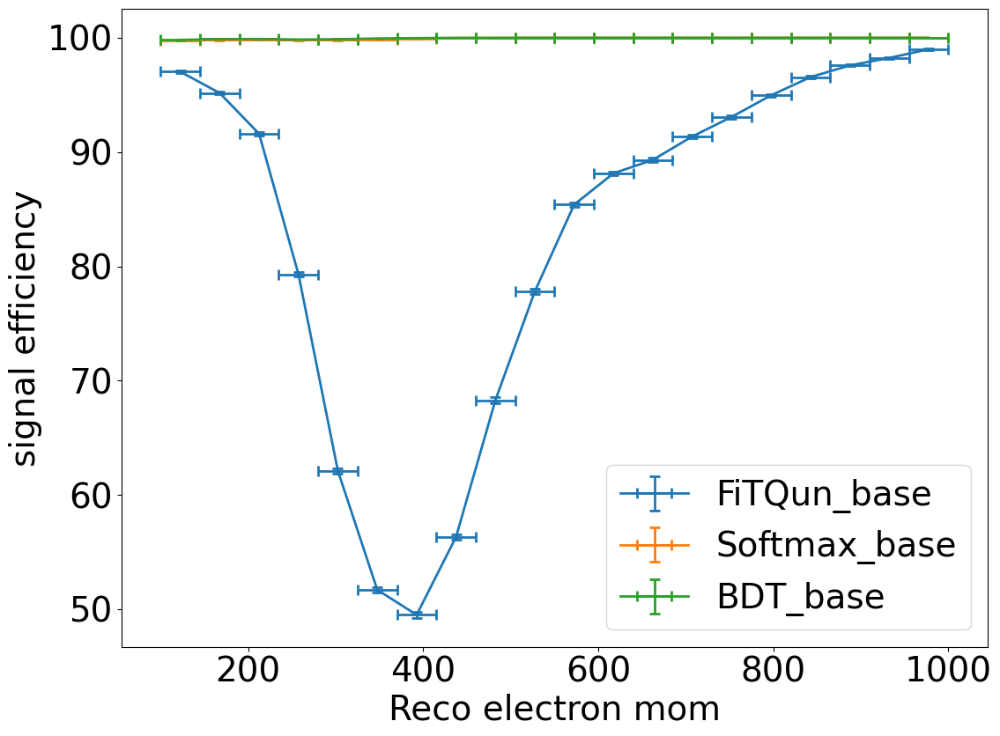

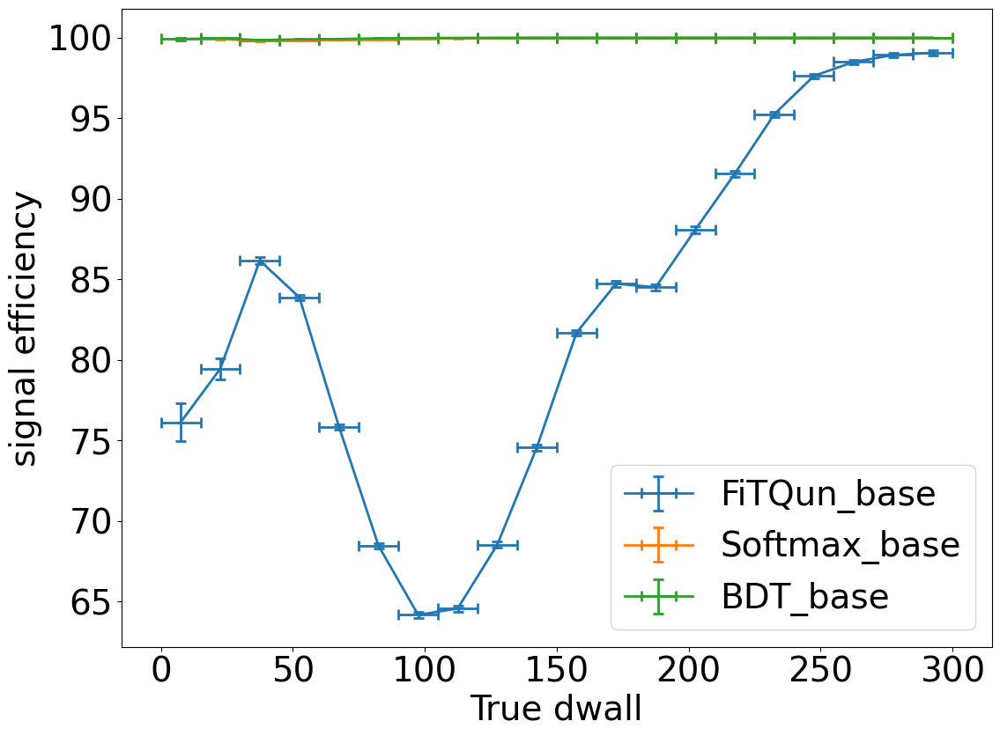

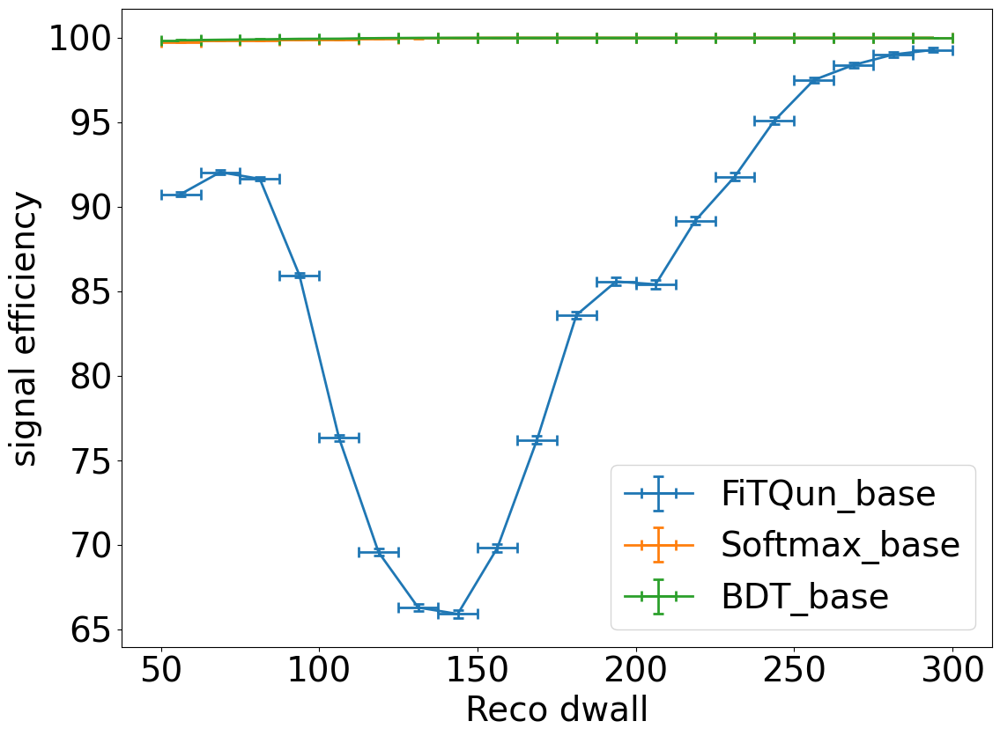

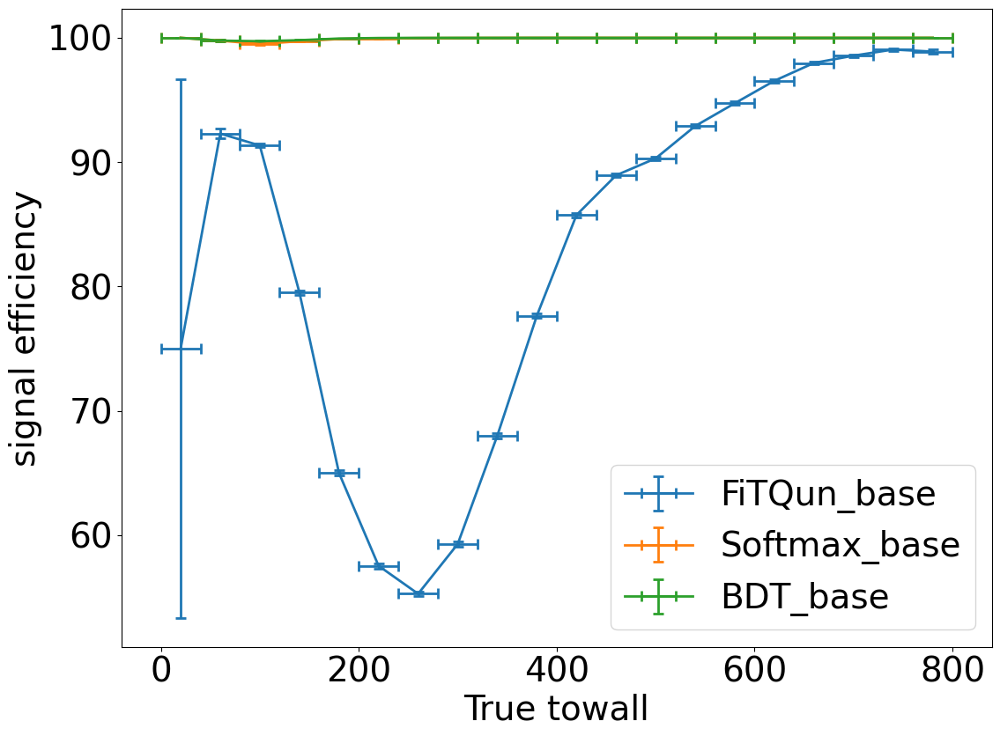

...

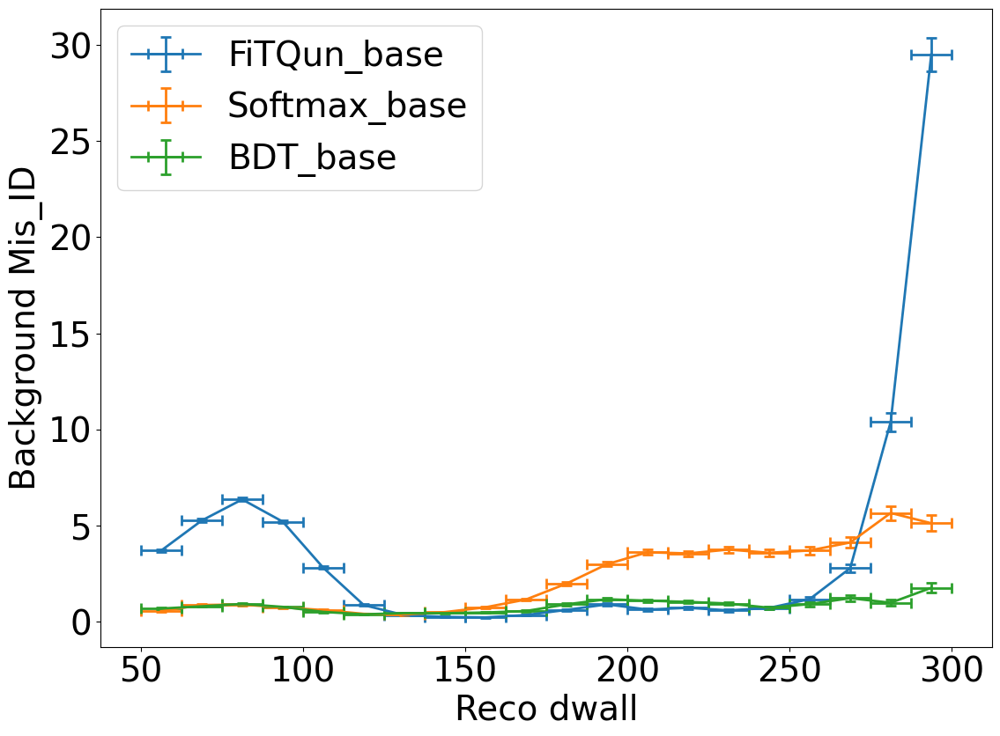

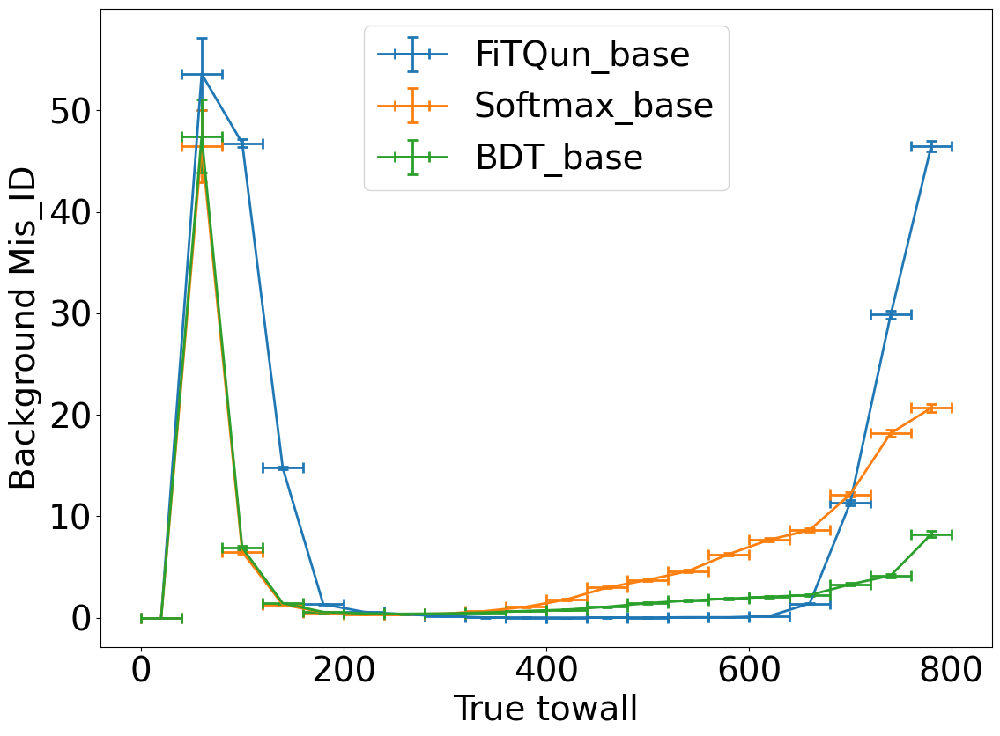

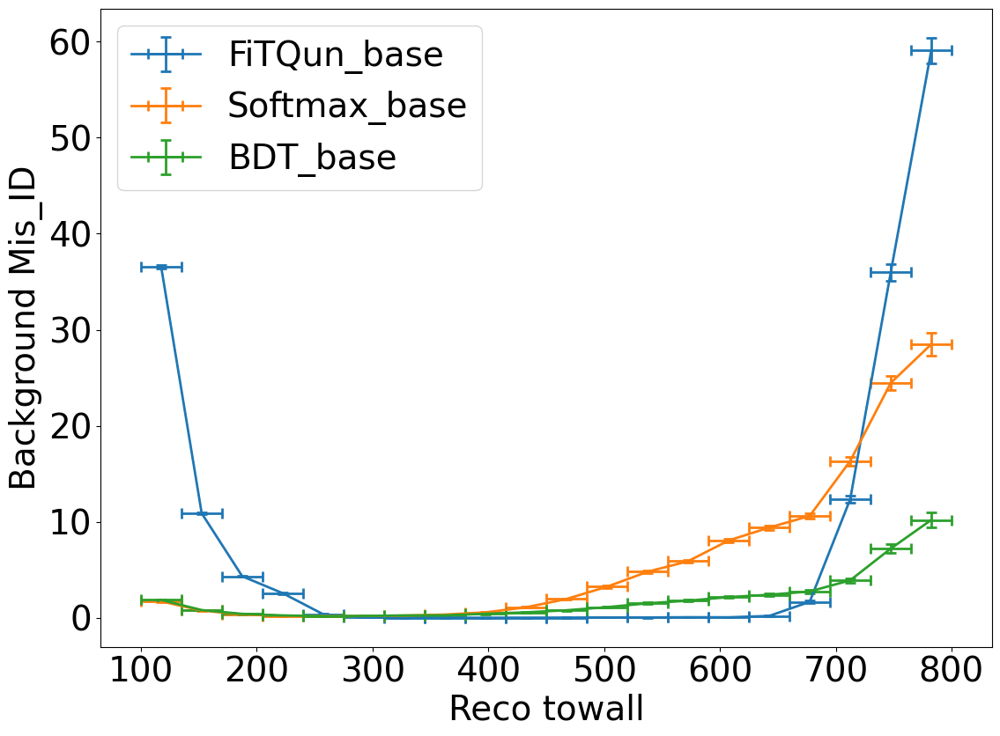

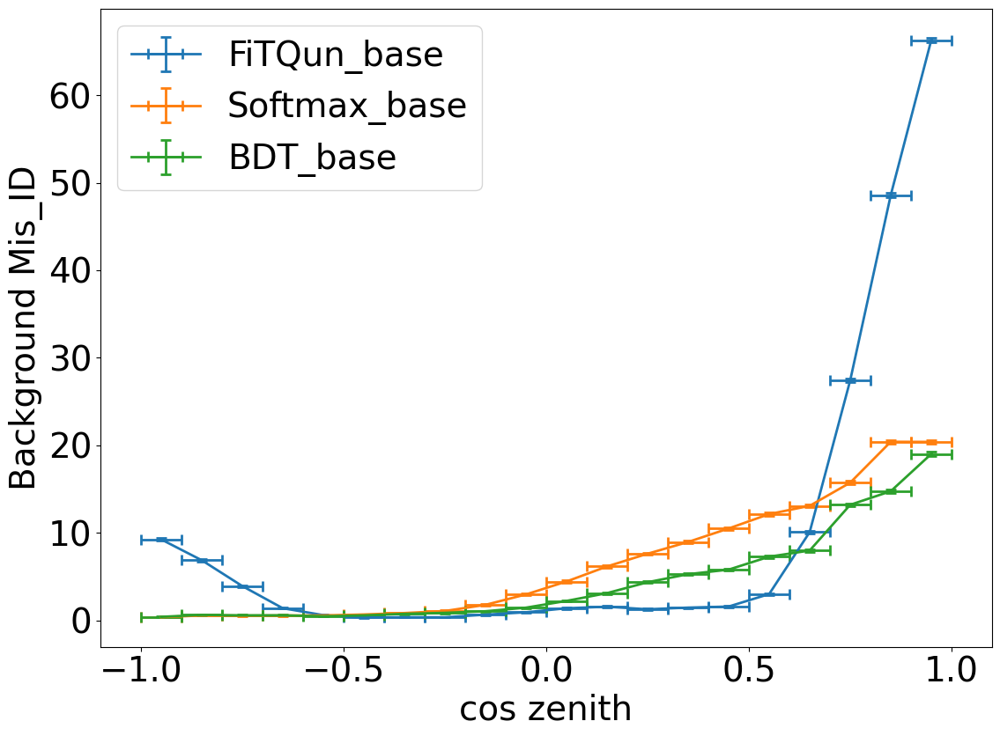

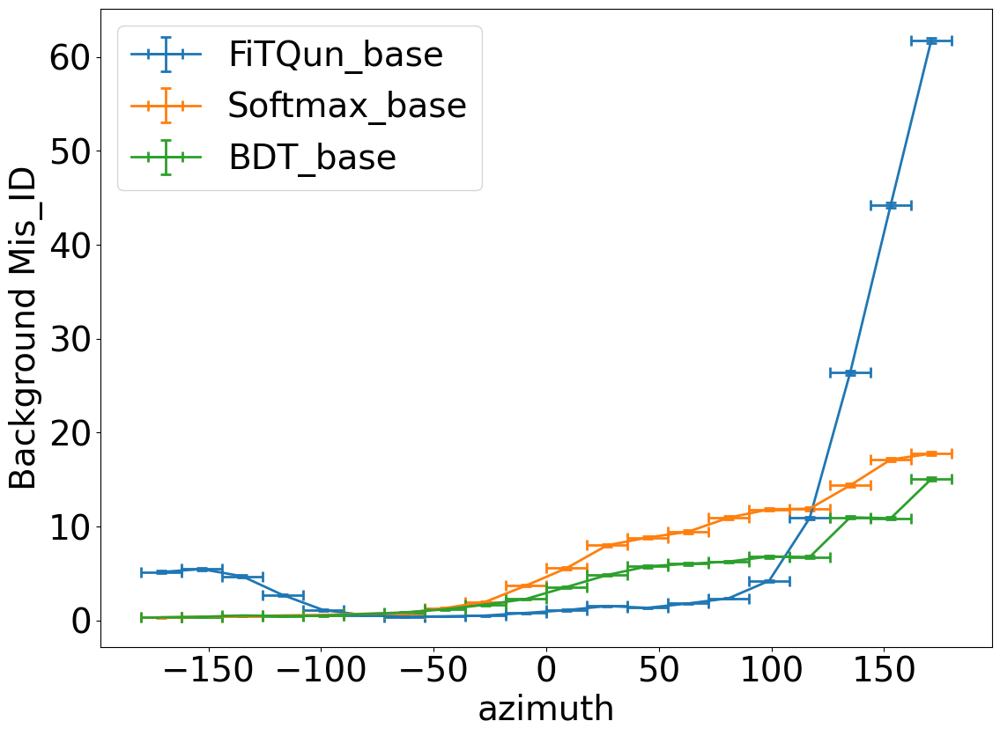

In [32]:
# Plotting efficiency profile using binned muon rejection of 0.99 over reco mom, before applying preselection using threshold

plot.efficiency_profile(df_base, 1, mom_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base, x_label='True mom', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_mom_e_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base,signal_probability_array=probs_base, x_label='Reco electron mom', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, dwall_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base,x_label='True dwall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_dwall_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base,x_label='Reco dwall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, towall_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base, x_label='True towall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, reco_towall_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base, x_label='Reco towall', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, cos_zenith_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base, x_label='cos zenith', y_label='signal efficiency')
plot.efficiency_profile(df_base, 1, azimuth_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base, x_label='azimuth', y_label='signal efficiency')

plot.efficiency_profile(df_base, 2, mom_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base,x_label='True mom', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_mom_e_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base, x_label='Reco electron mom', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, dwall_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base,x_label='True dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_dwall_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base,x_label='Reco dwall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, towall_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base,x_label='True towall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, reco_towall_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base, x_label='Reco towall', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, cos_zenith_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base, x_label='cos zenith', y_label='Background Mis_ID')
plot.efficiency_profile(df_base, 2, azimuth_binning_base, algorithms_base, threshold_array=binned_rejection_thresholds_base, signal_probability_array=probs_base, x_label='azimuth', y_label='Background Mis_ID')

In [33]:
# Getting the signal efficiency and background rejection for all different binned rejection cuts before and after applying preselection
# by defining cuts using threshold which rejects 99% muons over reco mom bins

# First finding efficiency and rejection over cuts 
sig_eff = classification_metrics.sg_eff(df['true_sig'], binned_rejection_cuts)
bg_rej = classification_metrics.bg_rej(df['true_sig'], binned_rejection_cuts)

for i in range(len(sig_eff)):
    print(f'The signal efficiency  and background rejection for {algorithms[i]} cuts is : {round(sig_eff[i], 3)}, {round(bg_rej[i], 3)}')
    
print('\n')

sig_eff_base = classification_metrics.sg_eff(df_base['true_sig'], binned_rejection_cuts_base)
bg_rej_base = classification_metrics.bg_rej(df_base['true_sig'], binned_rejection_cuts_base)

for i in range(len(sig_eff_base)):
    print(f'The signal efficiency  and background rejection for {algorithms_base[i]} cuts is : {round(sig_eff_base[i], 3)}, {round(bg_rej_base[i], 3)}')
    
print('\n')

# Now, defining metrics using thresholds:

bins = [mom_binning, reco_mom_e_binning, dwall_binning, towall_binning]
bins_name = ['True_mom', 'reco_mom', 'true_dwall', 'true_towall']
bins_base = [mom_binning_base, reco_mom_e_binning_base, dwall_binning_base, towall_binning_base]
bins_name_base = ['True_mom_base', 'reco_mom_base', 'true_dwall_base', 'true_towall_base']


for j in range(len(bins)):
    cuts_binned = []
    cuts_binned_base = []
    for i in range(len(probs)):
        cuts_binned.append(probs[i] > binned_rejection_thresholds[i][bins[j][1]])
        cuts_binned_base.append(probs_base[i] > binned_rejection_thresholds_base[i][bins_base[j][1]])
    
    sig_eff = classification_metrics.sg_eff(df['true_sig'], cuts_binned)
    bg_rej = classification_metrics.bg_rej(df['true_sig'], cuts_binned)

    for i in range(len(sig_eff)):
        print(f'The signal efficiency  and background rejection for {algorithms[i]} cuts using {bins_name[j]} binning is : {round(sig_eff[i], 3)}, {round(bg_rej[i], 3)}')

    print('\n')

    sig_eff_base = classification_metrics.sg_eff(df_base['true_sig'], cuts_binned_base)
    bg_rej_base = classification_metrics.bg_rej(df_base['true_sig'], cuts_binned_base)

    for i in range(len(sig_eff_base)):
        print(f'The signal efficiency  and background rejection for {algorithms_base[i]} cuts using {bins_name_base[j]} binning is : {round(sig_eff_base[i], 3)}, {round(bg_rej_base[i], 3)}')
    
    print('\n')

The signal efficiency  and background rejection for FiTQun cuts is : 0.497, 0.99
The signal efficiency  and background rejection for Softmax cuts is : 0.895, 0.99
The signal efficiency  and background rejection for BDT cuts is : 0.899, 0.99


The signal efficiency  and background rejection for FiTQun_base cuts is : 0.794, 0.99
The signal efficiency  and background rejection for Softmax_base cuts is : 0.97, 0.99
The signal efficiency  and background rejection for BDT_base cuts is : 0.97, 0.99


The signal efficiency  and background rejection for FiTQun cuts using True_mom binning is : 0.551, 0.937
The signal efficiency  and background rejection for Softmax cuts using True_mom binning is : 0.976, 0.835
The signal efficiency  and background rejection for BDT cuts using True_mom binning is : 0.976, 0.84


The signal efficiency  and background rejection for FiTQun_base cuts using True_mom_base binning is : 0.794, 0.932
The signal efficiency  and background rejection for Softmax_base cuts us

In [34]:
font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : 10}
mpl.rc('font', **font)
mpl.rcParams['figure.figsize'] = (6.4, 4.8)
mpl.rcParams["figure.autolayout"] = True

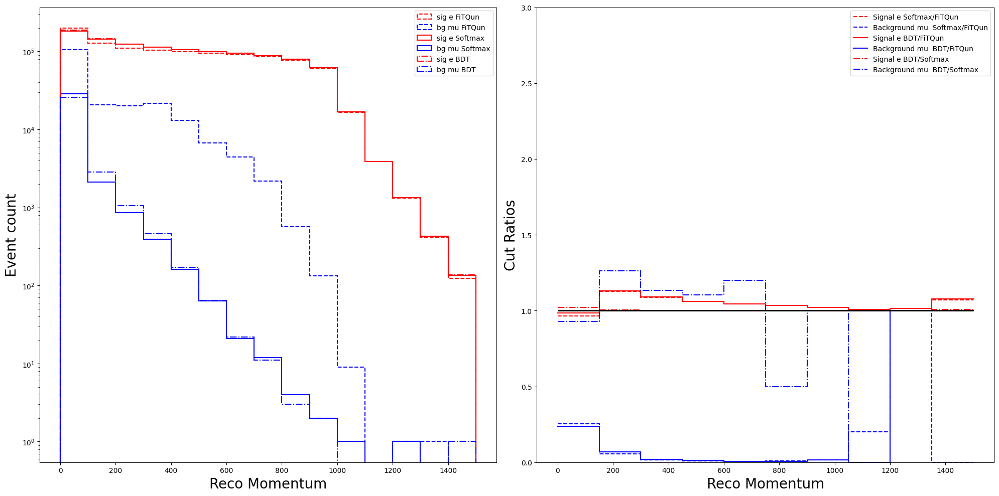

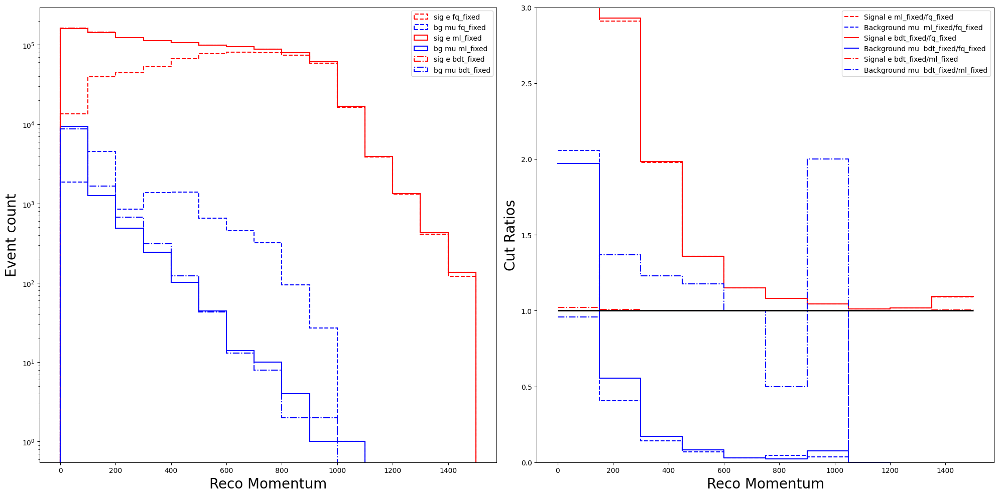

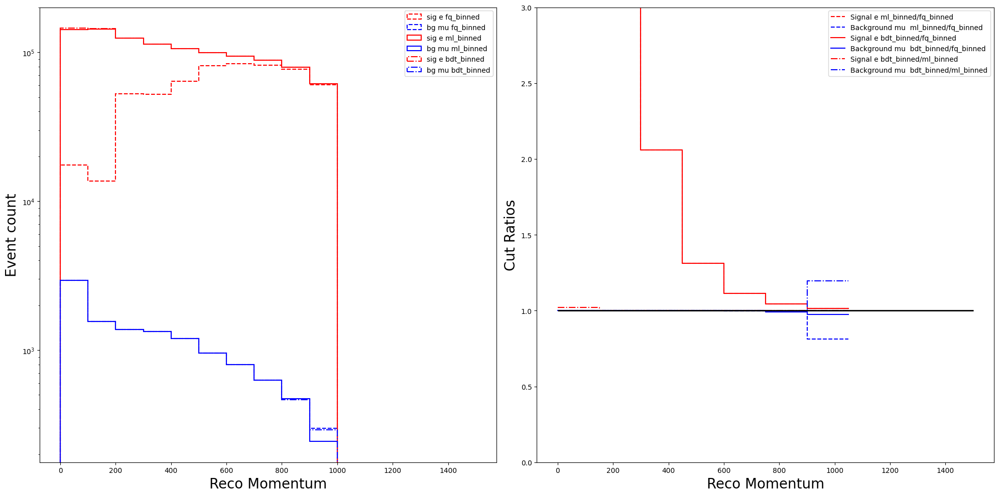

(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='Reco Momentum', ylabel='Event count'>,
        <AxesSubplot: xlabel='Reco Momentum', ylabel='Cut Ratios'>],
       dtype=object))

In [35]:
# Plotting selection comparison histograms for different selected cuts:

plot.sel_comp(df, 1, 2, cuts, algorithms)
plot.sel_comp(df, 1, 2, fixed_rejection_cuts, ['fq_fixed', 'ml_fixed', 'bdt_fixed'])
plot.sel_comp(df, 1, 2, binned_rejection_cuts, ['fq_binned', 'ml_binned', 'bdt_binned'])


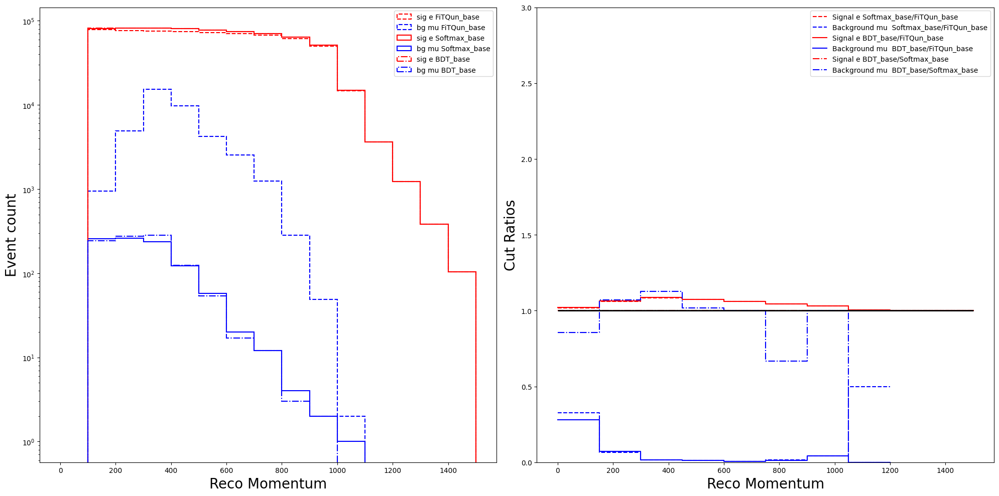

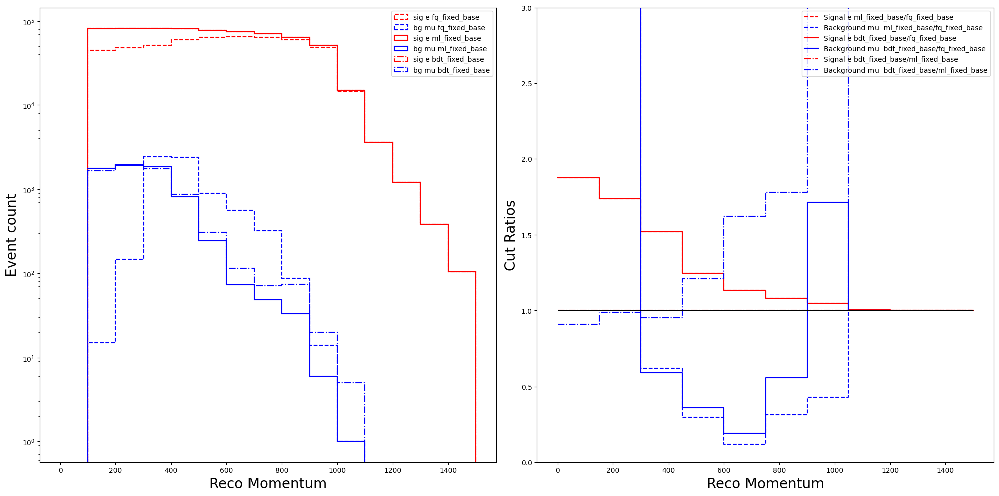

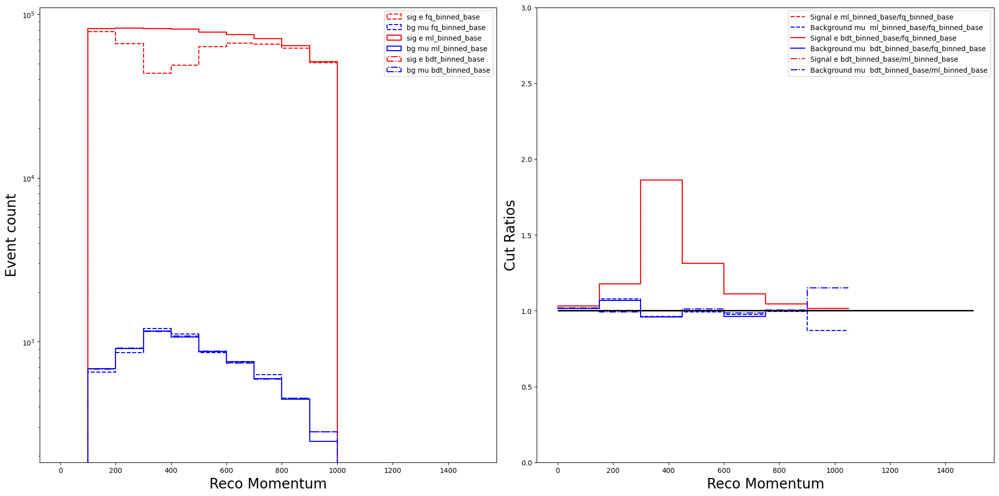

(<Figure size 2000x1000 with 2 Axes>,
 array([<AxesSubplot: xlabel='Reco Momentum', ylabel='Event count'>,
        <AxesSubplot: xlabel='Reco Momentum', ylabel='Cut Ratios'>],
       dtype=object))

In [36]:
plot.sel_comp(df_base, 1, 2, cuts_base, algorithms_base)
plot.sel_comp(df_base, 1, 2, fixed_rejection_cuts_base, ['fq_fixed_base', 'ml_fixed_base', 'bdt_fixed_base'])
plot.sel_comp(df_base, 1, 2, binned_rejection_cuts_base, ['fq_binned_base', 'ml_binned_base', 'bdt_binned_base'])
